<center><h1>1-ab: Introduction to Neural Networks</h1></center>

<center><h2><a href="https://rdfia.github.io/">Course link</a></h2></center>

# Warning :
# Do "File -> Save a copy in Drive" before you start modifying the notebook, otherwise your modifications will not be saved.


In [1]:
import math
import torch
from qtconsole.util import import_item
from torch.autograd import Variable
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
%run utils-data.py

# Part 1 : Forward and backward passes "by hands"

In [4]:
def init_params(nx, nh, ny):
    """
    nx, nh, ny: integers
    out params: dictionnary
    """
    params = {}

    #####################
    ## Your code here  ##
    #####################
    # fill values for Wh, Wy, bh, by

    params["Wh"] = torch.randn(nh, nx) * 0.3
    params["Wy"] = torch.randn(ny, nh) * 0.3
    params["bh"] = torch.randn(nh) * 0.3
    params["by"] = torch.randn(ny) * 0.3
 
    ####################
    ##      END        #
    ####################
    return params

In [2]:
def forward(params, X):
    """
    params: dictionnary
    X: (n_batch, dimension)
    """
    tanh = torch.nn.Tanh()
    outputs = {}

    #####################
    ## Your code here  ##
    #####################
    # fill values for X, htilde, h, ytilde, yhat

    outputs["X"] = X
    outputs["htilde"] = outputs['X'].mm(params['Wh'].t()) + params['bh'].unsqueeze(0)
    outputs["h"] = tanh(outputs["htilde"])
    outputs["ytilde"] = outputs['h'].mm(params['Wy'].t()) + params['by'].unsqueeze(0)
    outputs["yhat"] = torch.nn.functional.softmax(outputs["ytilde"], dim=1)

    ####################
    ##      END        #
    ####################

    return outputs['yhat'], outputs

In [11]:
def loss_accuracy(Yhat: torch.tensor, Y: torch.tensor):

    #####################
    ## Your code here  ##
    #####################
    
    _, index_yhat = torch.max(Yhat, 1)
    _, index_y = torch.max(Y, 1)

    L = -(torch.log(Yhat) * Y).sum(1).mean()
    acc = torch.count_nonzero(index_yhat == index_y) / torch.numel(index_yhat) * 100

    ####################
    ##      END        #
    ####################

    return L, acc

In [12]:
def backward(params, outputs, Y):
    bsize = Y.shape[0]
    output_grad = outputs['yhat'] - Y
    h_grad = output_grad.mm(params['Wy'])
    h_tilde_grad = h_grad * (1 - outputs['h'] ** 2)
    grads = {}

    #####################
    ## Your code here  ##
    #####################
    # fill values for Wy, Wh, by, bh

    grads["Wy"] = output_grad.t().mm(outputs['h'])
    grads["Wh"] = h_tilde_grad.t().mm(outputs['X'])
    grads["by"] = output_grad.sum(0)
    grads["bh"] = h_tilde_grad.sum(0)

    ####################
    ##      END        #
    ####################
    return grads

In [8]:
def sgd(params, grads, eta):

    #####################
    ## Your code here  ##
    #####################
    # update the params values

    params["Wh"] = params['Wh'] - eta * grads['Wh']
    params["Wy"] = params['Wy'] - eta * grads['Wy']
    params["bh"] = params['bh'] - eta * grads['bh']
    params["by"] = params['by'] - eta * grads['by']

    ####################
    ##      END        #
    ####################
    return params

## Global learning procedure "by hands"

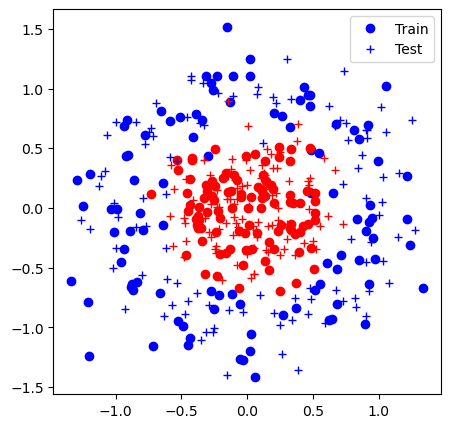

Iter 0: Acc train 45.0% (68.37), acc test 41.0% (68.39)


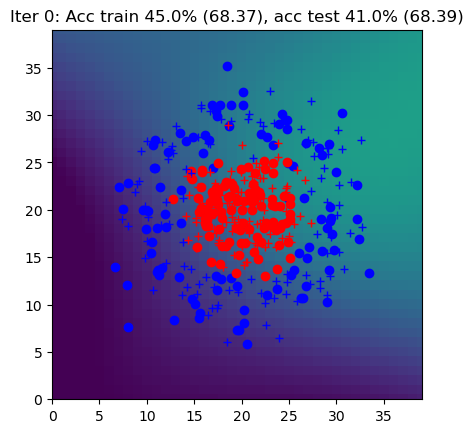

Iter 1: Acc train 61.0% (66.07), acc test 65.5% (66.29)


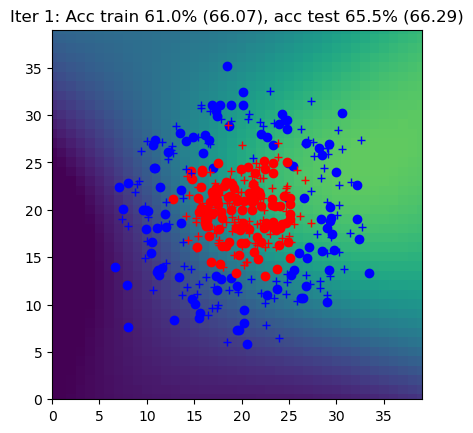

Iter 2: Acc train 61.5% (64.49), acc test 66.0% (64.61)


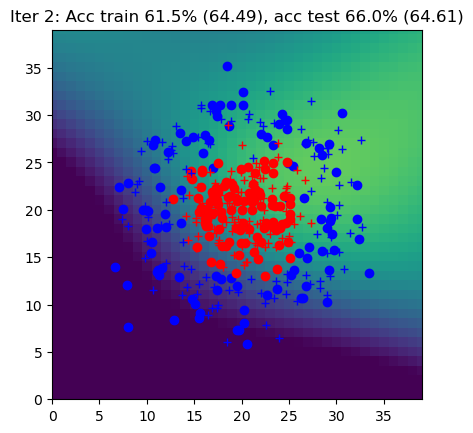

Iter 3: Acc train 58.5% (63.86), acc test 53.5% (64.54)


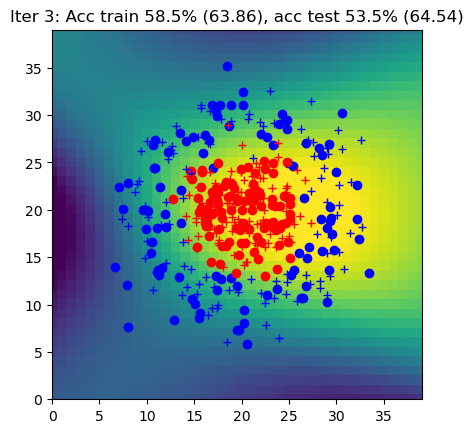

Iter 4: Acc train 85.0% (57.05), acc test 85.0% (57.48)


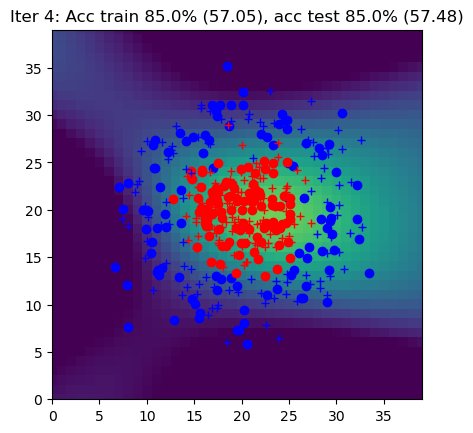

Iter 5: Acc train 86.0% (52.22), acc test 88.0% (52.53)


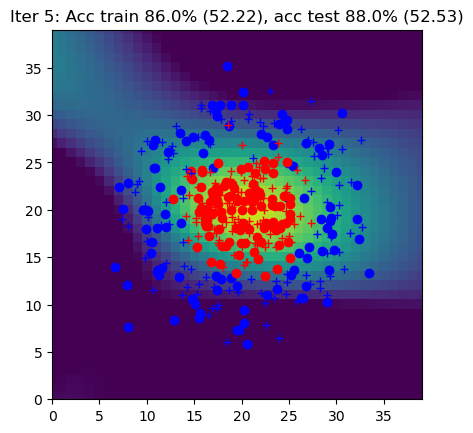

Iter 6: Acc train 78.0% (50.06), acc test 75.0% (50.89)


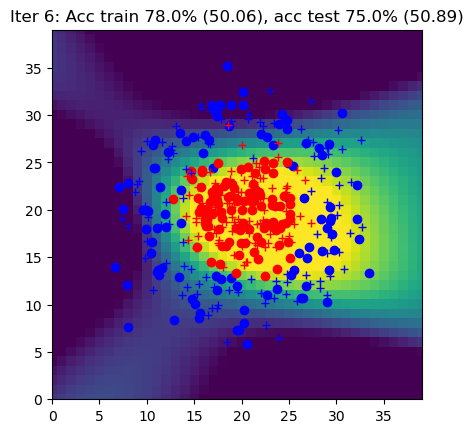

Iter 7: Acc train 84.0% (47.73), acc test 83.5% (48.33)


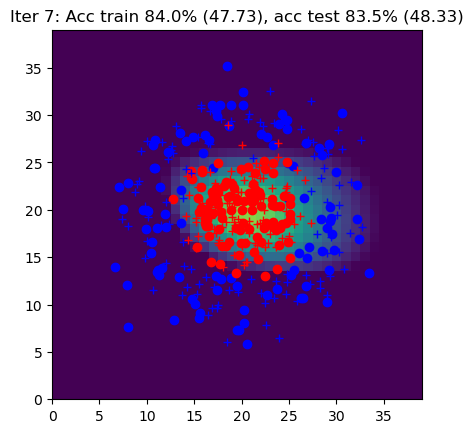

Iter 8: Acc train 93.0% (38.22), acc test 92.0% (39.51)


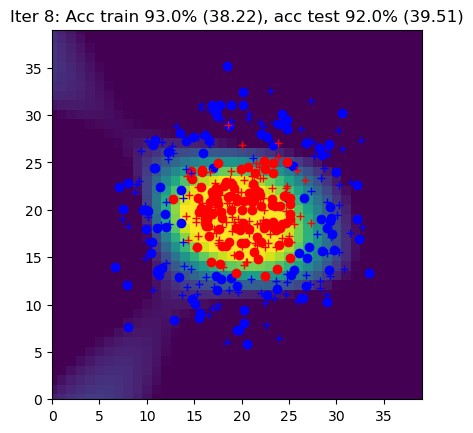

Iter 9: Acc train 93.0% (33.70), acc test 95.5% (34.52)


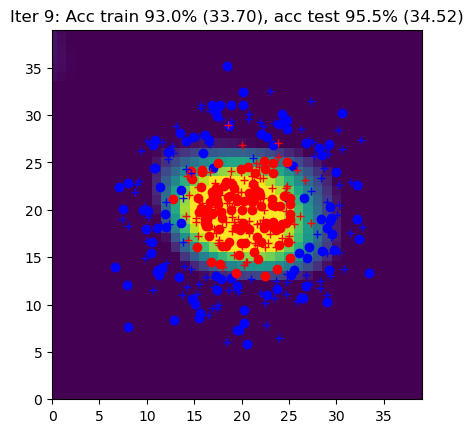

Iter 10: Acc train 92.5% (30.34), acc test 92.5% (31.47)


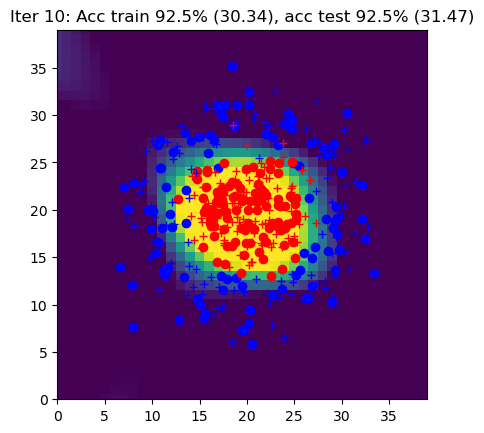

Iter 11: Acc train 92.5% (28.60), acc test 93.0% (28.44)


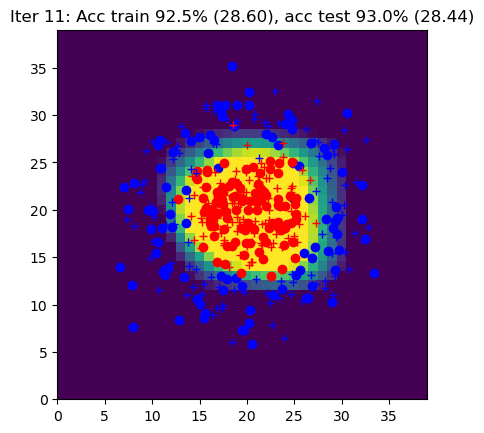

Iter 12: Acc train 96.0% (24.28), acc test 94.0% (25.20)


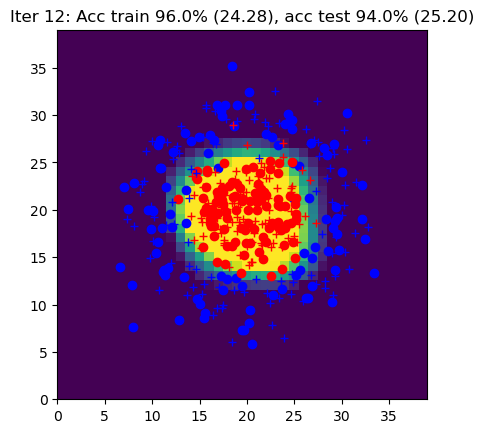

Iter 13: Acc train 93.5% (23.66), acc test 95.0% (23.66)


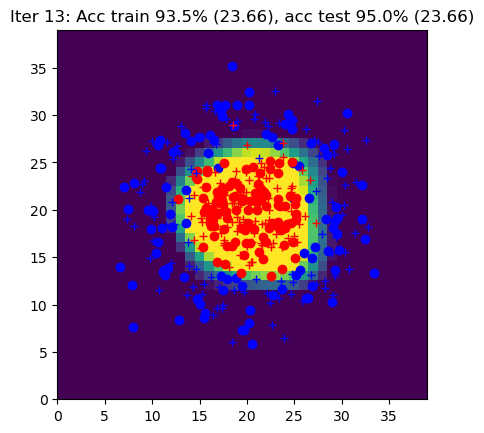

Iter 14: Acc train 92.5% (21.80), acc test 93.5% (22.53)


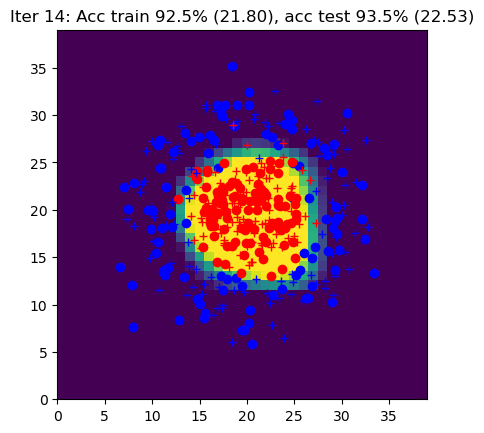

Iter 15: Acc train 95.5% (19.71), acc test 94.5% (21.47)


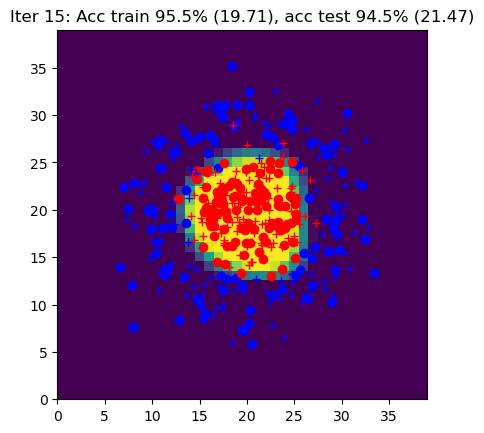

Iter 16: Acc train 96.0% (18.18), acc test 95.5% (19.58)


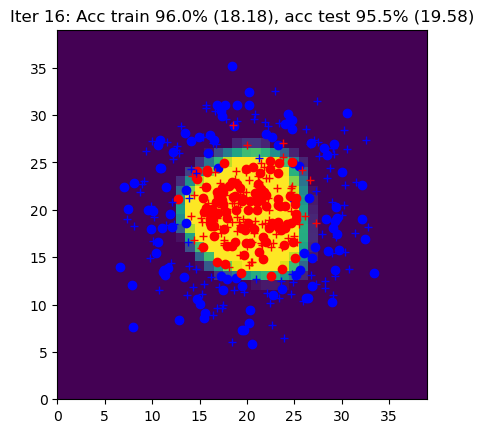

Iter 17: Acc train 94.0% (20.00), acc test 96.5% (18.86)


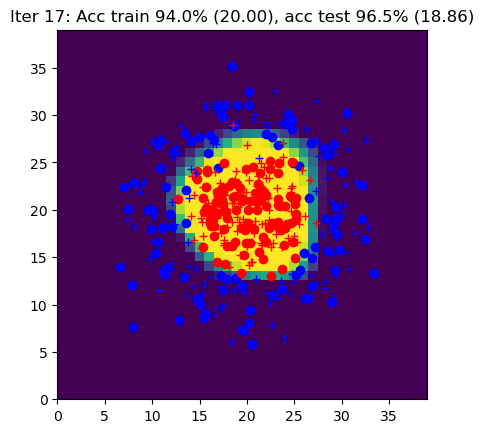

Iter 18: Acc train 93.0% (19.38), acc test 94.0% (21.93)


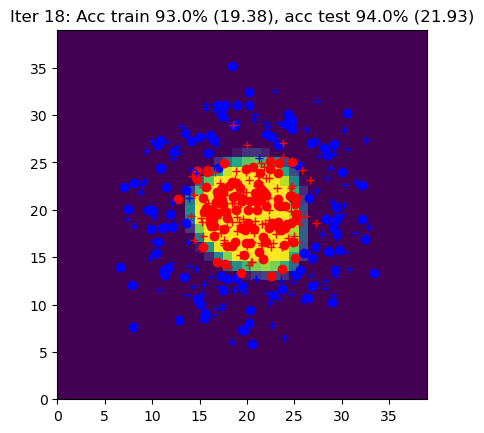

Iter 19: Acc train 94.0% (18.46), acc test 91.5% (20.53)


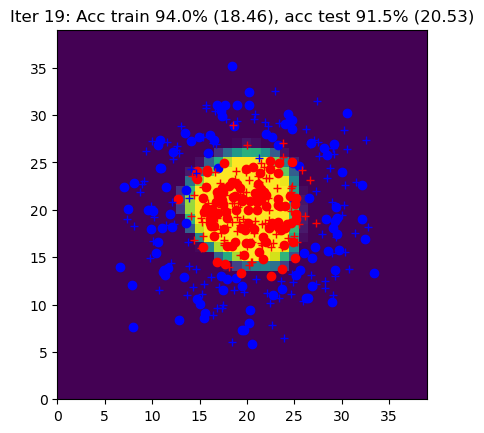

Iter 20: Acc train 94.5% (16.39), acc test 94.0% (19.89)


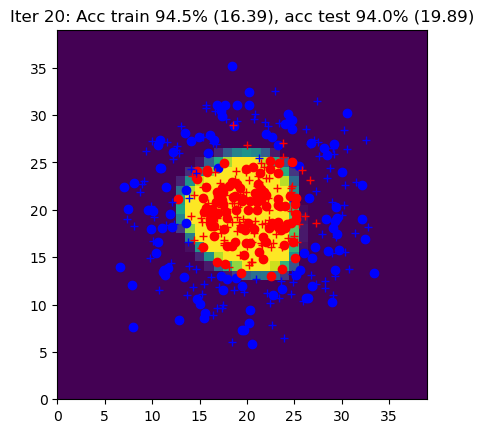

Iter 21: Acc train 96.0% (15.06), acc test 94.5% (16.29)


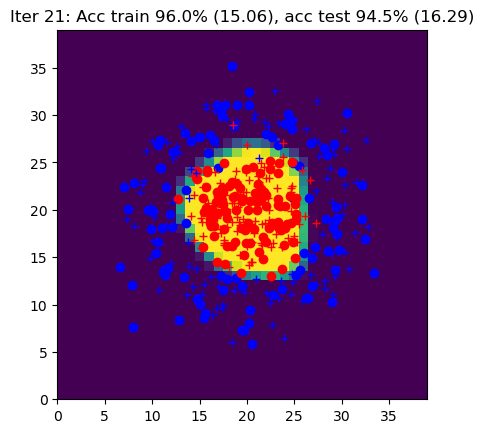

Iter 22: Acc train 93.0% (16.13), acc test 92.5% (19.30)


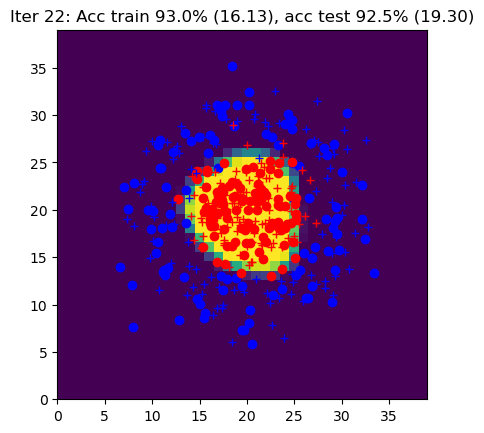

Iter 23: Acc train 96.0% (14.47), acc test 94.0% (16.17)


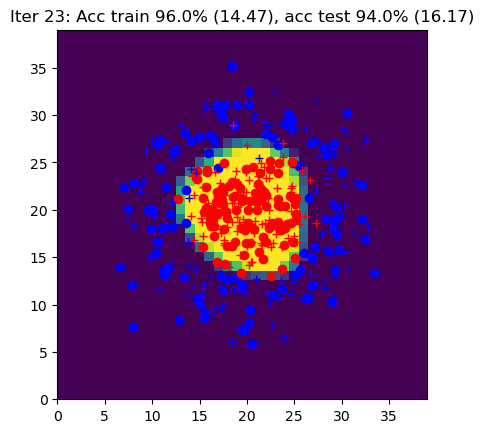

Iter 24: Acc train 93.0% (15.59), acc test 93.0% (18.53)


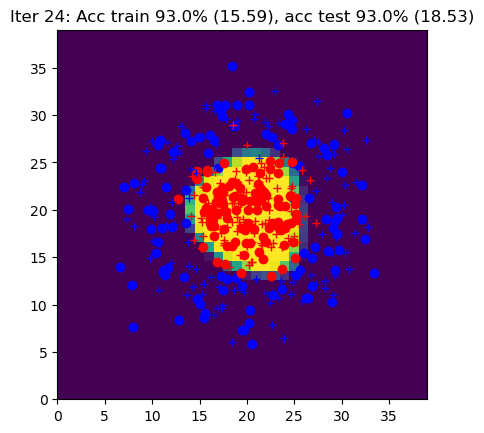

Iter 25: Acc train 97.5% (13.75), acc test 95.0% (15.38)


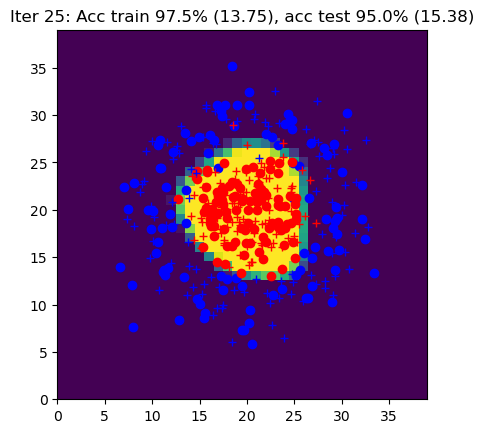

Iter 26: Acc train 96.0% (13.34), acc test 93.5% (16.71)


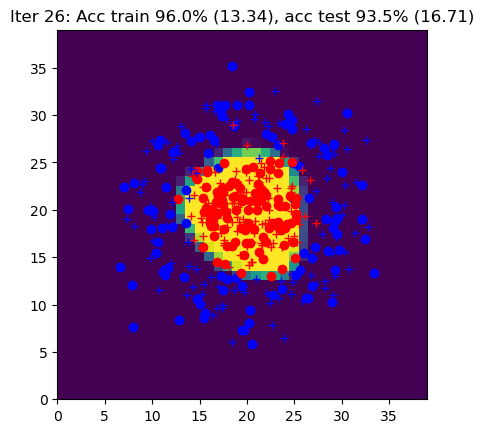

Iter 27: Acc train 95.0% (13.39), acc test 94.0% (15.18)


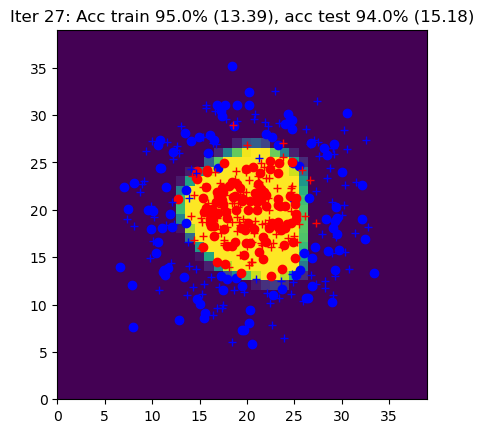

Iter 28: Acc train 96.0% (12.94), acc test 94.0% (15.02)


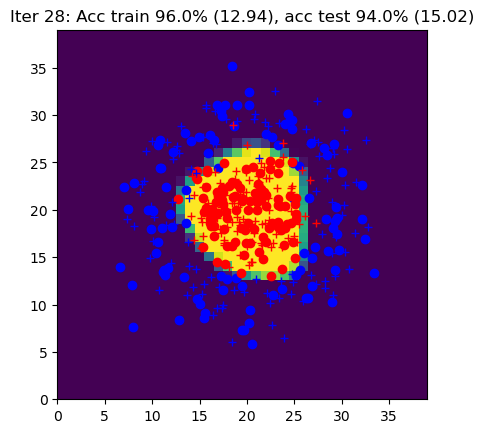

Iter 29: Acc train 96.5% (12.92), acc test 93.5% (17.14)


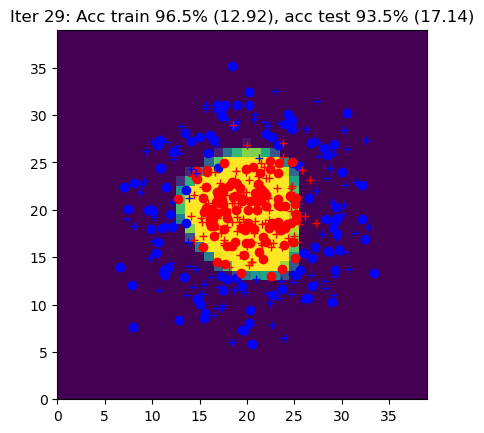

Iter 30: Acc train 95.5% (12.41), acc test 93.0% (15.46)


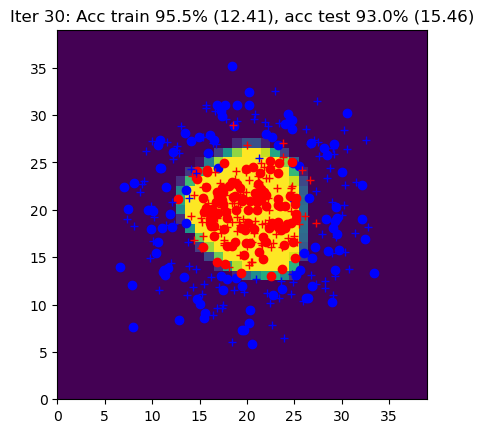

Iter 31: Acc train 96.0% (12.17), acc test 93.5% (16.20)


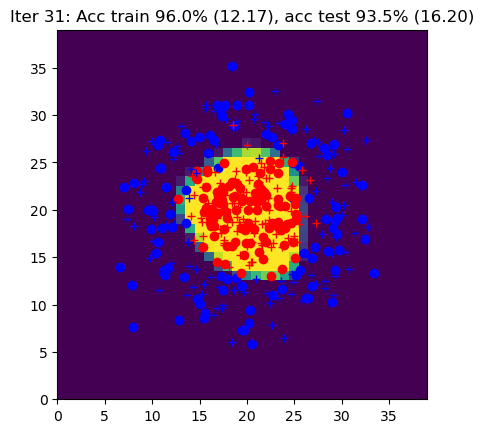

Iter 32: Acc train 97.5% (12.16), acc test 95.0% (15.38)


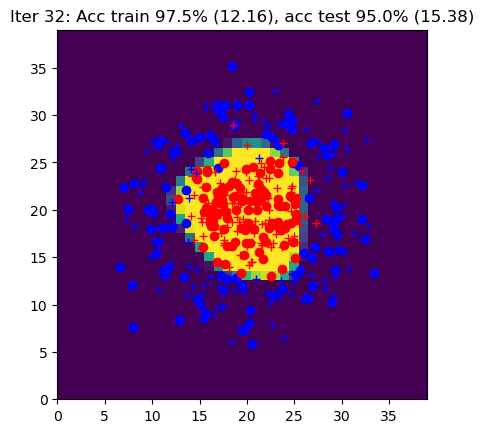

Iter 33: Acc train 95.5% (12.15), acc test 93.5% (15.80)


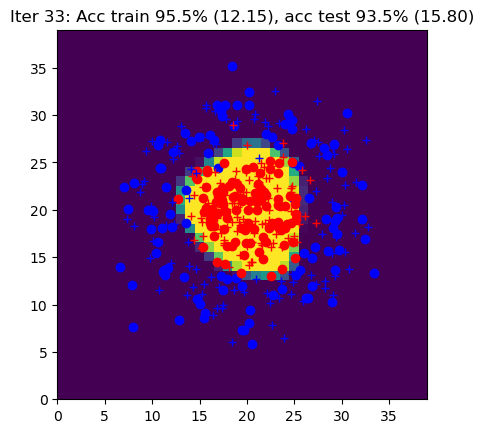

Iter 34: Acc train 95.5% (12.31), acc test 94.5% (14.52)


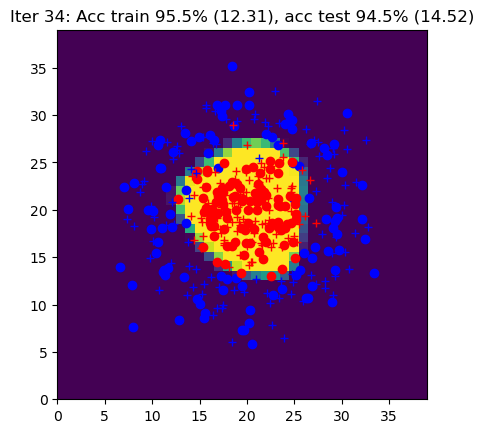

Iter 35: Acc train 93.5% (14.59), acc test 93.5% (16.57)


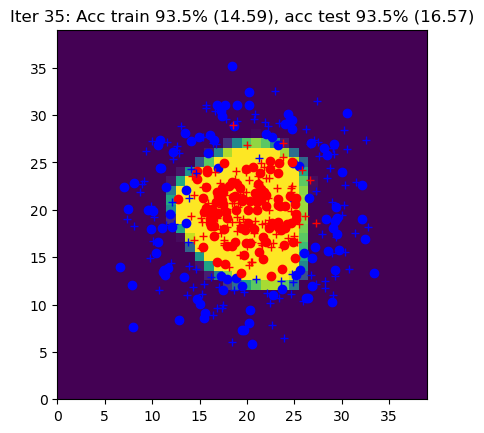

Iter 36: Acc train 96.5% (13.05), acc test 94.5% (14.20)


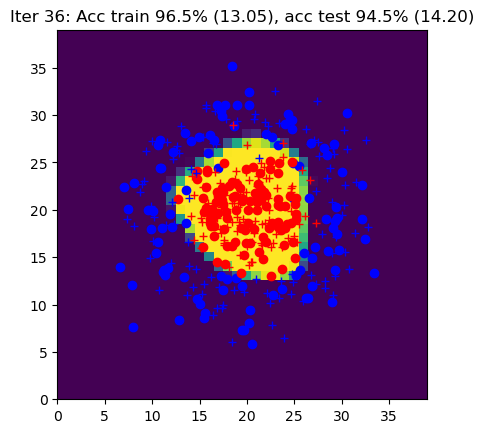

Iter 37: Acc train 94.5% (12.32), acc test 92.5% (17.78)


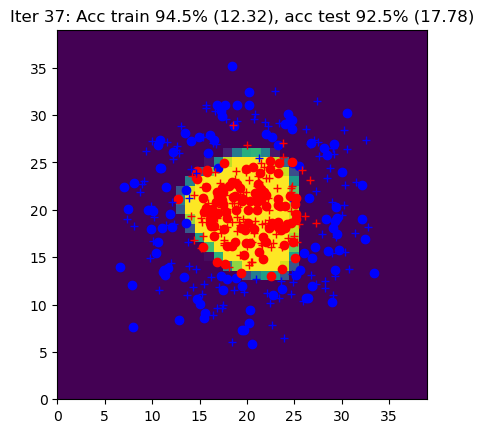

Iter 38: Acc train 95.5% (12.60), acc test 92.5% (18.99)


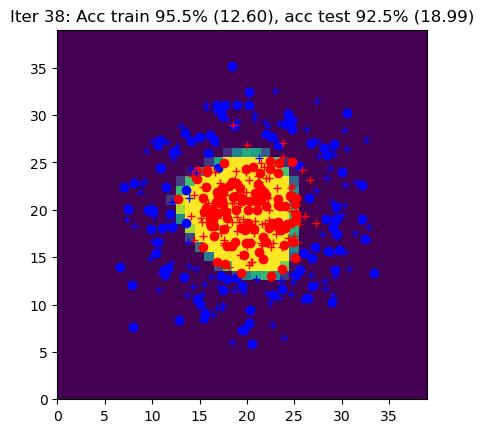

Iter 39: Acc train 94.5% (12.16), acc test 93.0% (17.96)


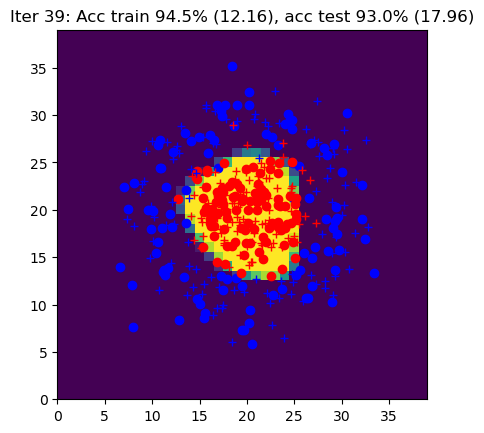

Iter 40: Acc train 96.0% (11.09), acc test 94.0% (15.04)


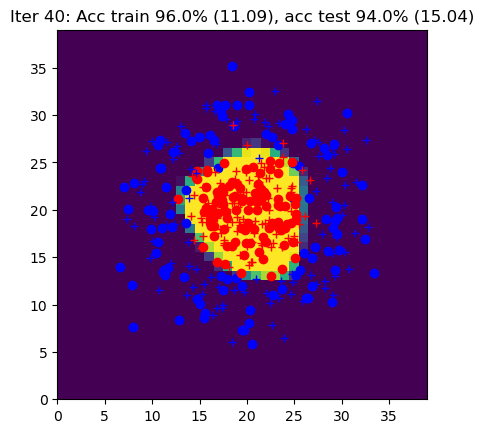

Iter 41: Acc train 96.5% (11.07), acc test 93.5% (14.42)


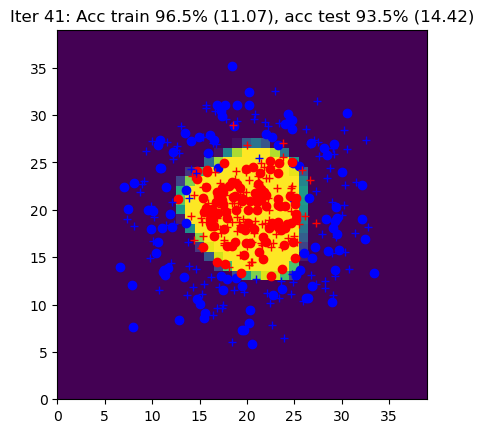

Iter 42: Acc train 92.0% (14.06), acc test 92.0% (19.76)


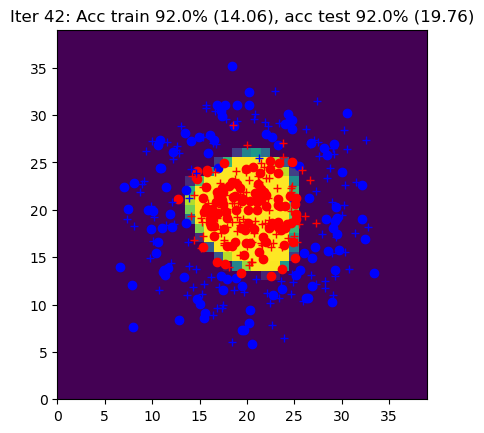

Iter 43: Acc train 96.0% (11.04), acc test 93.5% (16.49)


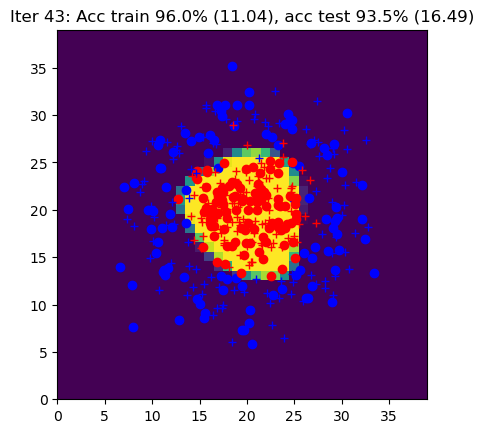

Iter 44: Acc train 96.5% (11.18), acc test 92.0% (16.90)


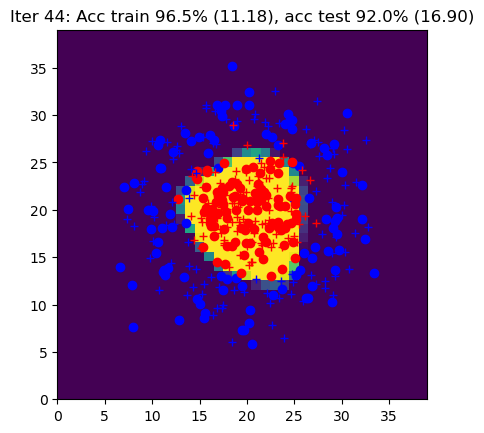

Iter 45: Acc train 94.0% (14.24), acc test 94.0% (15.95)


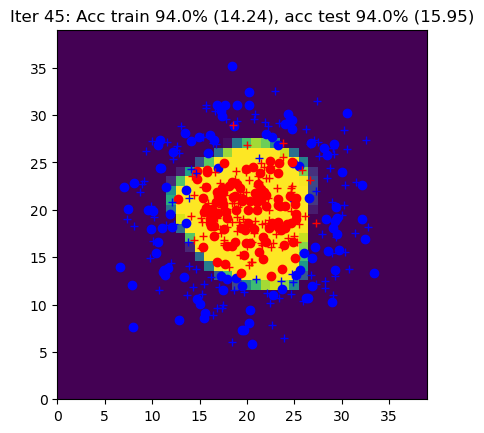

Iter 46: Acc train 96.0% (10.79), acc test 92.5% (16.48)


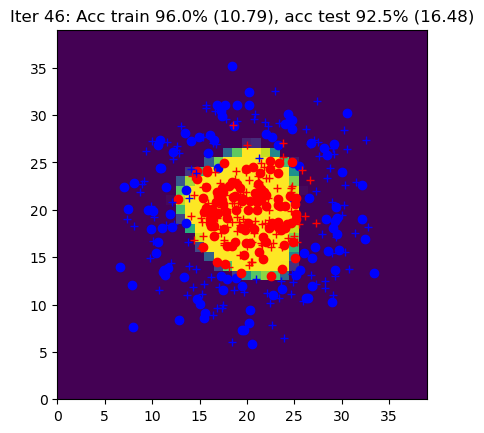

Iter 47: Acc train 97.0% (11.11), acc test 93.0% (16.42)


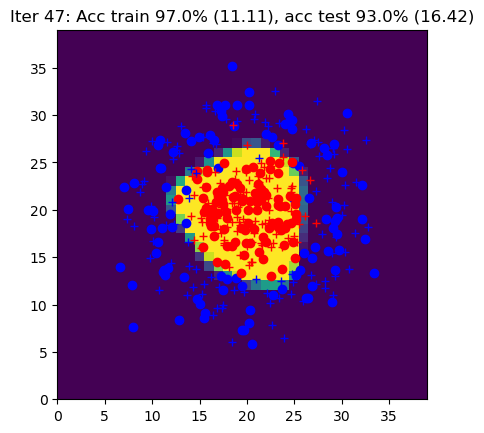

Iter 48: Acc train 93.0% (12.82), acc test 92.5% (18.81)


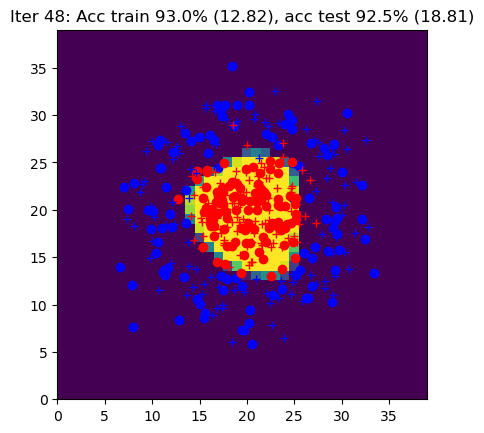

Iter 49: Acc train 95.5% (11.89), acc test 94.5% (14.35)


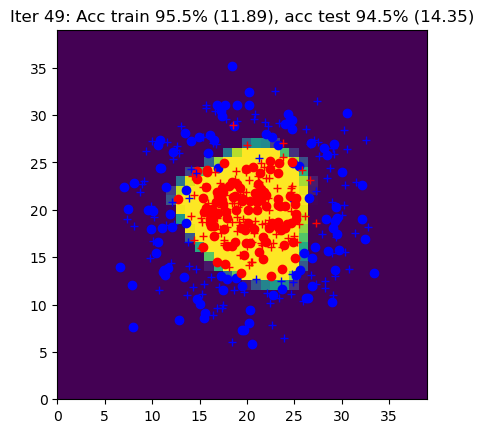

Iter 50: Acc train 97.5% (10.32), acc test 93.5% (15.20)


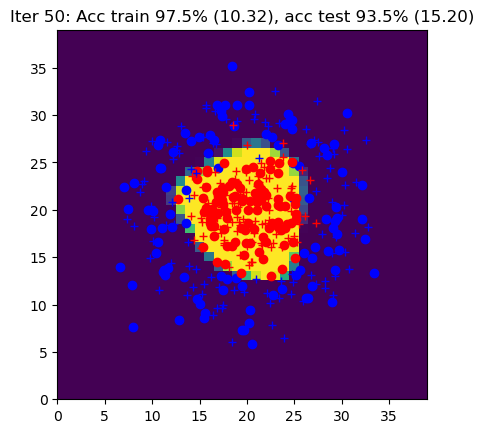

Iter 51: Acc train 90.5% (13.81), acc test 91.5% (21.42)


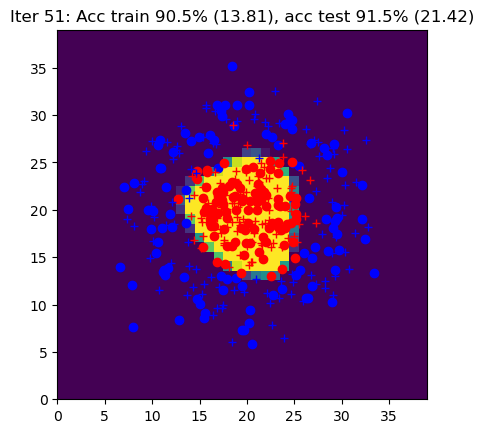

Iter 52: Acc train 97.0% (11.30), acc test 93.0% (16.18)


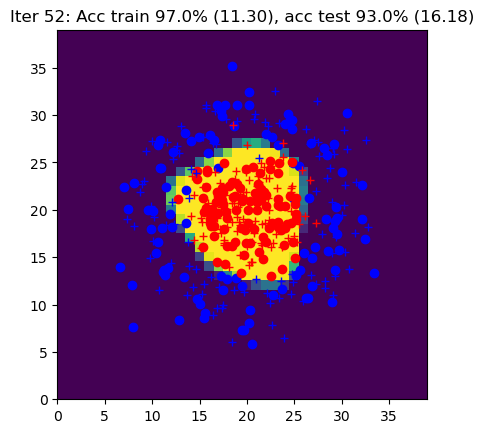

Iter 53: Acc train 96.0% (10.74), acc test 92.5% (17.25)


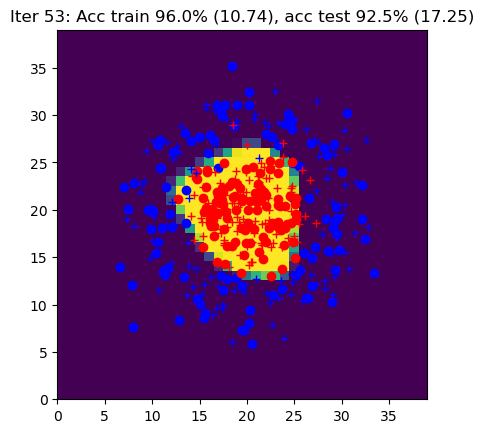

Iter 54: Acc train 94.0% (13.76), acc test 93.5% (15.85)


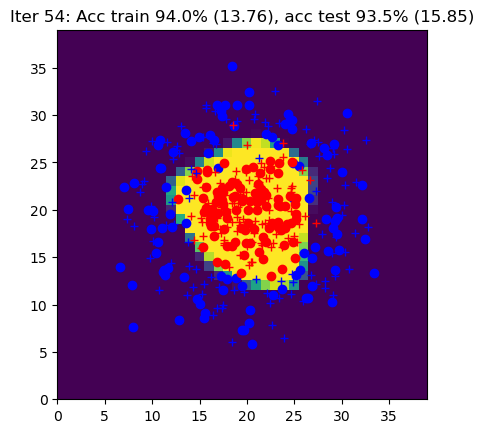

Iter 55: Acc train 97.5% (10.39), acc test 93.0% (15.27)


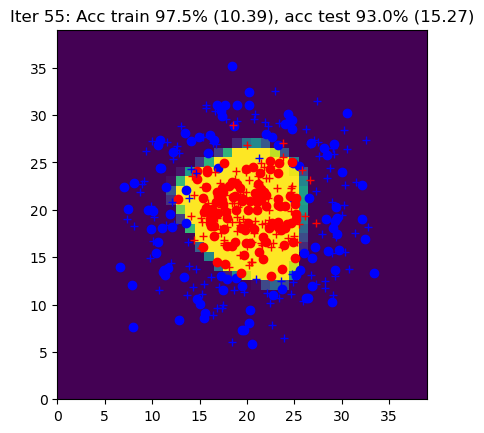

Iter 56: Acc train 96.0% (10.10), acc test 92.0% (16.19)


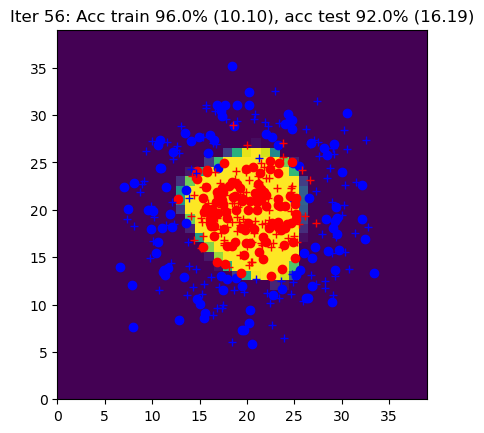

Iter 57: Acc train 96.5% (10.65), acc test 92.5% (15.84)


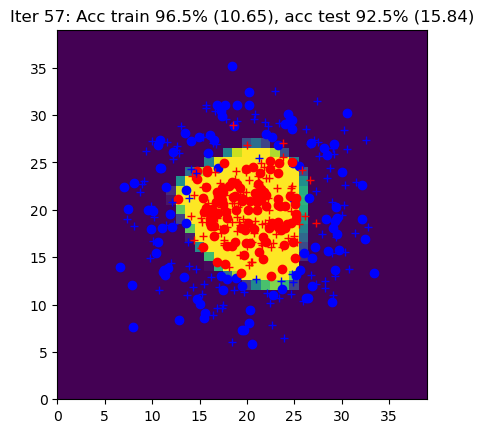

Iter 58: Acc train 96.5% (10.13), acc test 93.0% (17.04)


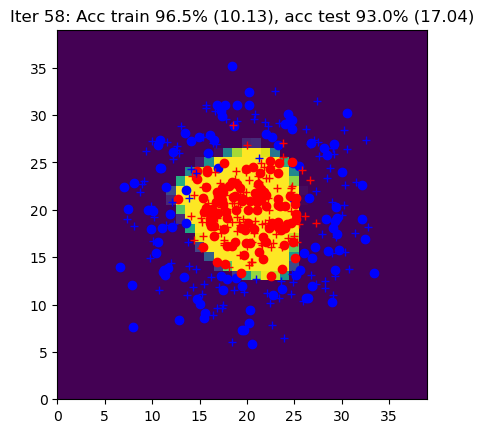

Iter 59: Acc train 94.0% (11.32), acc test 92.0% (17.34)


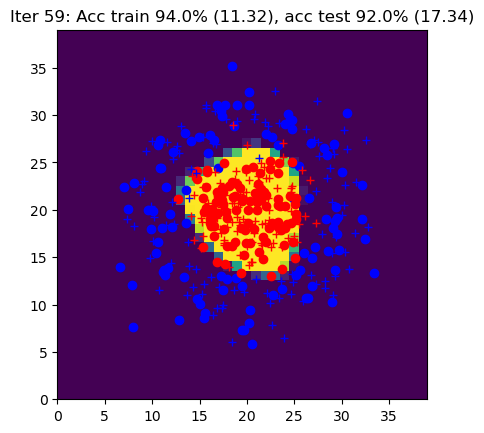

Iter 60: Acc train 96.0% (10.26), acc test 92.5% (17.58)


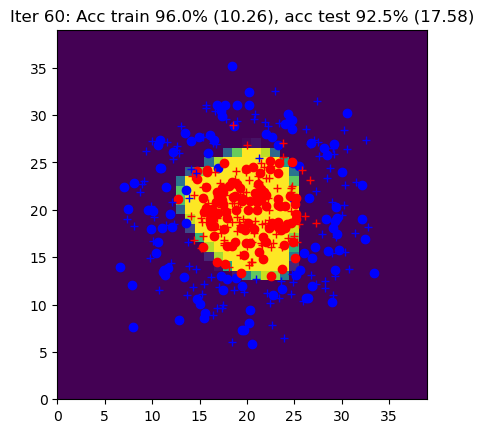

Iter 61: Acc train 97.0% (9.99), acc test 93.0% (16.44)


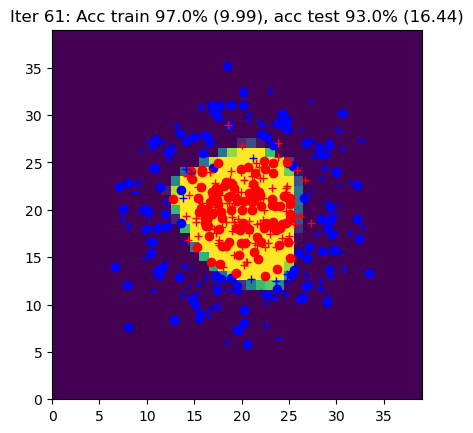

Iter 62: Acc train 97.5% (9.72), acc test 92.0% (16.28)


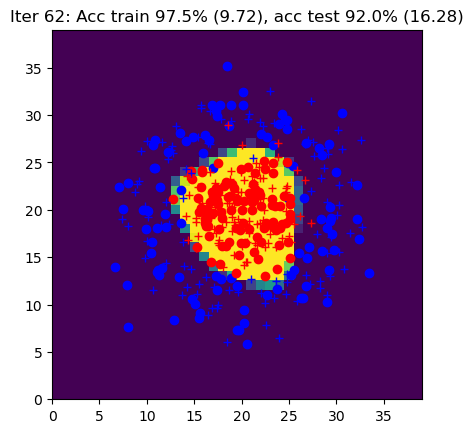

Iter 63: Acc train 97.0% (11.52), acc test 93.5% (14.32)


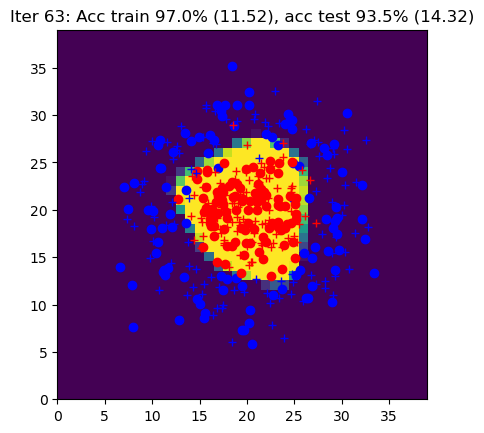

Iter 64: Acc train 96.0% (9.99), acc test 92.5% (17.14)


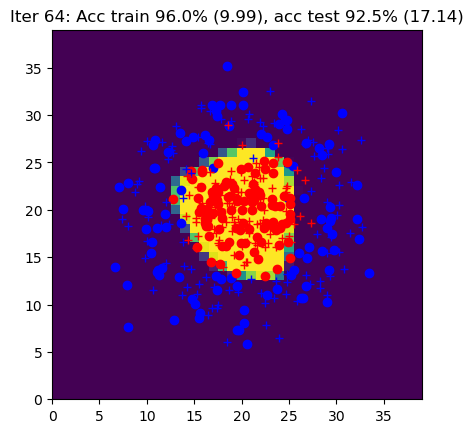

Iter 65: Acc train 97.0% (9.98), acc test 93.0% (17.39)


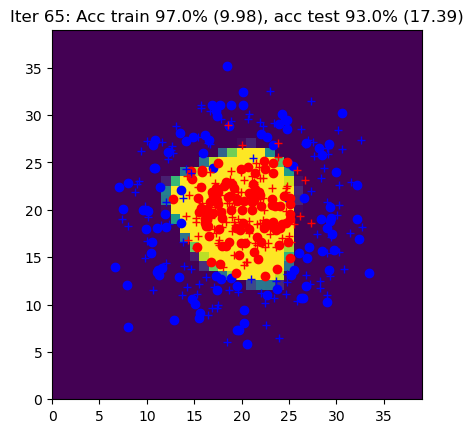

Iter 66: Acc train 97.5% (10.06), acc test 92.5% (15.48)


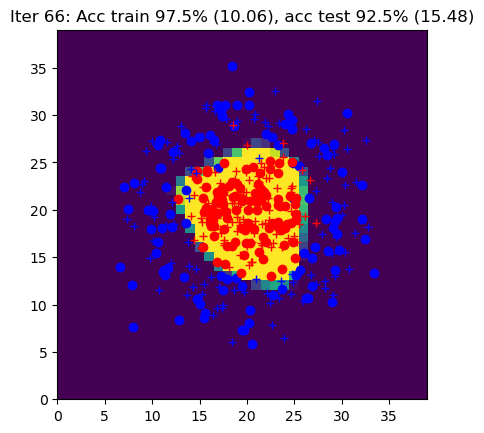

Iter 67: Acc train 96.5% (9.53), acc test 92.0% (16.82)


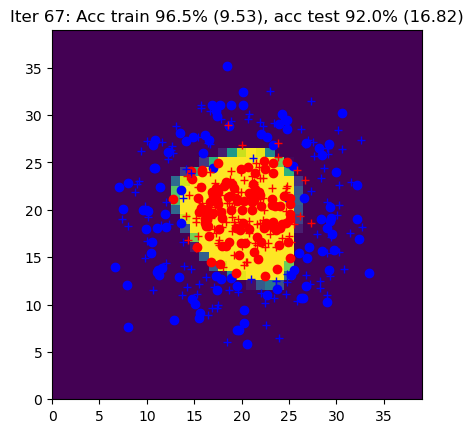

Iter 68: Acc train 97.0% (9.64), acc test 93.5% (15.89)


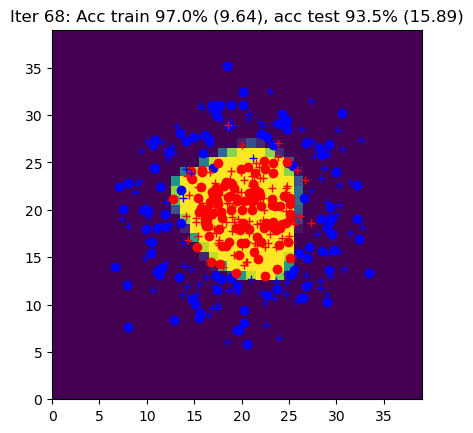

Iter 69: Acc train 97.0% (9.69), acc test 92.5% (18.25)


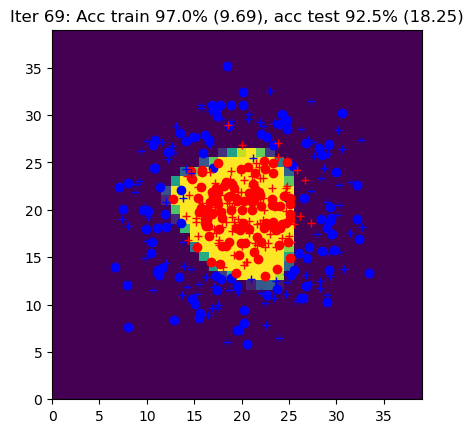

Iter 70: Acc train 95.0% (11.97), acc test 93.0% (17.09)


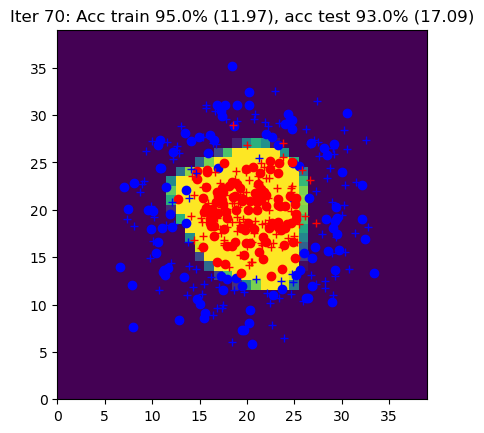

Iter 71: Acc train 98.0% (9.84), acc test 92.5% (15.33)


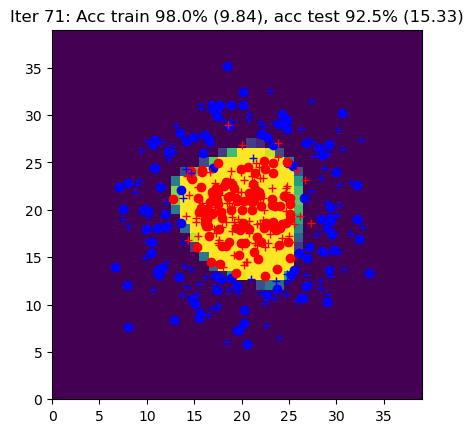

Iter 72: Acc train 96.0% (9.61), acc test 92.0% (16.17)


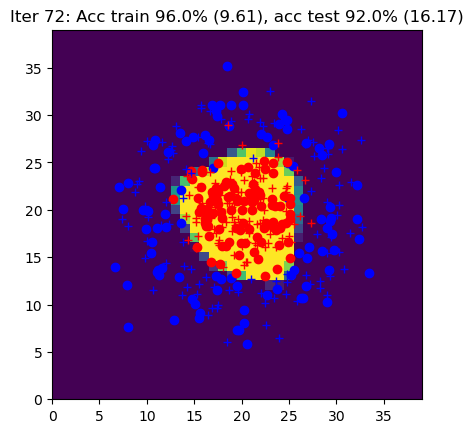

Iter 73: Acc train 98.0% (9.28), acc test 93.0% (16.51)


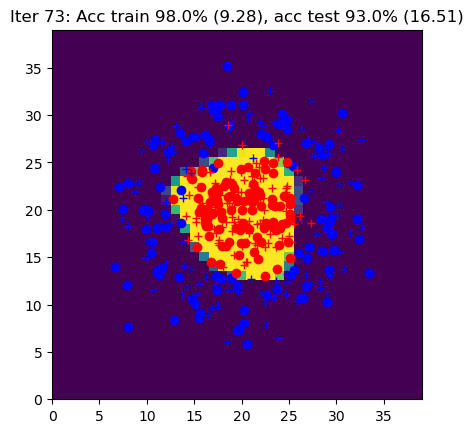

Iter 74: Acc train 95.5% (12.66), acc test 93.5% (16.59)


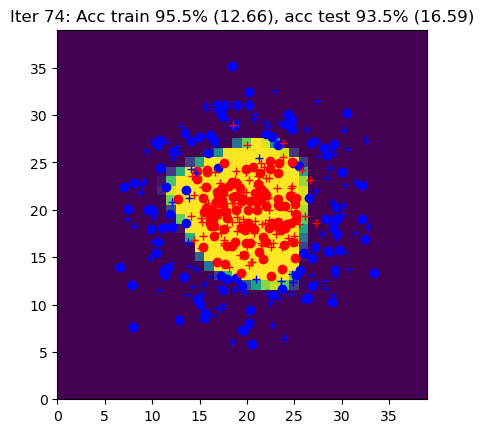

Iter 75: Acc train 94.0% (11.95), acc test 91.0% (19.54)


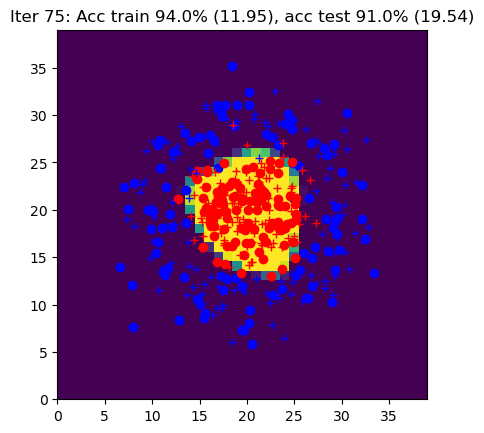

Iter 76: Acc train 94.5% (11.27), acc test 92.5% (19.92)


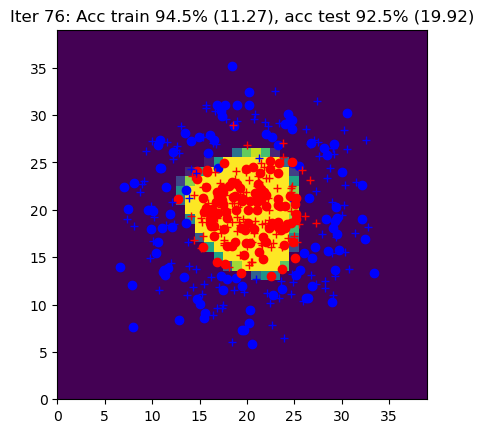

Iter 77: Acc train 96.0% (9.56), acc test 93.0% (16.53)


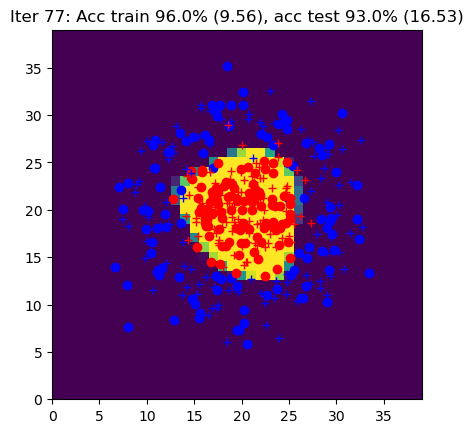

Iter 78: Acc train 98.0% (9.23), acc test 92.5% (15.78)


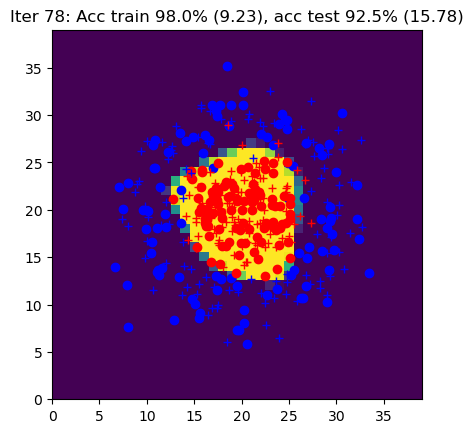

Iter 79: Acc train 96.0% (9.33), acc test 92.5% (16.68)


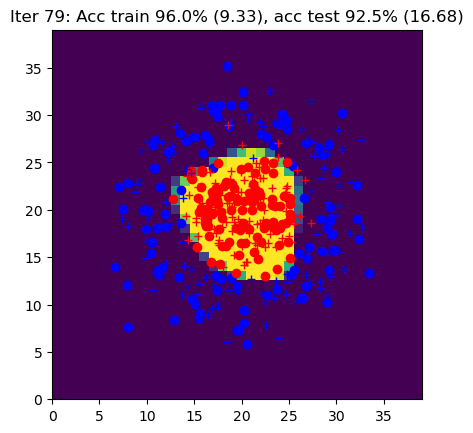

Iter 80: Acc train 93.5% (11.49), acc test 92.0% (20.60)


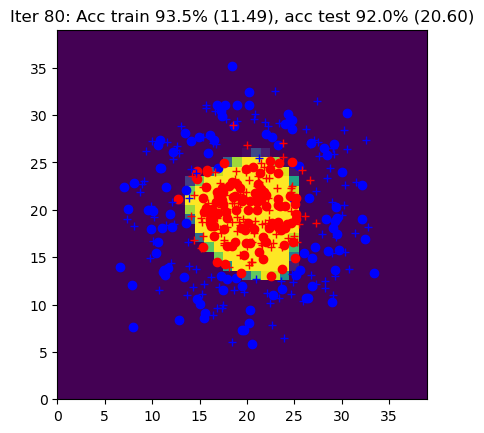

Iter 81: Acc train 98.0% (9.18), acc test 92.5% (15.75)


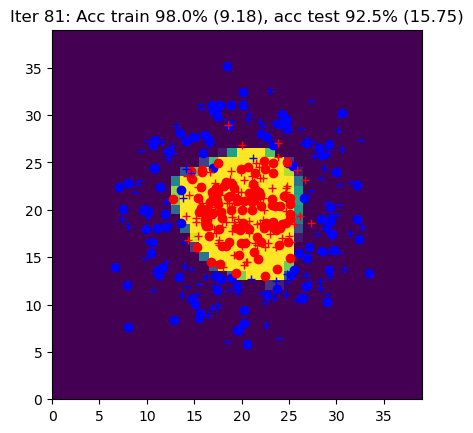

Iter 82: Acc train 96.5% (9.95), acc test 93.5% (16.60)


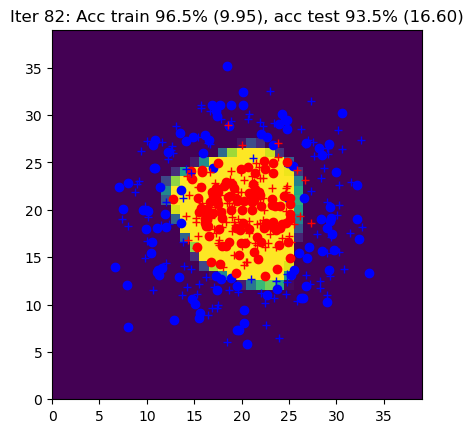

Iter 83: Acc train 95.0% (11.18), acc test 92.0% (21.73)


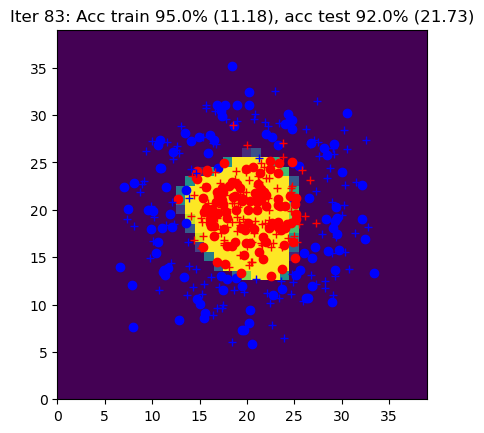

Iter 84: Acc train 97.5% (9.23), acc test 92.5% (16.21)


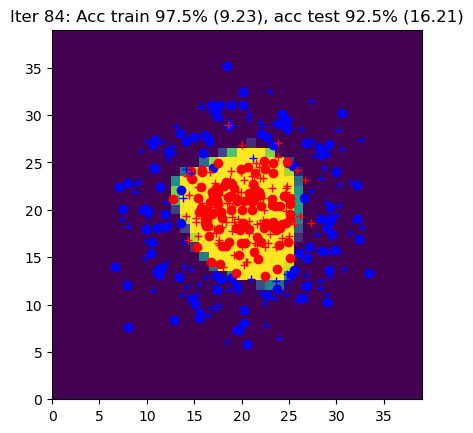

Iter 85: Acc train 95.5% (9.77), acc test 92.5% (18.24)


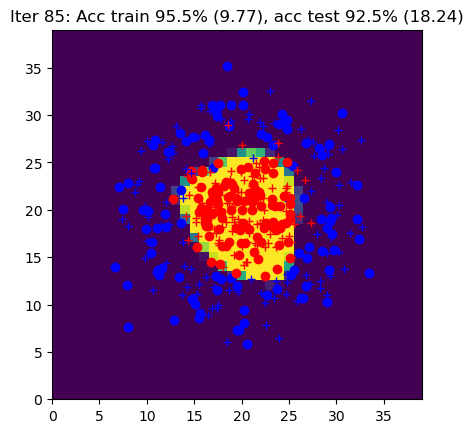

Iter 86: Acc train 97.0% (9.33), acc test 93.5% (17.98)


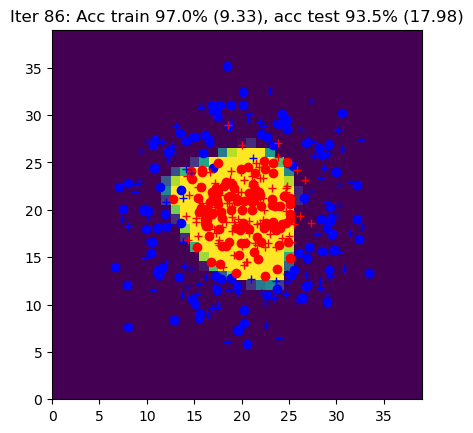

Iter 87: Acc train 94.5% (10.20), acc test 92.0% (18.42)


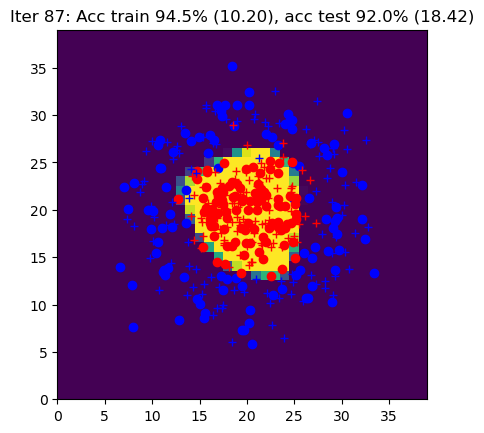

Iter 88: Acc train 98.0% (9.45), acc test 92.5% (15.20)


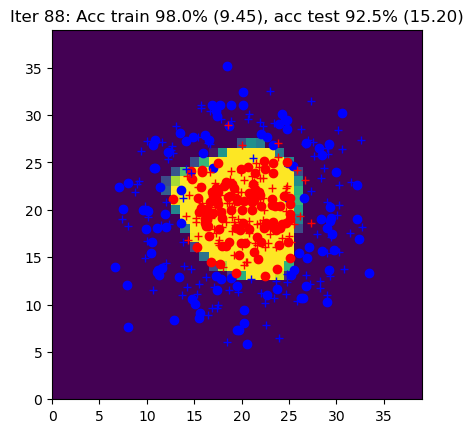

Iter 89: Acc train 97.0% (8.88), acc test 92.5% (16.81)


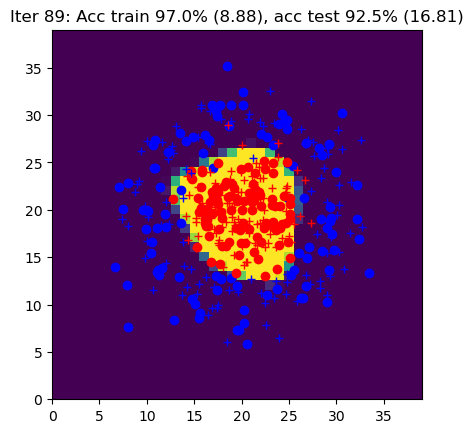

Iter 90: Acc train 96.5% (9.77), acc test 93.0% (16.55)


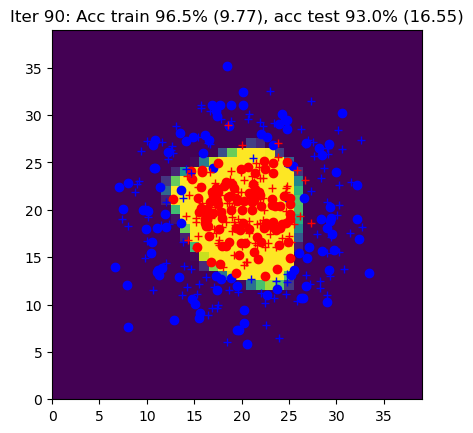

Iter 91: Acc train 98.0% (9.89), acc test 93.5% (15.54)


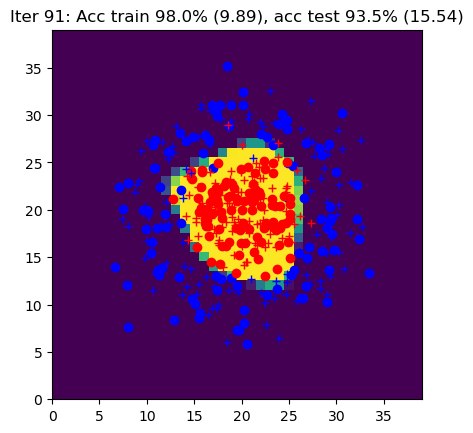

Iter 92: Acc train 95.5% (9.45), acc test 93.0% (17.52)


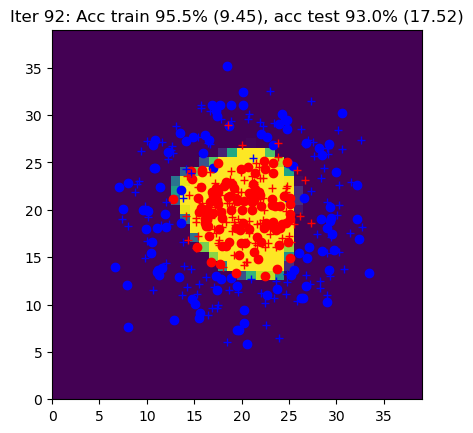

Iter 93: Acc train 96.0% (9.86), acc test 93.5% (15.87)


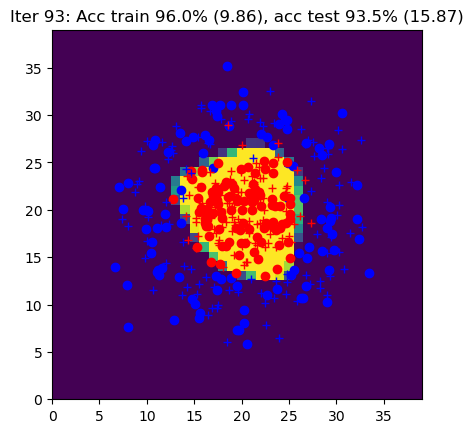

Iter 94: Acc train 98.0% (9.26), acc test 93.0% (16.38)


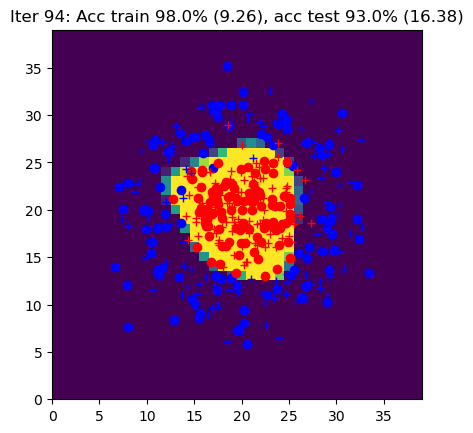

Iter 95: Acc train 97.0% (9.71), acc test 93.5% (17.33)


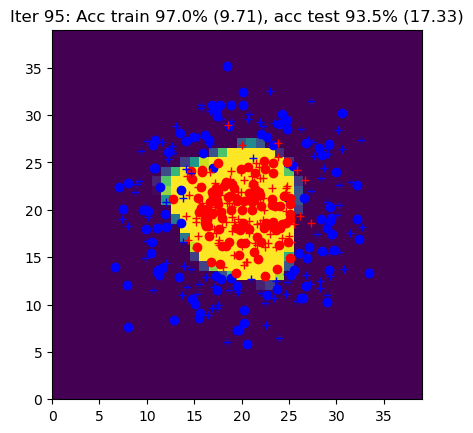

Iter 96: Acc train 97.5% (8.77), acc test 93.0% (17.22)


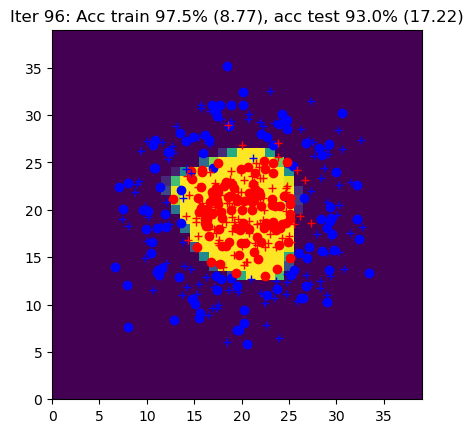

Iter 97: Acc train 97.0% (9.03), acc test 92.5% (16.92)


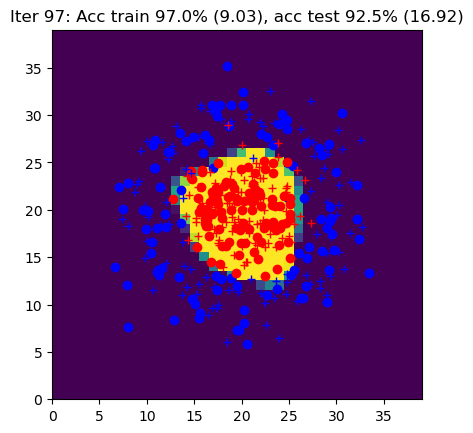

Iter 98: Acc train 97.5% (8.98), acc test 92.0% (17.45)


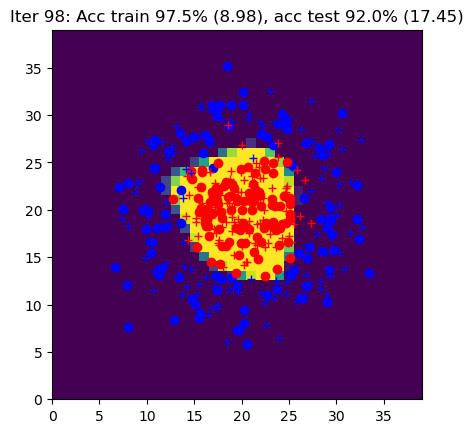

Iter 99: Acc train 97.0% (8.87), acc test 93.0% (18.64)


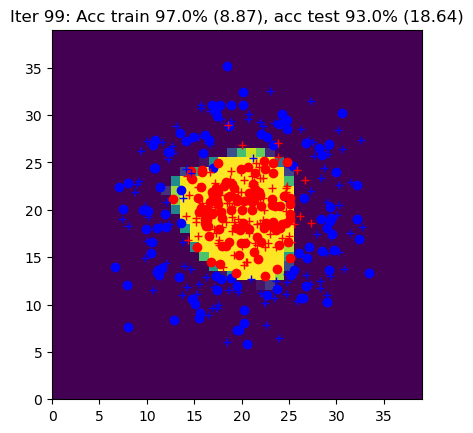

Iter 100: Acc train 97.0% (8.71), acc test 93.5% (16.46)


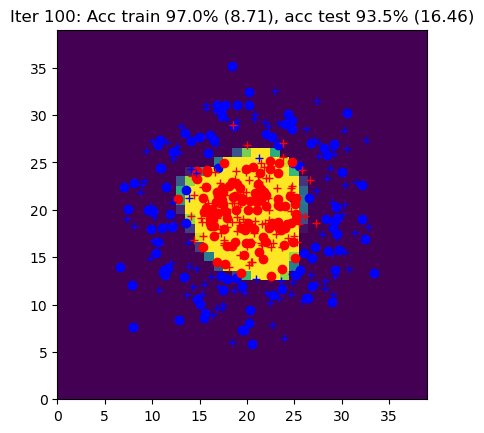

Iter 101: Acc train 97.5% (8.97), acc test 92.5% (18.06)


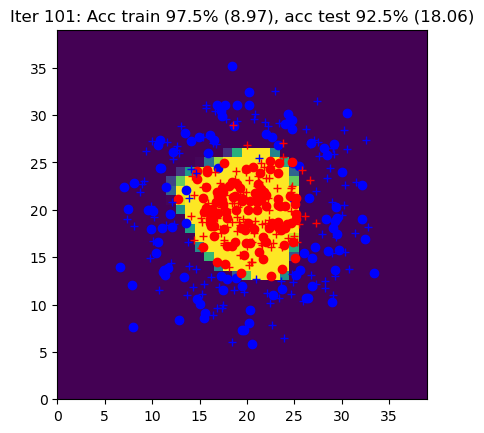

Iter 102: Acc train 97.5% (8.61), acc test 93.0% (17.06)


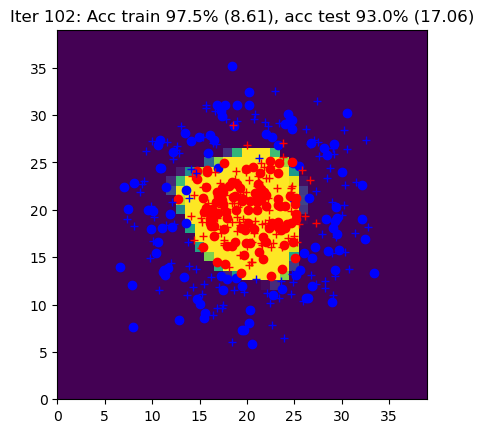

Iter 103: Acc train 95.0% (9.22), acc test 93.5% (17.89)


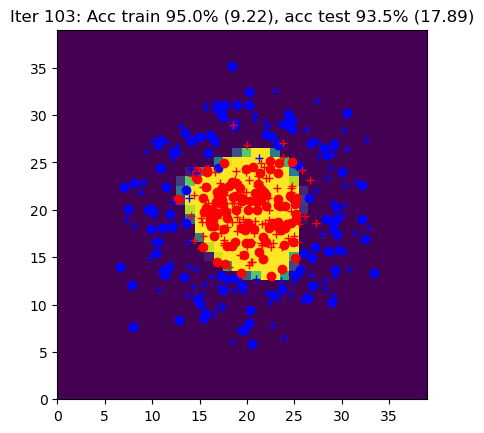

Iter 104: Acc train 96.5% (10.64), acc test 93.0% (16.47)


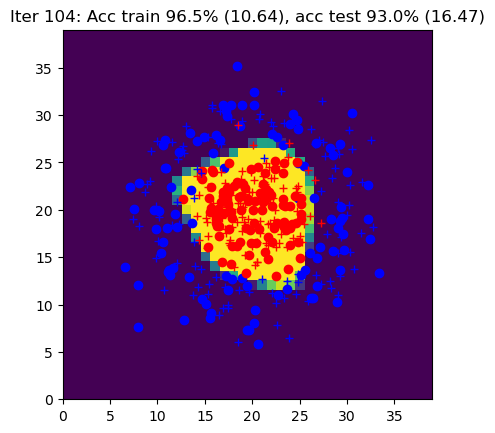

Iter 105: Acc train 94.0% (11.14), acc test 91.5% (21.37)


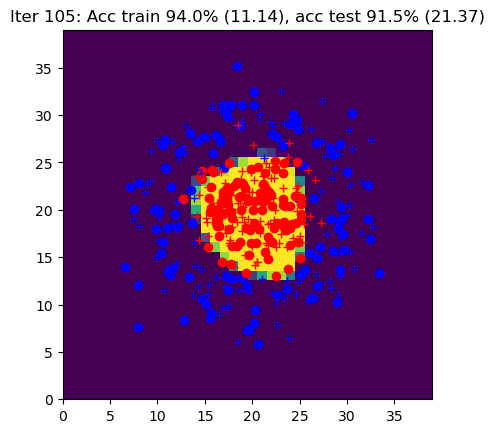

Iter 106: Acc train 96.5% (8.98), acc test 92.5% (18.29)


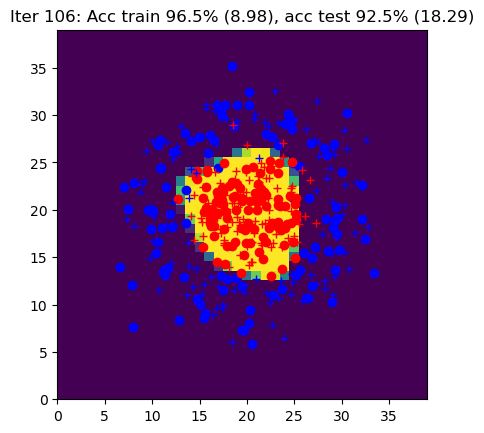

Iter 107: Acc train 97.0% (9.40), acc test 93.0% (15.74)


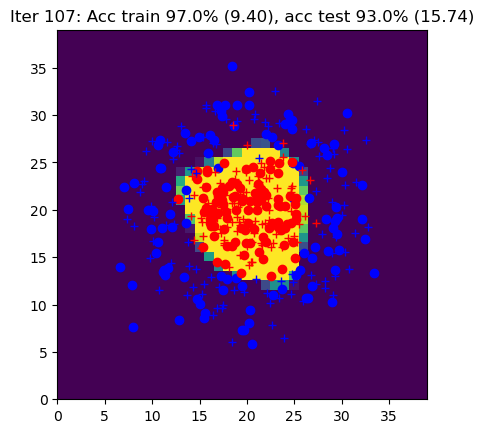

Iter 108: Acc train 95.5% (9.41), acc test 92.0% (18.99)


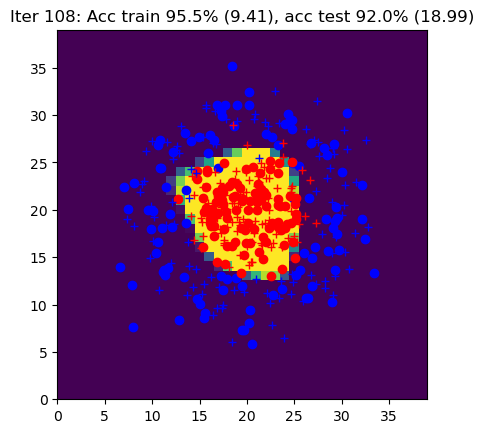

Iter 109: Acc train 97.5% (9.22), acc test 93.0% (16.55)


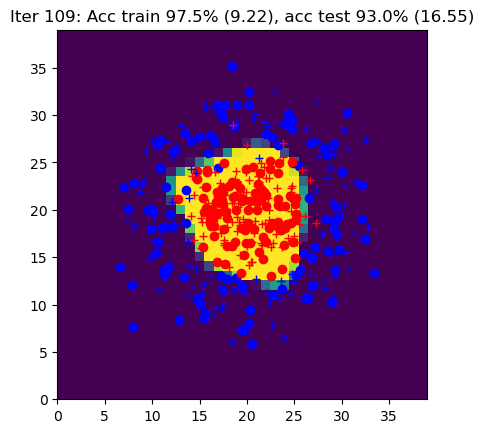

Iter 110: Acc train 96.0% (9.31), acc test 92.5% (17.42)


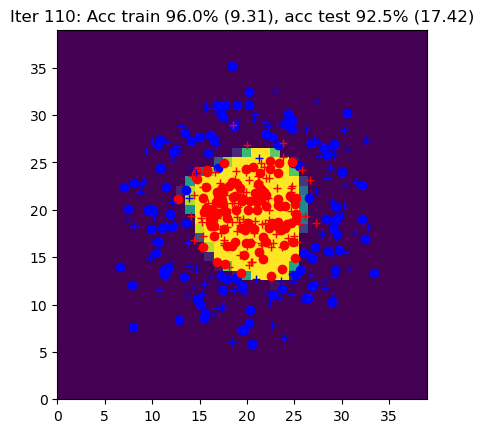

Iter 111: Acc train 97.5% (8.36), acc test 92.5% (17.51)


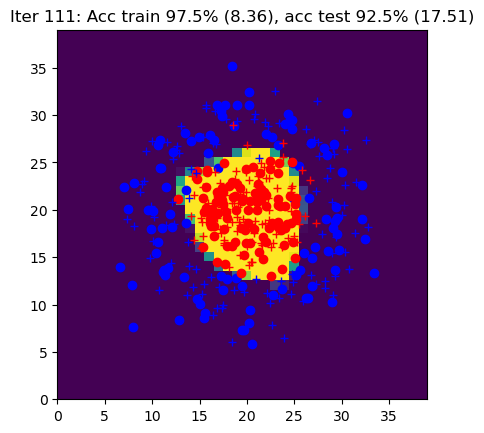

Iter 112: Acc train 94.5% (11.90), acc test 93.0% (17.04)


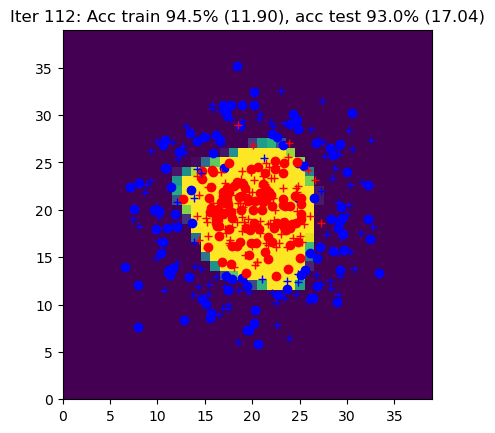

Iter 113: Acc train 95.5% (10.58), acc test 93.5% (16.10)


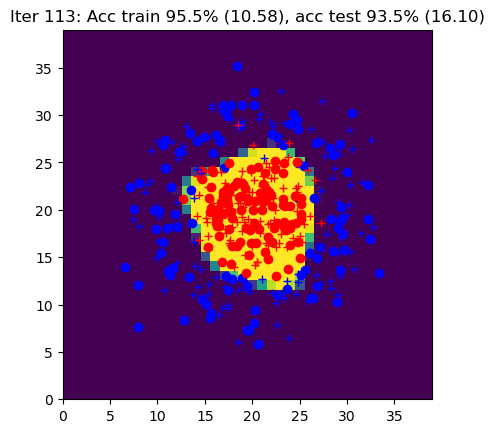

Iter 114: Acc train 96.5% (9.62), acc test 93.5% (18.35)


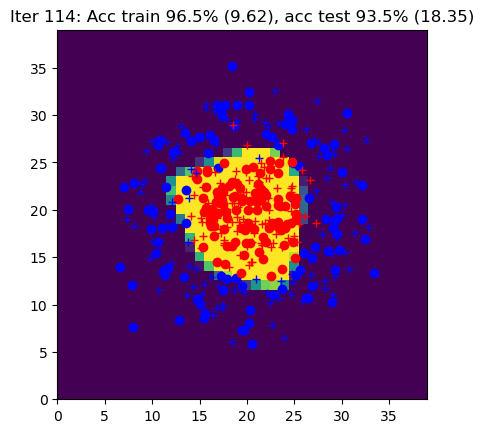

Iter 115: Acc train 96.0% (10.58), acc test 93.0% (18.10)


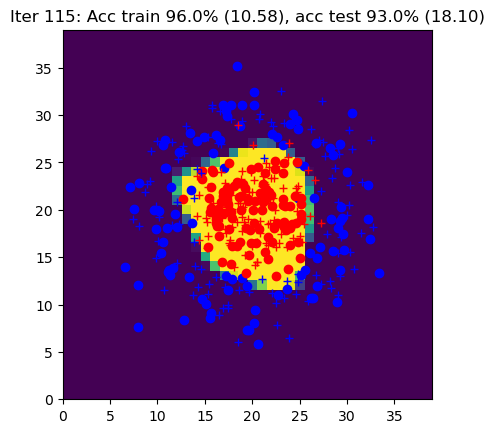

Iter 116: Acc train 97.5% (8.29), acc test 93.0% (16.67)


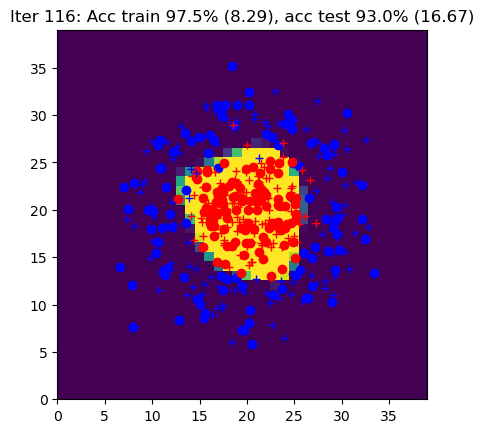

Iter 117: Acc train 97.0% (8.28), acc test 93.0% (17.25)


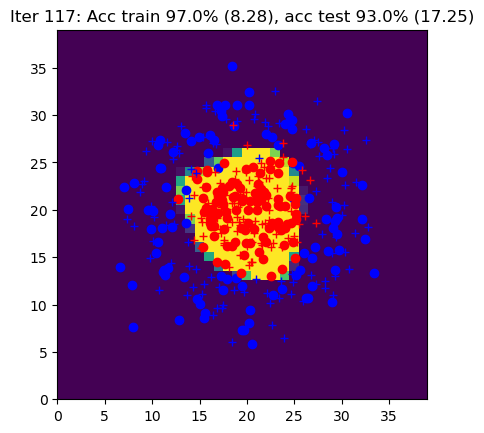

Iter 118: Acc train 97.0% (9.98), acc test 93.0% (21.14)


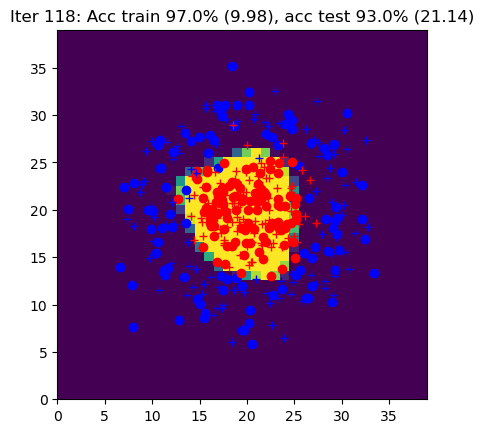

Iter 119: Acc train 96.0% (8.93), acc test 92.0% (17.29)


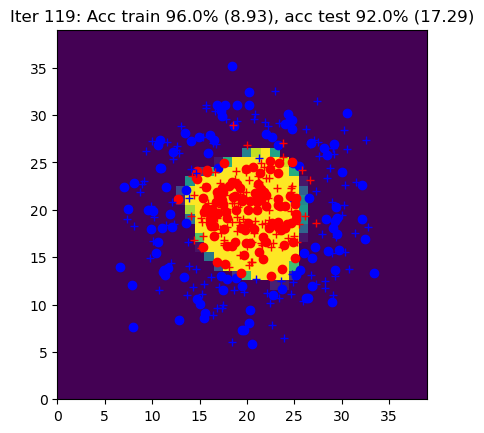

Iter 120: Acc train 96.0% (8.52), acc test 94.0% (16.68)


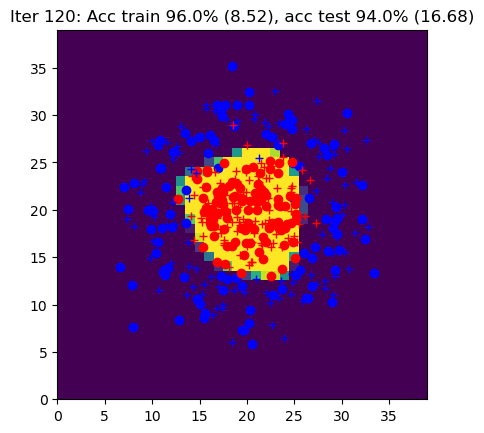

Iter 121: Acc train 96.0% (9.38), acc test 92.5% (20.81)


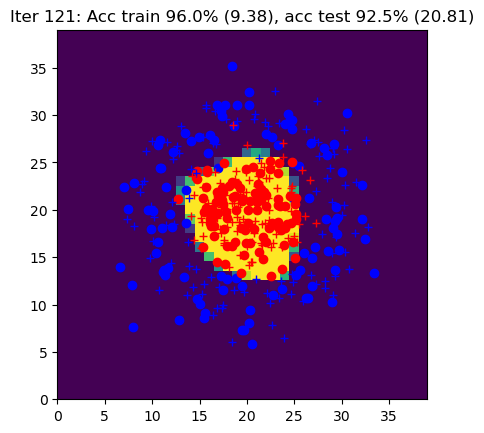

Iter 122: Acc train 97.0% (8.28), acc test 92.5% (18.09)


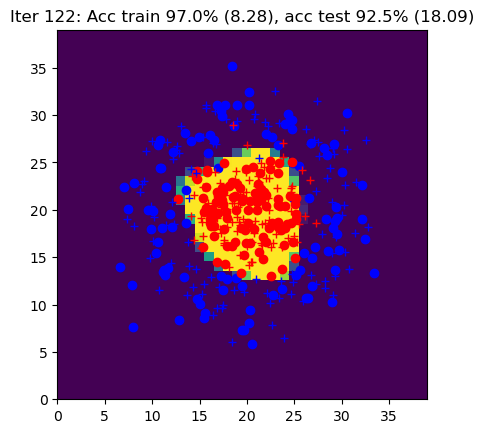

Iter 123: Acc train 97.5% (8.14), acc test 92.5% (17.76)


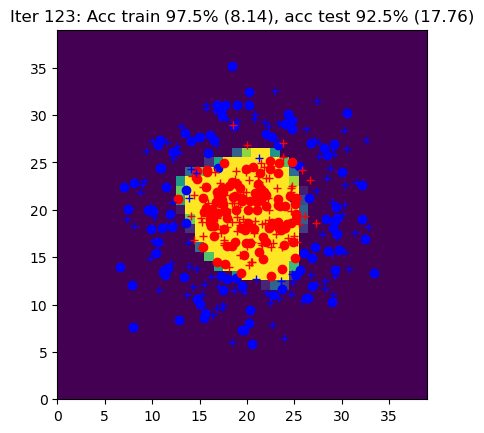

Iter 124: Acc train 96.0% (9.05), acc test 92.5% (18.59)


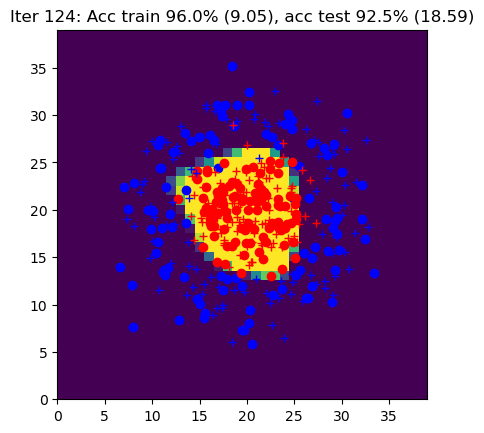

Iter 125: Acc train 97.5% (8.24), acc test 92.5% (17.98)


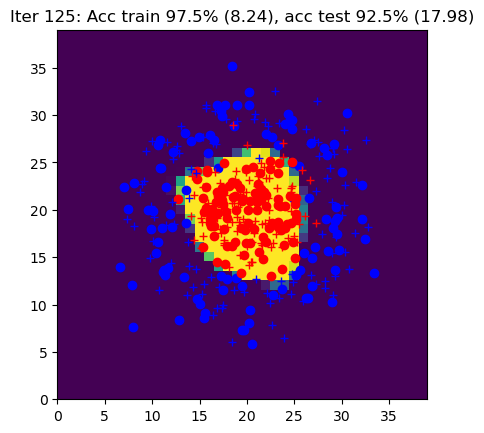

Iter 126: Acc train 98.0% (8.49), acc test 93.5% (16.47)


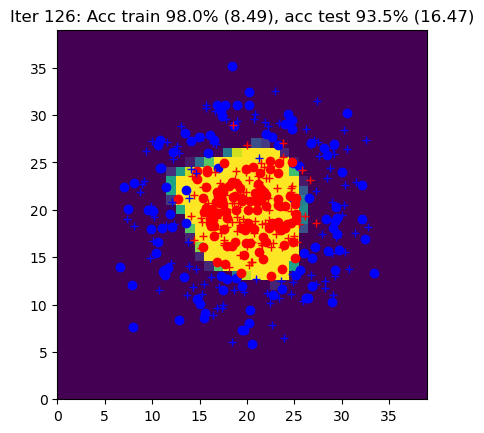

Iter 127: Acc train 97.5% (8.38), acc test 93.0% (17.58)


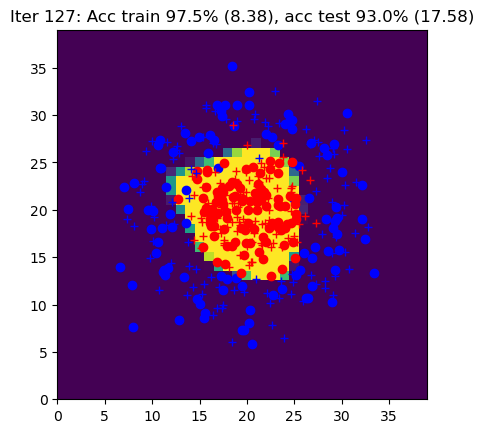

Iter 128: Acc train 96.5% (8.36), acc test 93.5% (19.02)


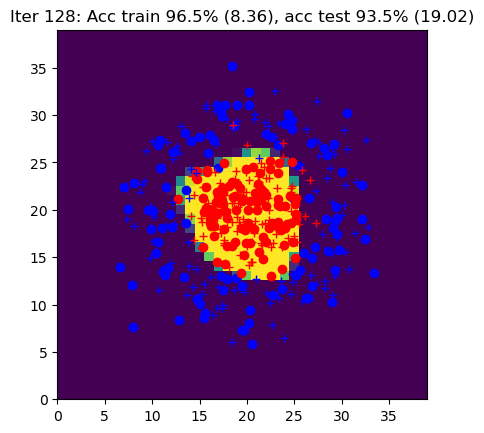

Iter 129: Acc train 98.0% (8.32), acc test 93.5% (15.92)


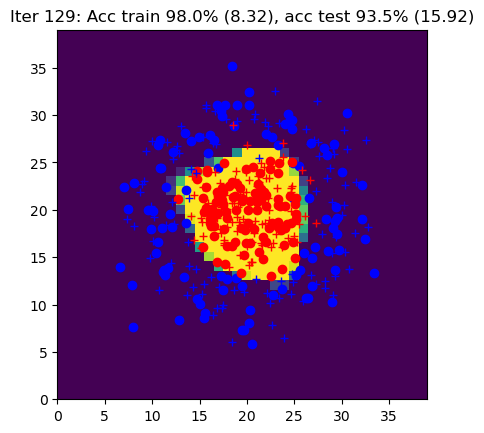

Iter 130: Acc train 96.0% (8.53), acc test 94.0% (16.42)


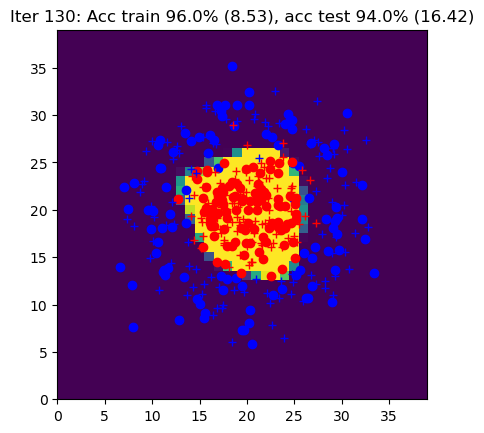

Iter 131: Acc train 97.5% (8.14), acc test 93.0% (16.12)


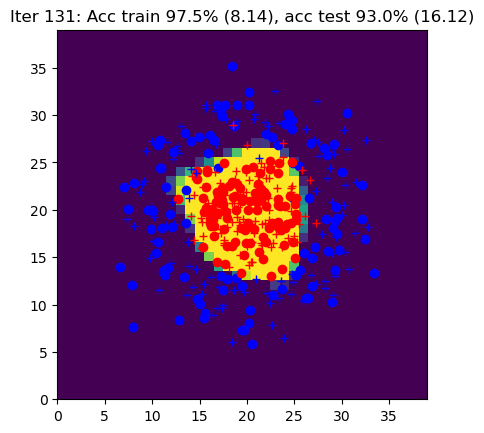

Iter 132: Acc train 97.5% (8.10), acc test 94.0% (16.89)


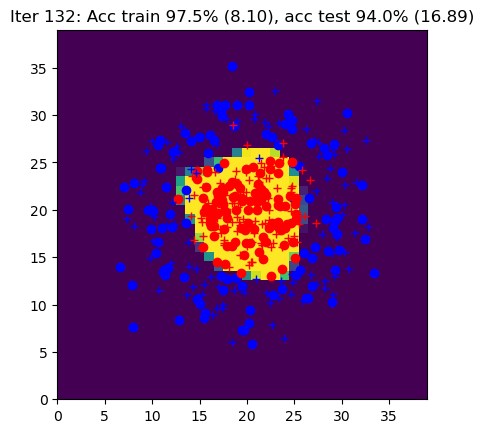

Iter 133: Acc train 96.0% (8.81), acc test 93.0% (19.25)


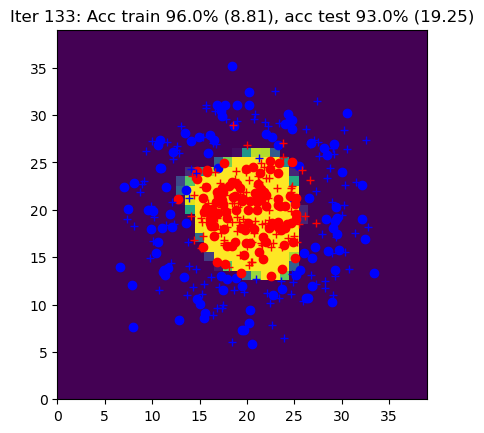

Iter 134: Acc train 96.5% (8.60), acc test 94.0% (19.08)


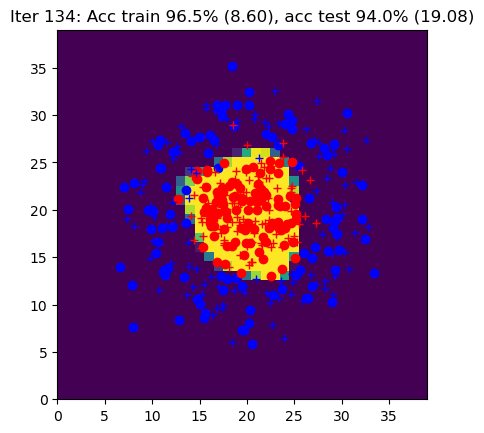

Iter 135: Acc train 96.5% (8.76), acc test 92.5% (20.39)


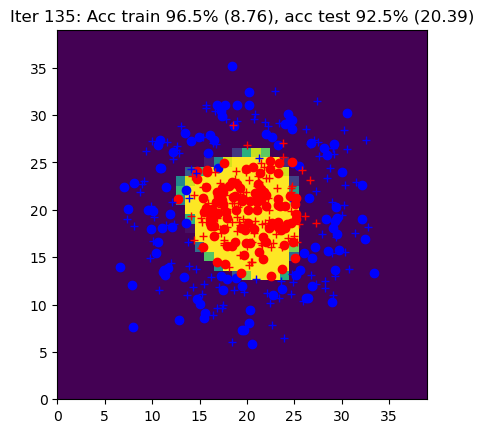

Iter 136: Acc train 97.5% (8.29), acc test 93.0% (18.91)


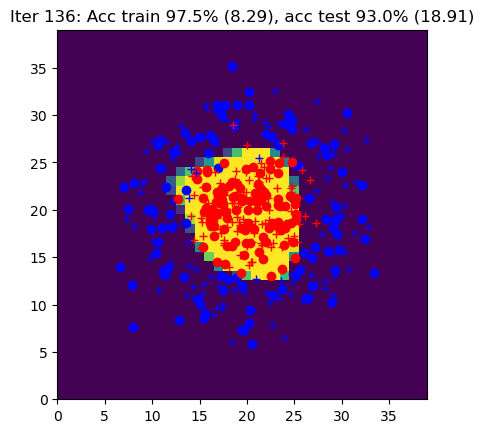

Iter 137: Acc train 96.5% (8.59), acc test 92.5% (18.63)


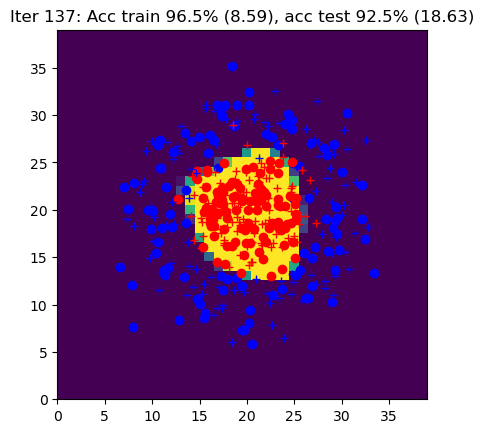

Iter 138: Acc train 95.5% (9.60), acc test 92.5% (21.31)


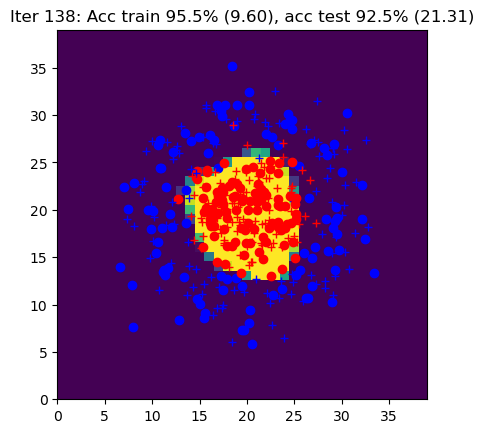

Iter 139: Acc train 97.5% (8.03), acc test 93.0% (16.08)


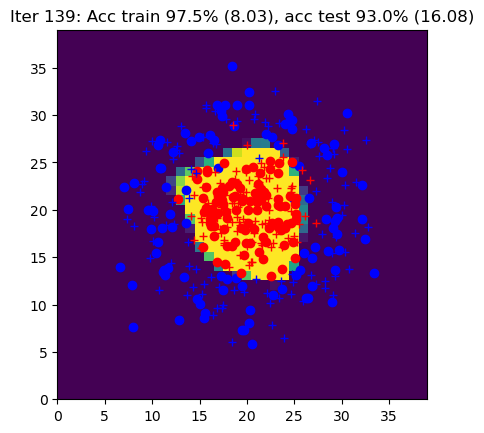

Iter 140: Acc train 97.0% (7.95), acc test 93.0% (18.72)


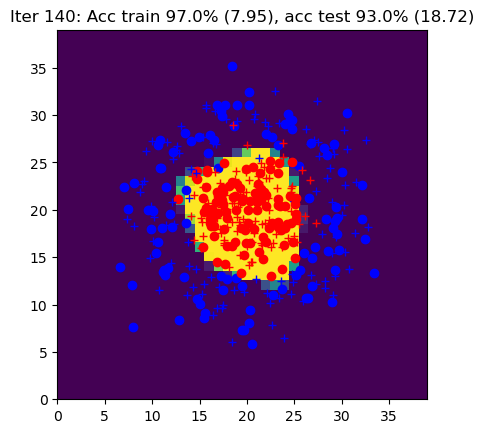

Iter 141: Acc train 98.0% (9.41), acc test 93.5% (15.88)


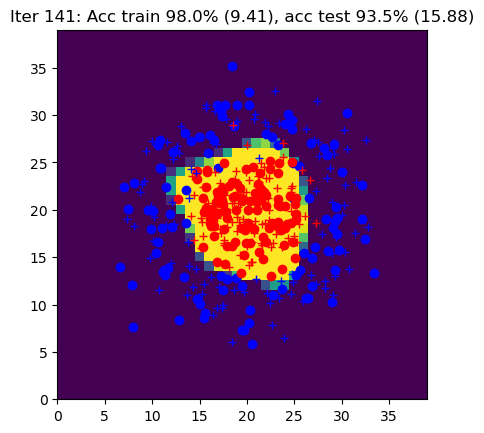

Iter 142: Acc train 97.5% (7.98), acc test 94.0% (17.76)


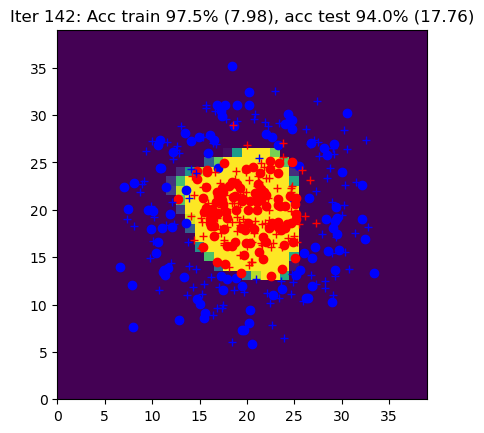

Iter 143: Acc train 98.0% (8.05), acc test 92.5% (17.19)


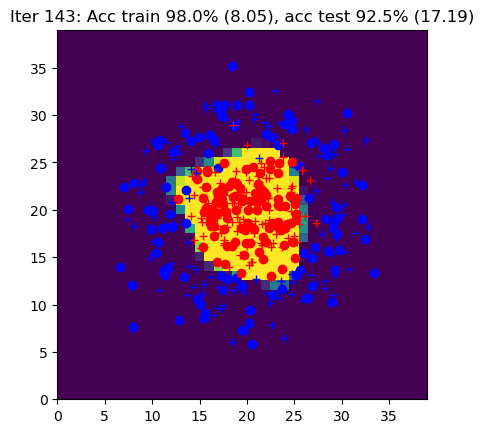

Iter 144: Acc train 97.0% (8.38), acc test 93.0% (18.24)


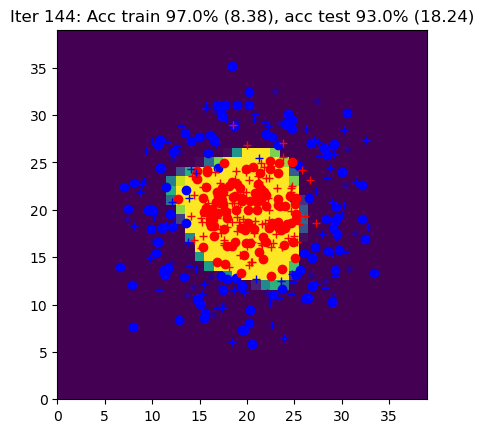

Iter 145: Acc train 96.0% (8.65), acc test 93.5% (19.01)


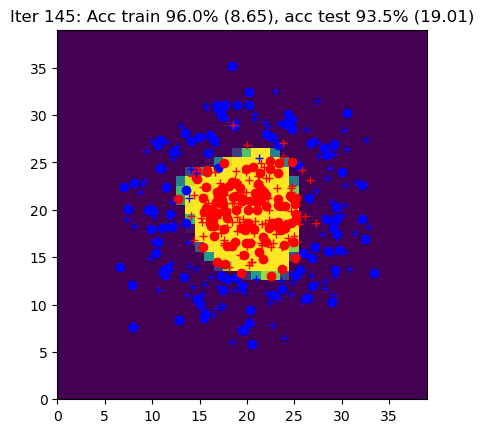

Iter 146: Acc train 96.5% (8.24), acc test 94.0% (16.29)


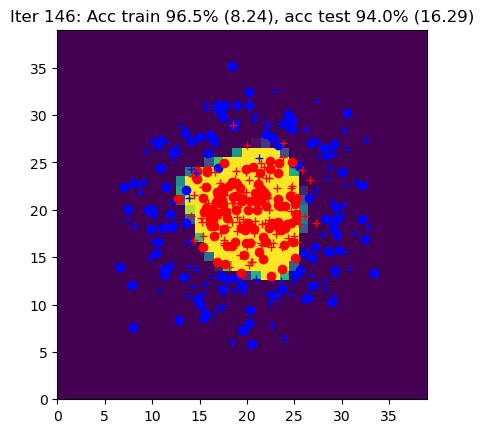

Iter 147: Acc train 97.0% (8.10), acc test 92.5% (18.78)


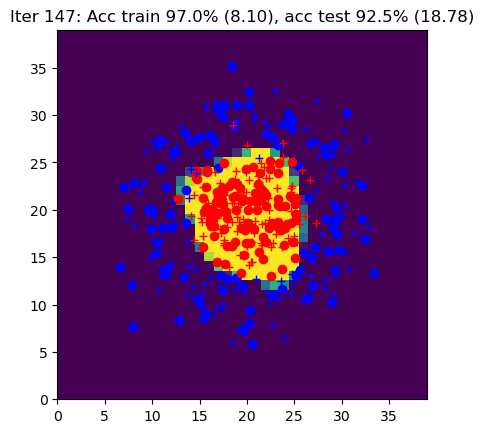

Iter 148: Acc train 97.5% (8.88), acc test 93.5% (15.53)


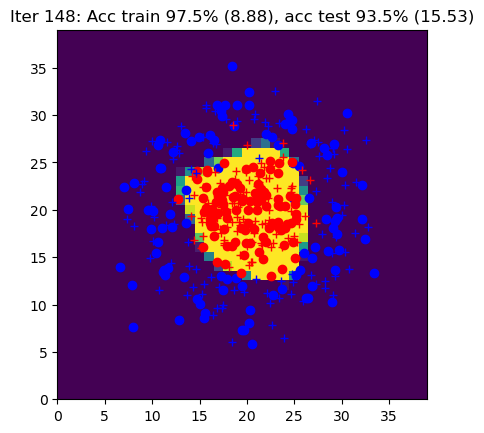

Iter 149: Acc train 97.5% (9.69), acc test 93.5% (15.36)


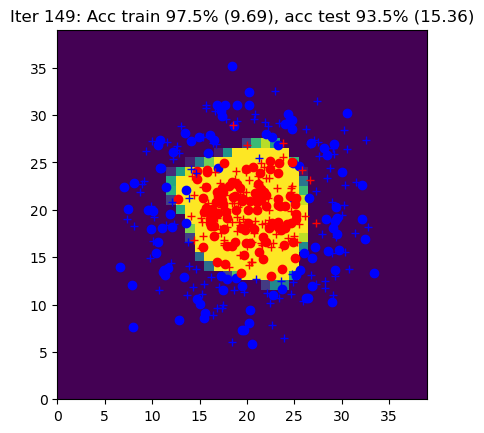

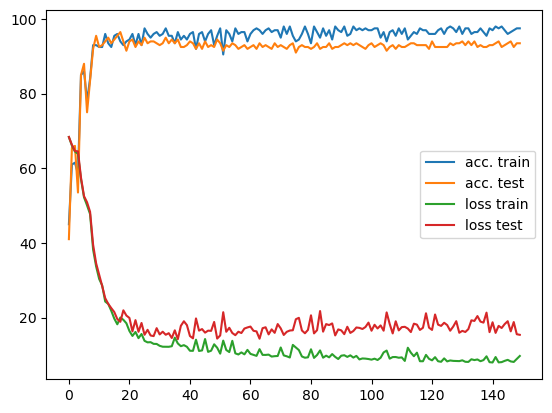

In [9]:
# init
data = CirclesData()
data.plot_data()
N = data.Xtrain.shape[0]
Nbatch = 10
nx = data.Xtrain.shape[1]
nh = 10
ny = data.Ytrain.shape[1]
eta = 0.03

params = init_params(nx, nh, ny)

curves = [[],[], [], []]

# epoch
for iteration in range(150):

    # permute
    perm = np.random.permutation(N)
    Xtrain = data.Xtrain[perm, :]
    Ytrain = data.Ytrain[perm, :]

    #####################
    ## Your code here  ##
    #####################
    # batches
    for j in range(N // Nbatch):

        indsBatch = range(j * Nbatch, (j+1) * Nbatch)
        X = Xtrain[indsBatch, :]
        Y = Ytrain[indsBatch, :]
        
        yhat, outputs = forward(params, X)
        L, acc = loss_accuracy(yhat, Y)
        grads = backward(params, outputs, Y)
        params = sgd(params, grads, eta)
        
        # write the optimization algorithm on the batch (X,Y)
        # using the functions: forward, loss_accuracy, backward, sgd


    ####################
    ##      END        #
    ####################

    Yhat_train, _ = forward(params, data.Xtrain)
    Yhat_test, _ = forward(params, data.Xtest)
    Ltrain, acctrain = loss_accuracy(Yhat_train, data.Ytrain)
    Ltest, acctest = loss_accuracy(Yhat_test, data.Ytest)
    Ygrid, _ = forward(params, data.Xgrid)

    title = 'Iter {}: Acc train {:.1f}% ({:.2f}), acc test {:.1f}% ({:.2f})'.format(iteration, acctrain, Ltrain, acctest, Ltest)
    print(title)
    data.plot_data_with_grid(Ygrid, title)

    curves[0].append(acctrain)
    curves[1].append(acctest)
    curves[2].append(Ltrain)
    curves[3].append(Ltest)

fig = plt.figure()
plt.plot(curves[0], label="acc. train")
plt.plot(curves[1], label="acc. test")
plt.plot(curves[2], label="loss train")
plt.plot(curves[3], label="loss test")
plt.legend()
plt.show()

# Part 2 : Simplification of the backward pass with `torch.autograd`



In [13]:
def init_params(nx, nh, ny):
    """
    nx, nh, ny: integers
    out params: dictionnary
    """
    params = {}

    #####################
    ## Your code here  ##
    #####################
    # fill values for Wh, Wy, bh, by
    # activate autograd on the network weights

    params["Wh"] = torch.randn(nh, nx, requires_grad=True)
    params["Wy"] = torch.randn(ny, nh, requires_grad=True) 
    params["bh"] = torch.randn(nh, requires_grad=True)
    params["by"] = torch.randn(ny, requires_grad=True) 

    ####################
    ##      END        #
    ####################
    return params

The function `forward` remains unchanged from previous part.

The function `backward` is no longer used because of "autograd".

In [14]:
def sgd(params, eta):

    #####################
    ## Your code here  ##
    #####################
    # update the network weights
    # warning: use torch.no_grad()
    # and reset to zero the gradient accumulators
    with torch.no_grad():
        params["Wh"] -= params["Wh"].grad * eta
        params["Wy"] -= params["Wy"].grad * eta
        params["bh"] -= params["bh"].grad * eta
        params["by"] -= params["by"].grad * eta
        
        for param in params.values():
            param.grad.zero_()
    
    ####################
    ##      END        #
    ####################
    return params

## Global learning procedure with autograd

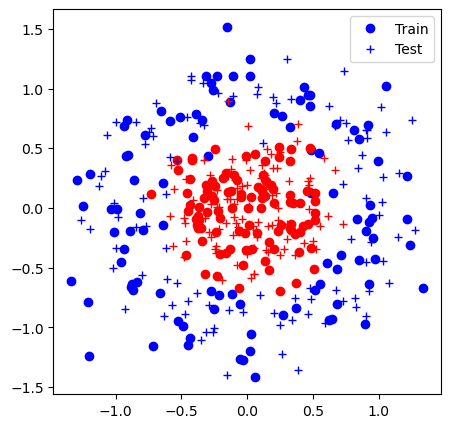

Iter 0: Acc train 44.0% (0.93), acc test 44.5% (0.98)


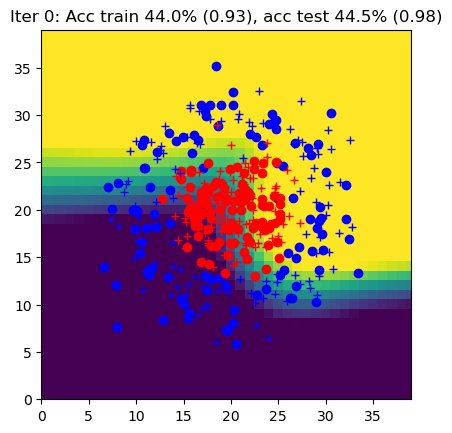

C:\Users\eeko\AppData\Local\Temp\ipykernel_5196\2969759722.py:61: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  curves[0].append(torch.tensor(acctrain))
C:\Users\eeko\AppData\Local\Temp\ipykernel_5196\2969759722.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  curves[1].append(torch.tensor(acctest))
C:\Users\eeko\AppData\Local\Temp\ipykernel_5196\2969759722.py:63: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  curves[2].append(torch.tensor(Ltrain))
C:\Users\eeko\AppData\Local\Temp\ipykernel_5196\2969759722.py:64: UserWarning: To copy c

Iter 1: Acc train 57.5% (0.81), acc test 58.0% (0.85)


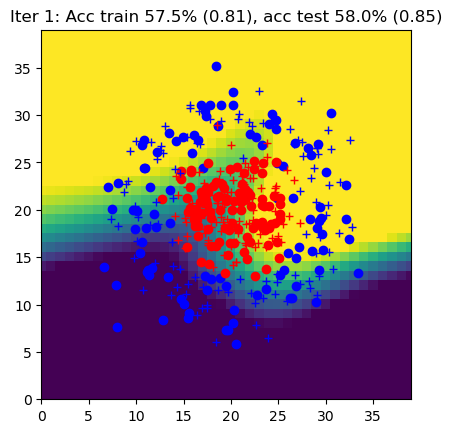

Iter 2: Acc train 49.5% (0.74), acc test 49.0% (0.77)


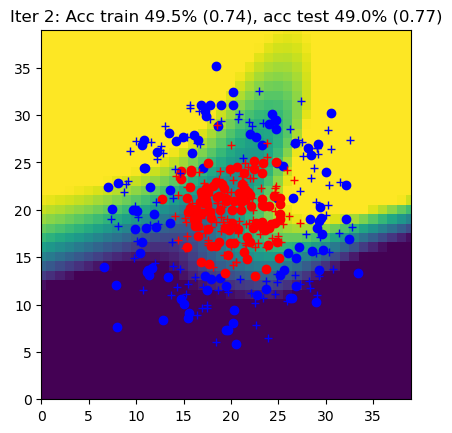

Iter 3: Acc train 68.0% (0.70), acc test 69.0% (0.73)


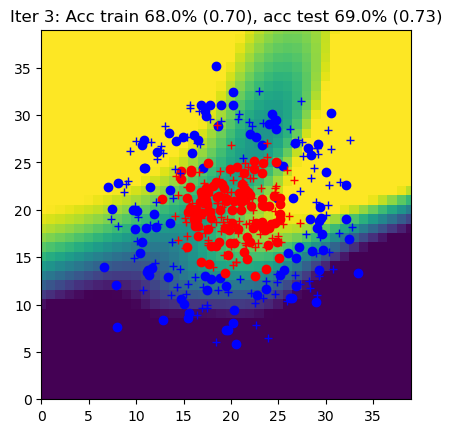

Iter 4: Acc train 70.5% (0.67), acc test 71.0% (0.70)


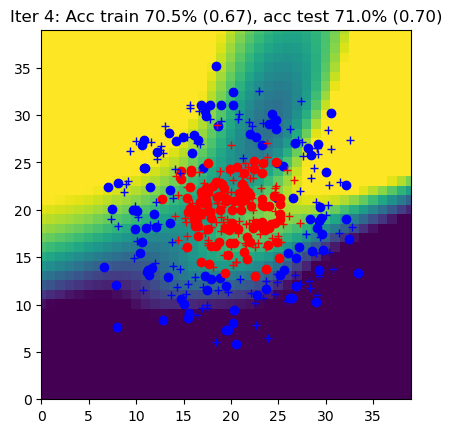

Iter 5: Acc train 70.5% (0.64), acc test 71.0% (0.67)


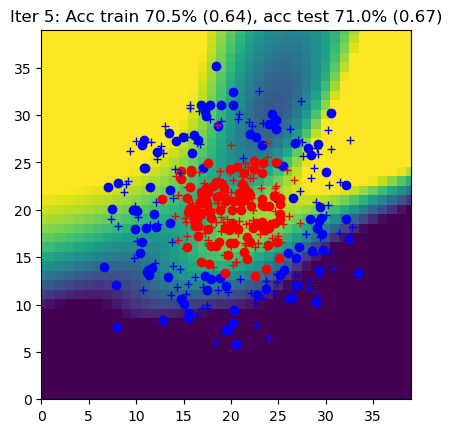

Iter 6: Acc train 72.5% (0.62), acc test 70.0% (0.64)


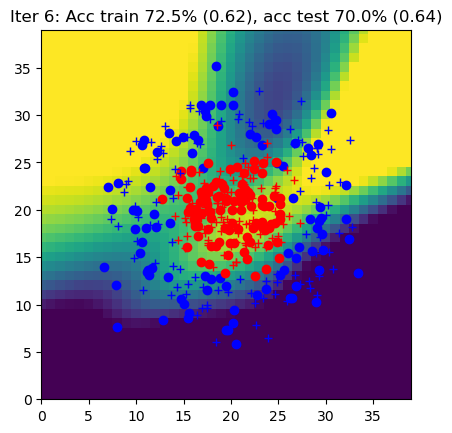

Iter 7: Acc train 71.0% (0.60), acc test 70.5% (0.62)


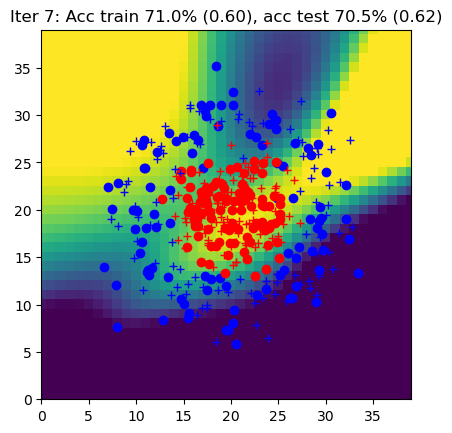

Iter 8: Acc train 75.0% (0.58), acc test 72.0% (0.60)


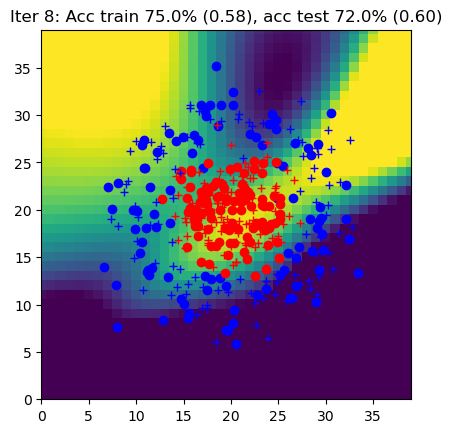

Iter 9: Acc train 73.5% (0.56), acc test 71.5% (0.58)


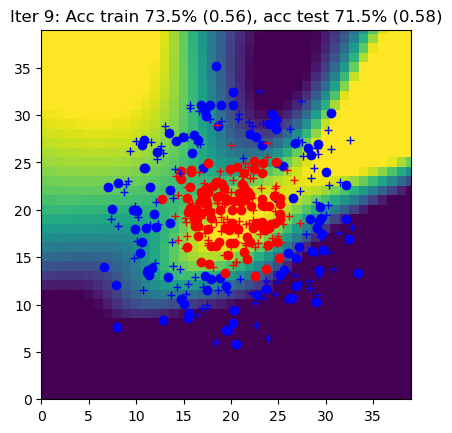

Iter 10: Acc train 75.0% (0.54), acc test 72.5% (0.56)


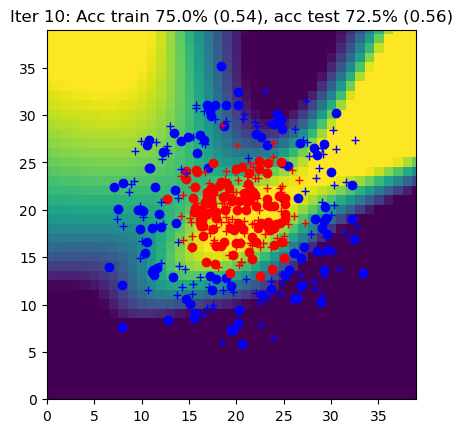

Iter 11: Acc train 83.5% (0.52), acc test 76.5% (0.54)


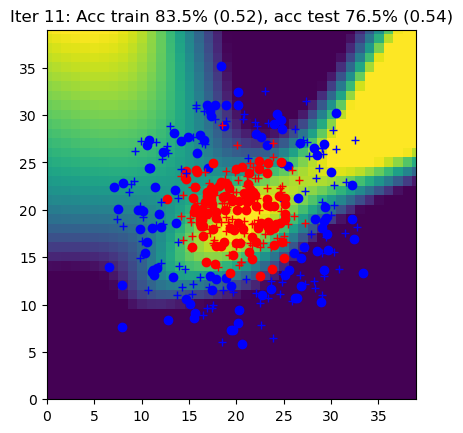

Iter 12: Acc train 77.0% (0.51), acc test 74.0% (0.53)


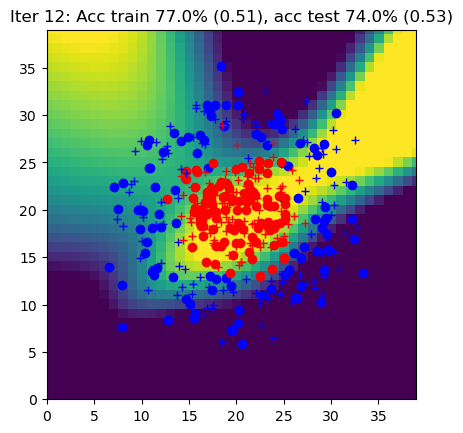

Iter 13: Acc train 80.0% (0.49), acc test 79.0% (0.51)


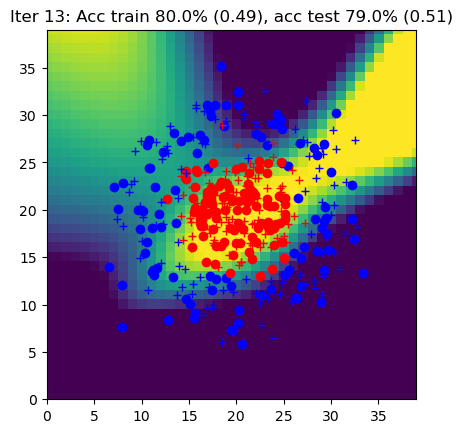

Iter 14: Acc train 82.0% (0.48), acc test 79.5% (0.50)


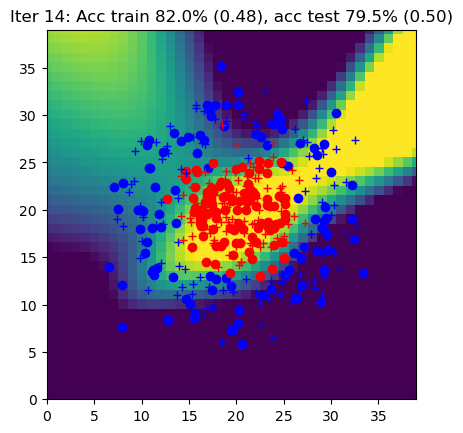

Iter 15: Acc train 87.5% (0.47), acc test 86.0% (0.49)


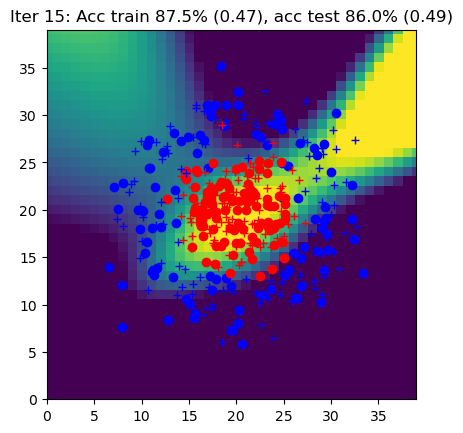

Iter 16: Acc train 88.0% (0.45), acc test 85.5% (0.47)


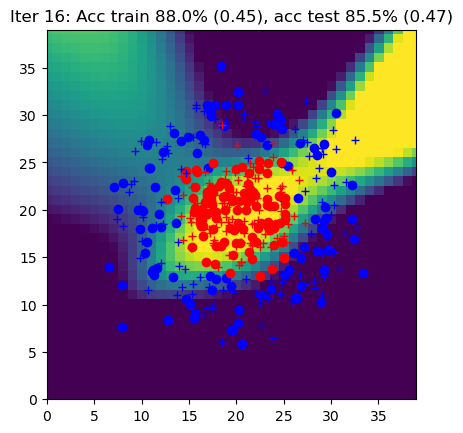

Iter 17: Acc train 87.5% (0.44), acc test 86.0% (0.46)


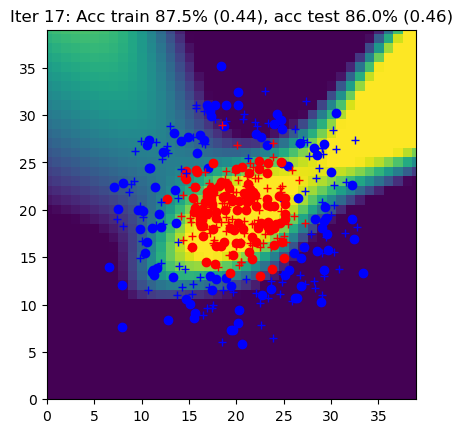

Iter 18: Acc train 87.5% (0.43), acc test 85.5% (0.45)


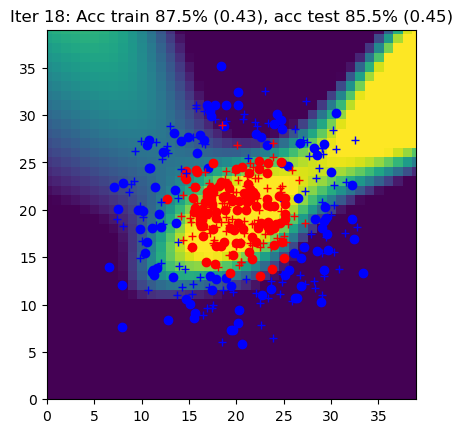

Iter 19: Acc train 89.0% (0.42), acc test 86.5% (0.44)


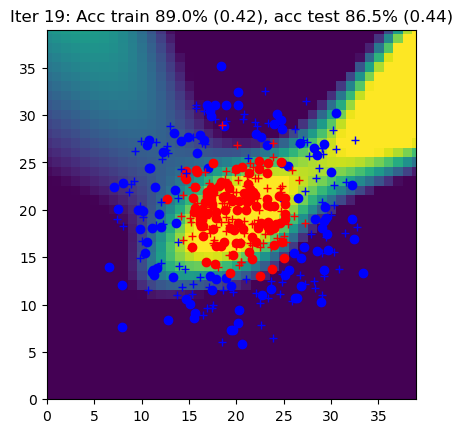

Iter 20: Acc train 89.0% (0.41), acc test 86.5% (0.43)


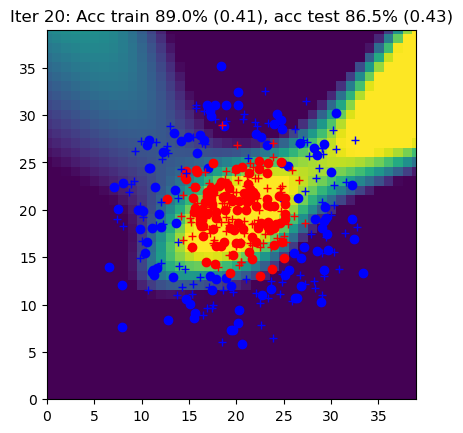

Iter 21: Acc train 87.0% (0.40), acc test 85.5% (0.42)


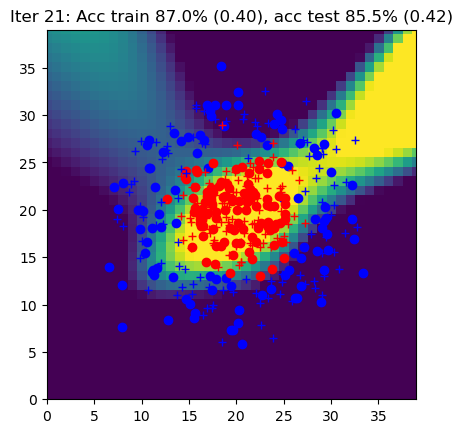

Iter 22: Acc train 89.0% (0.39), acc test 86.0% (0.41)


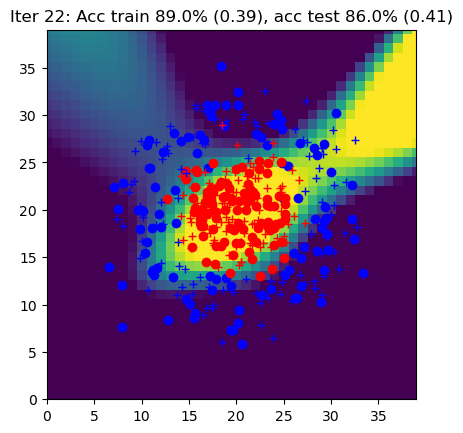

Iter 23: Acc train 89.5% (0.38), acc test 88.0% (0.40)


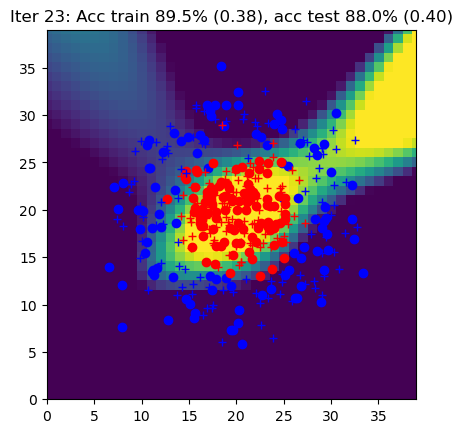

Iter 24: Acc train 89.0% (0.38), acc test 86.0% (0.40)


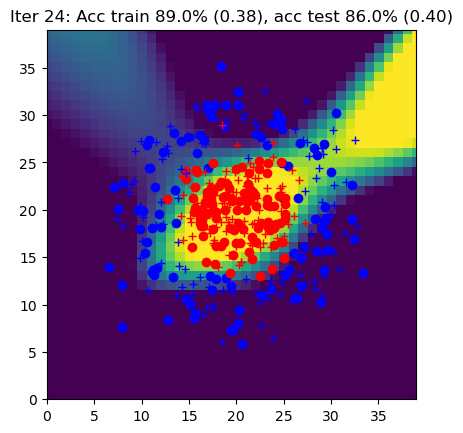

Iter 25: Acc train 88.0% (0.37), acc test 86.0% (0.39)


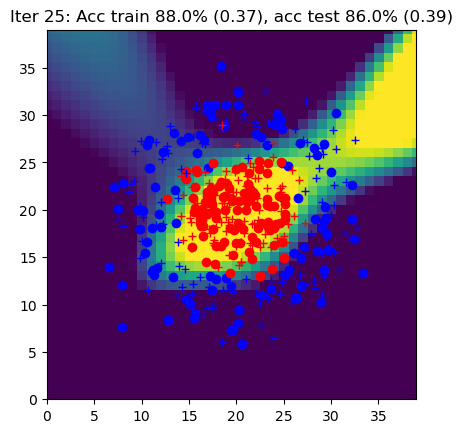

Iter 26: Acc train 89.0% (0.36), acc test 87.0% (0.38)


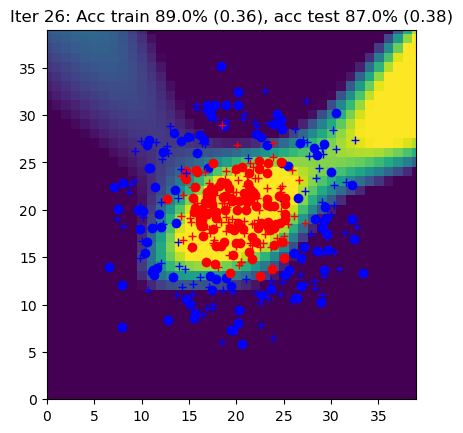

Iter 27: Acc train 90.0% (0.35), acc test 87.0% (0.37)


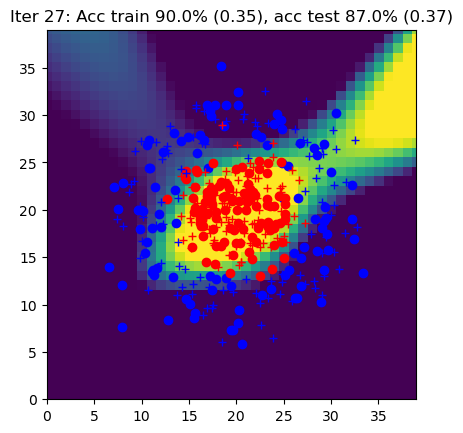

Iter 28: Acc train 90.0% (0.35), acc test 87.0% (0.37)


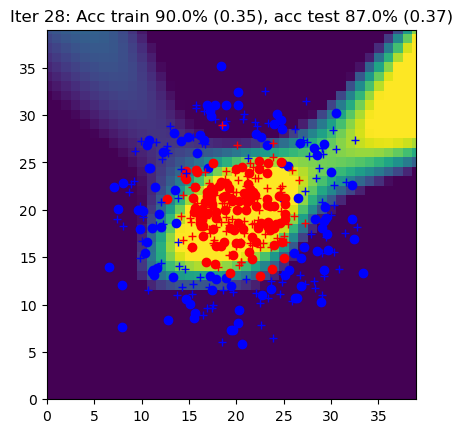

Iter 29: Acc train 90.5% (0.34), acc test 90.0% (0.36)


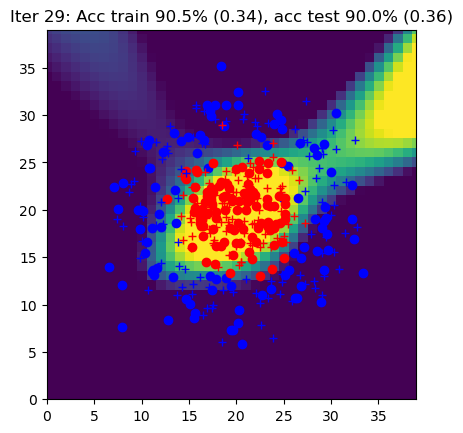

Iter 30: Acc train 91.0% (0.33), acc test 89.5% (0.35)


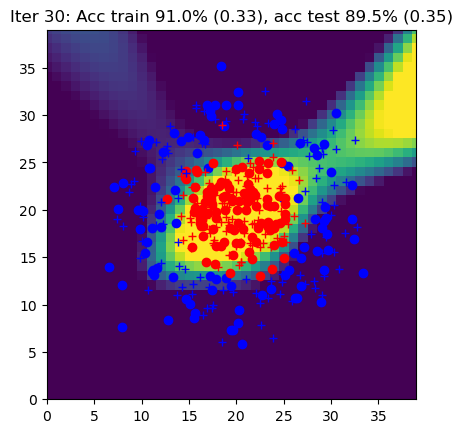

Iter 31: Acc train 90.5% (0.33), acc test 90.0% (0.35)


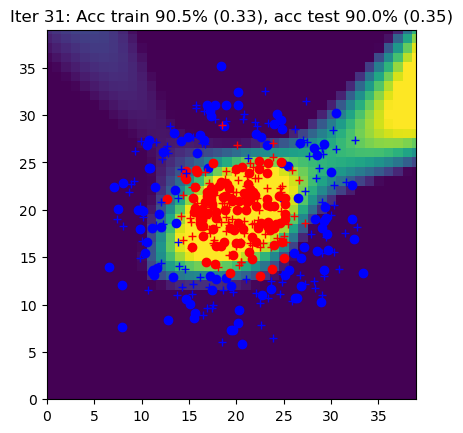

Iter 32: Acc train 91.0% (0.32), acc test 89.0% (0.34)


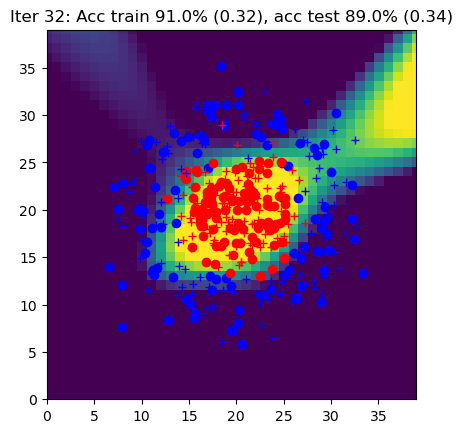

Iter 33: Acc train 91.0% (0.32), acc test 90.5% (0.34)


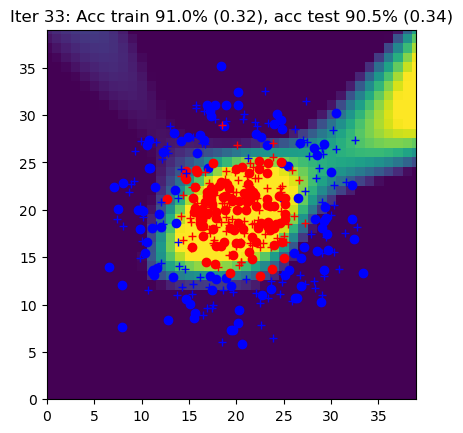

Iter 34: Acc train 92.0% (0.31), acc test 91.5% (0.33)


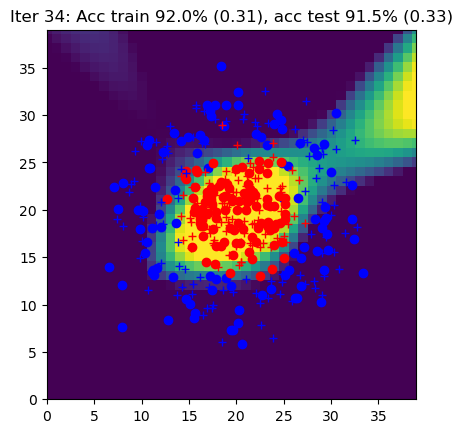

Iter 35: Acc train 92.0% (0.31), acc test 92.0% (0.32)


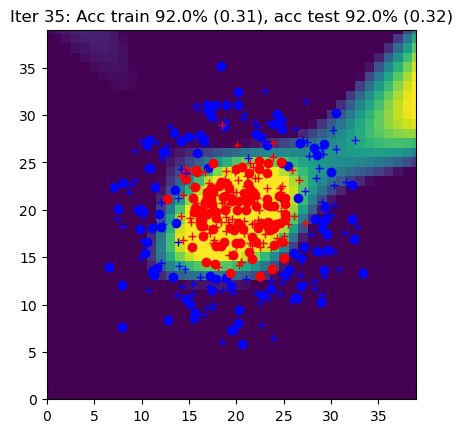

Iter 36: Acc train 93.0% (0.30), acc test 93.0% (0.32)


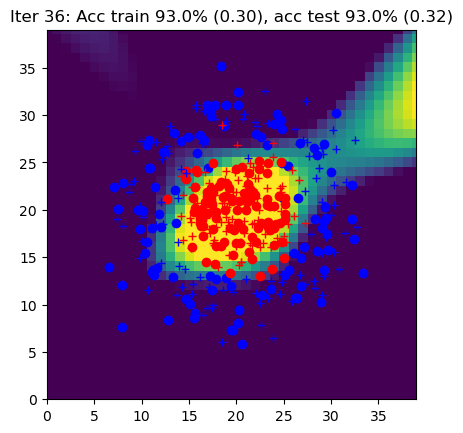

Iter 37: Acc train 93.5% (0.30), acc test 92.0% (0.31)


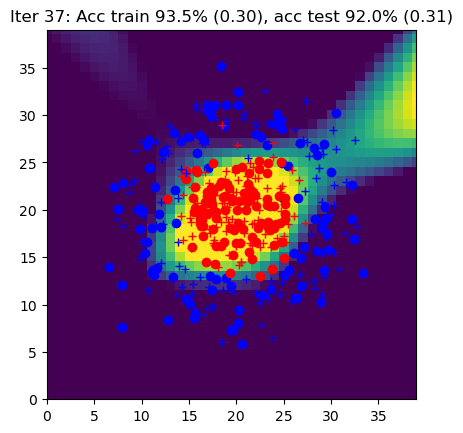

Iter 38: Acc train 93.0% (0.29), acc test 94.5% (0.31)


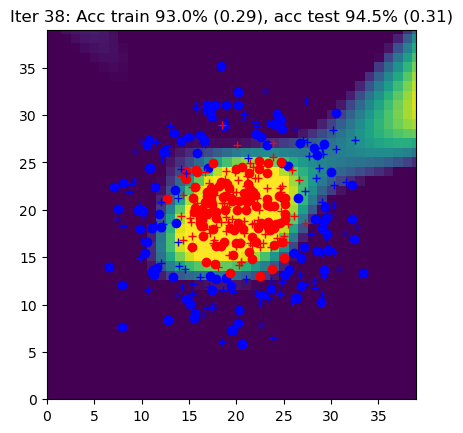

Iter 39: Acc train 92.5% (0.29), acc test 95.0% (0.30)


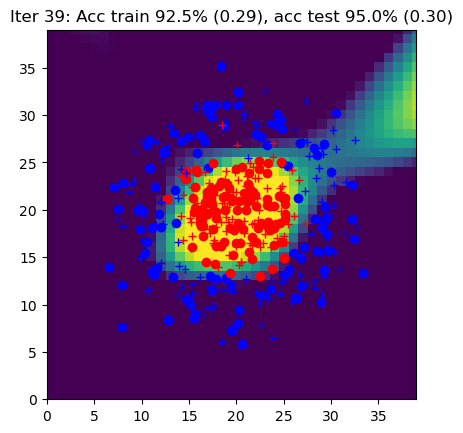

Iter 40: Acc train 93.5% (0.28), acc test 94.5% (0.30)


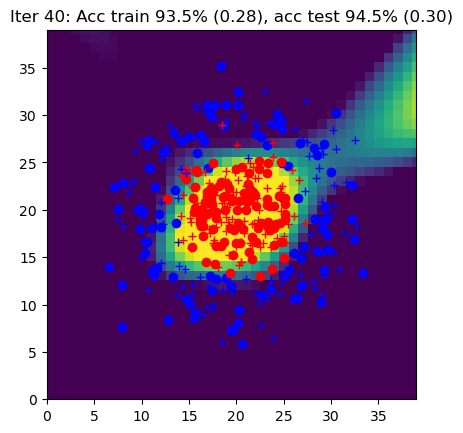

Iter 41: Acc train 94.5% (0.28), acc test 94.5% (0.30)


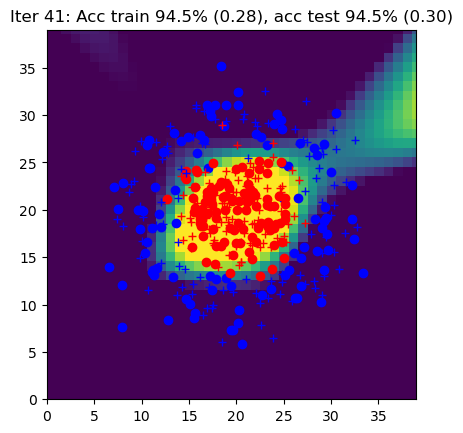

Iter 42: Acc train 94.0% (0.28), acc test 94.5% (0.29)


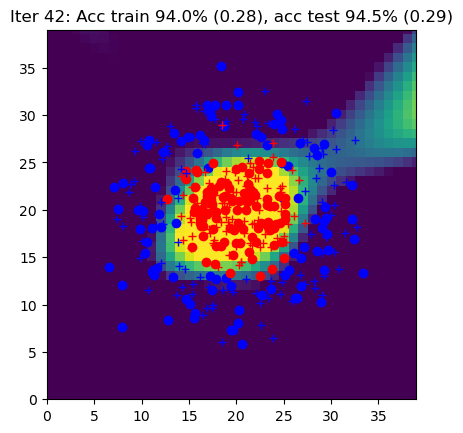

Iter 43: Acc train 94.0% (0.27), acc test 94.5% (0.29)


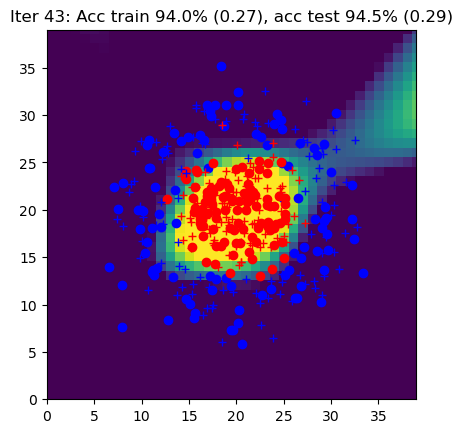

Iter 44: Acc train 94.5% (0.27), acc test 94.5% (0.28)


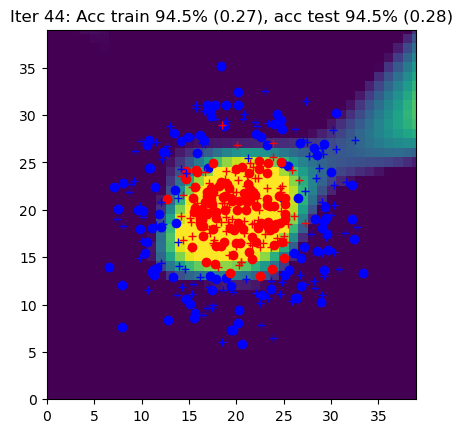

Iter 45: Acc train 94.5% (0.26), acc test 94.5% (0.28)


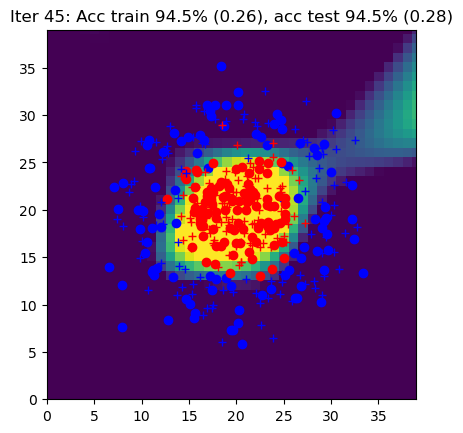

Iter 46: Acc train 94.0% (0.26), acc test 95.5% (0.28)


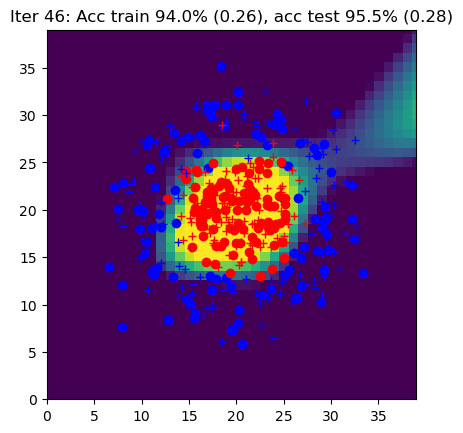

Iter 47: Acc train 94.5% (0.26), acc test 94.5% (0.27)


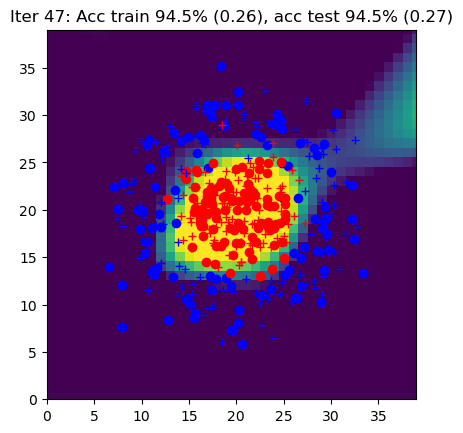

Iter 48: Acc train 94.0% (0.25), acc test 95.5% (0.27)


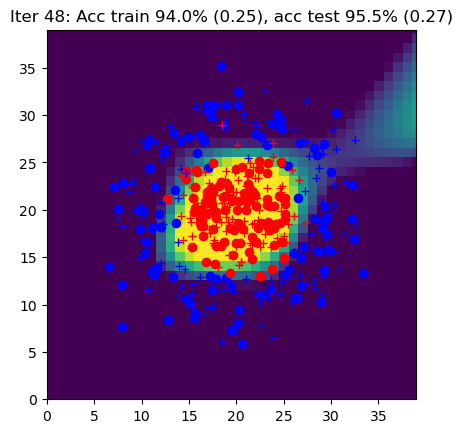

Iter 49: Acc train 94.5% (0.25), acc test 95.5% (0.27)


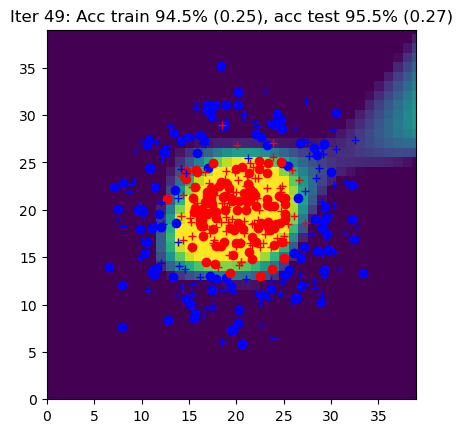

Iter 50: Acc train 94.5% (0.25), acc test 96.0% (0.26)


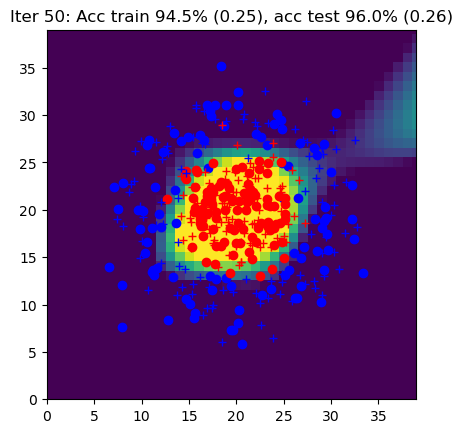

Iter 51: Acc train 94.5% (0.24), acc test 96.0% (0.26)


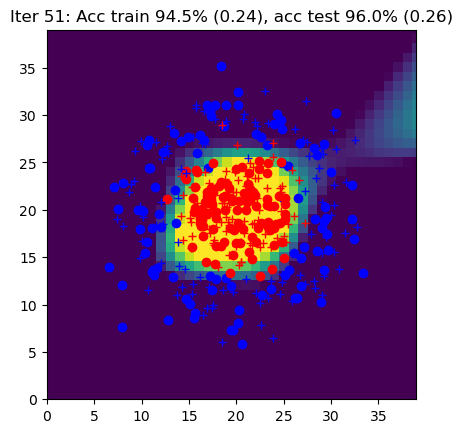

Iter 52: Acc train 94.0% (0.24), acc test 96.0% (0.26)


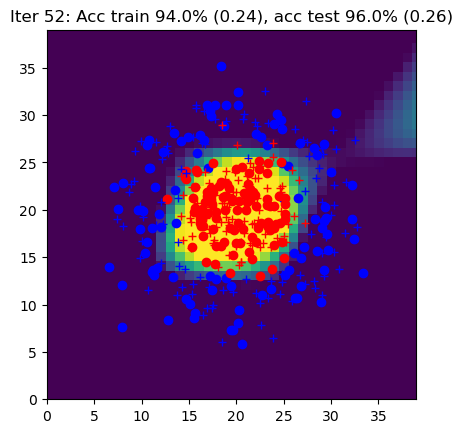

Iter 53: Acc train 94.5% (0.24), acc test 96.0% (0.25)


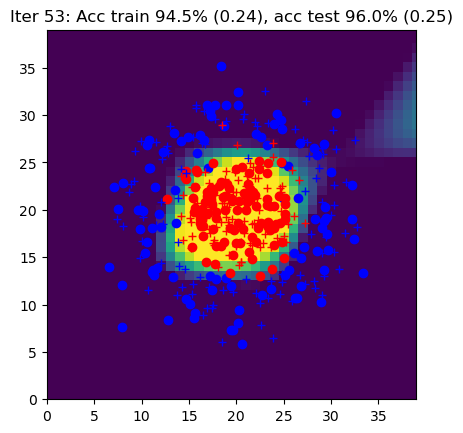

Iter 54: Acc train 94.5% (0.24), acc test 96.0% (0.25)


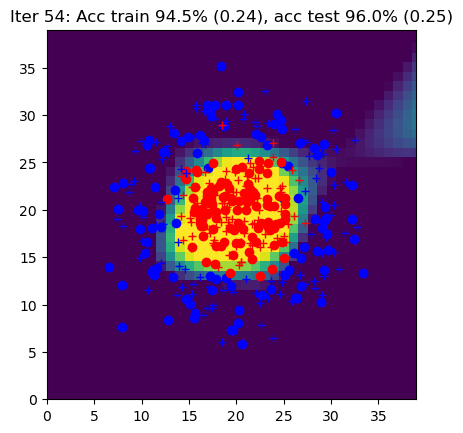

Iter 55: Acc train 94.0% (0.23), acc test 94.5% (0.25)


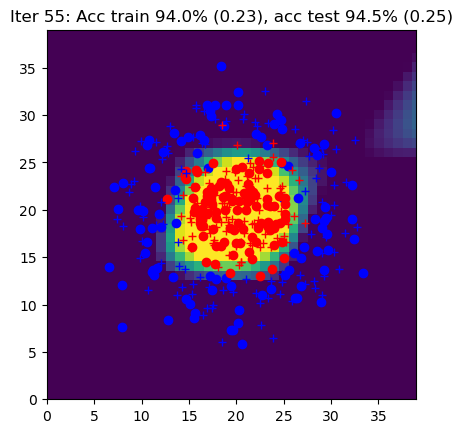

Iter 56: Acc train 94.5% (0.23), acc test 94.5% (0.25)


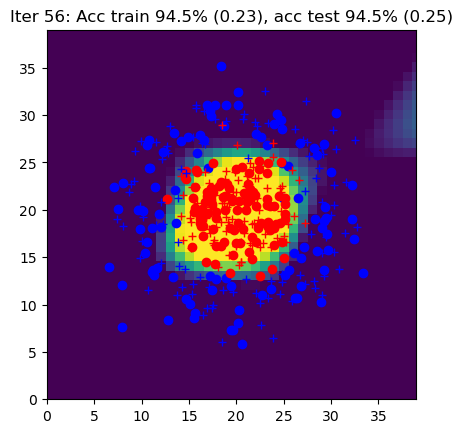

Iter 57: Acc train 94.5% (0.23), acc test 95.5% (0.24)


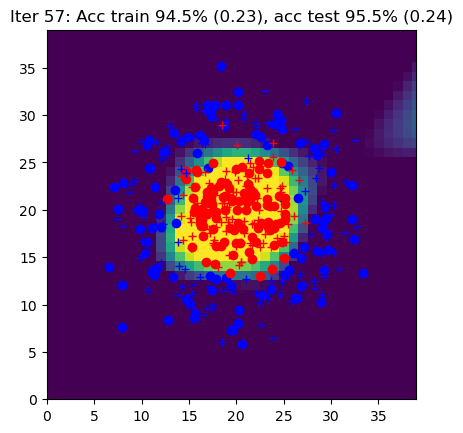

Iter 58: Acc train 94.5% (0.23), acc test 95.5% (0.24)


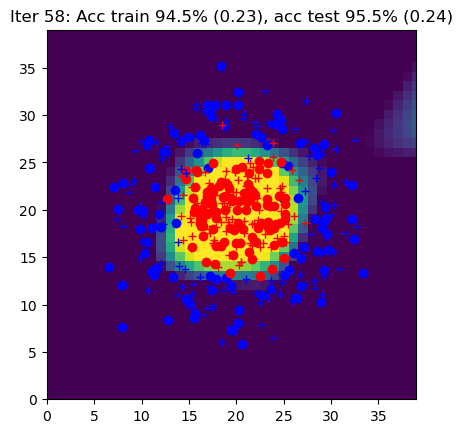

Iter 59: Acc train 94.5% (0.22), acc test 94.5% (0.24)


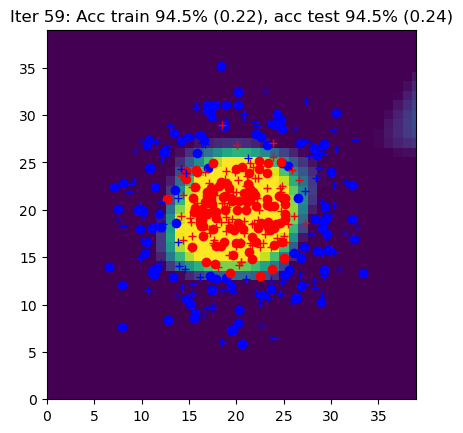

Iter 60: Acc train 94.5% (0.22), acc test 94.5% (0.24)


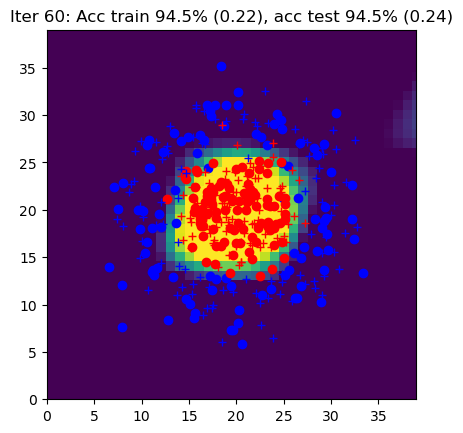

Iter 61: Acc train 94.5% (0.22), acc test 94.5% (0.24)


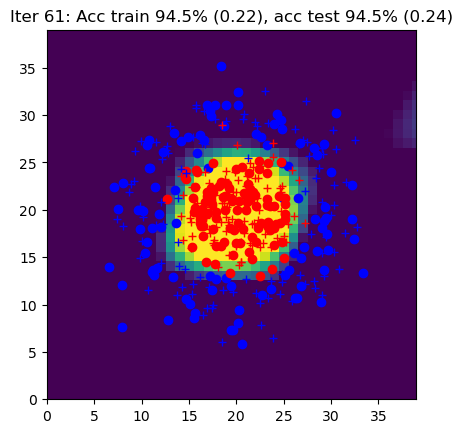

Iter 62: Acc train 94.5% (0.22), acc test 94.5% (0.23)


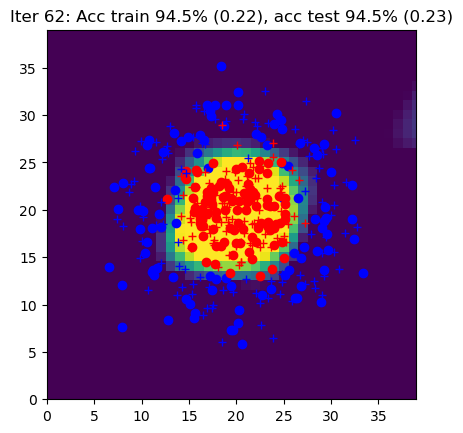

Iter 63: Acc train 94.5% (0.22), acc test 94.5% (0.23)


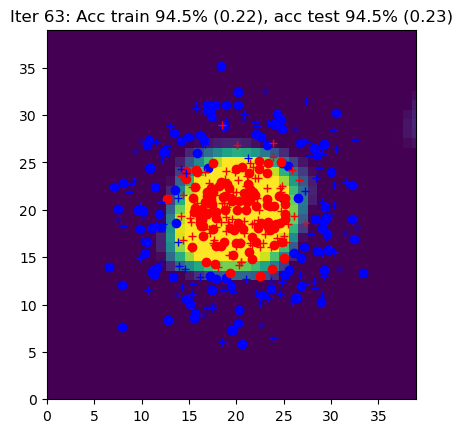

Iter 64: Acc train 95.0% (0.21), acc test 94.5% (0.23)


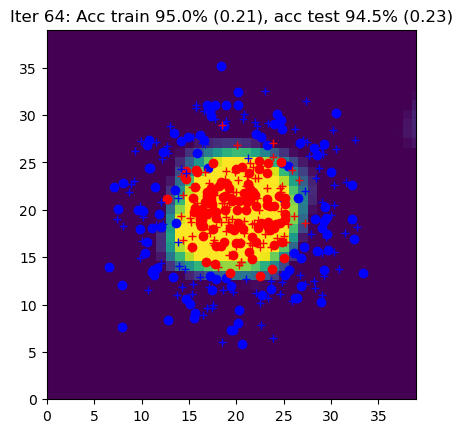

Iter 65: Acc train 95.0% (0.21), acc test 94.5% (0.23)


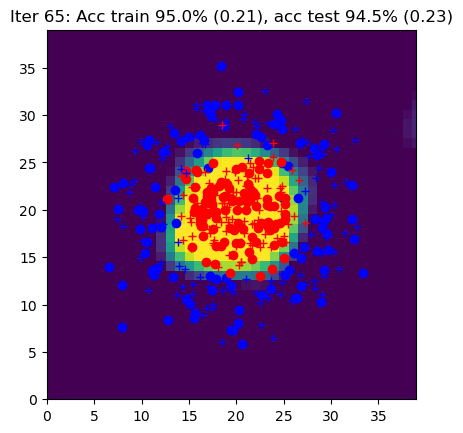

Iter 66: Acc train 95.0% (0.21), acc test 94.5% (0.23)


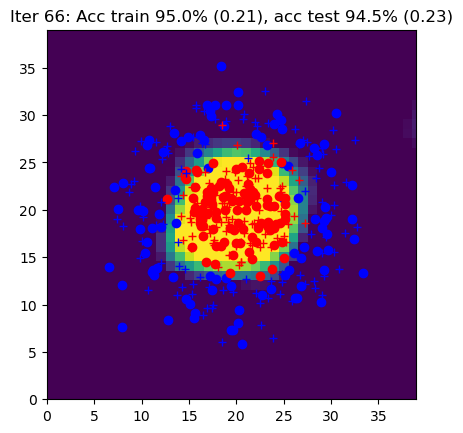

Iter 67: Acc train 95.0% (0.21), acc test 94.5% (0.22)


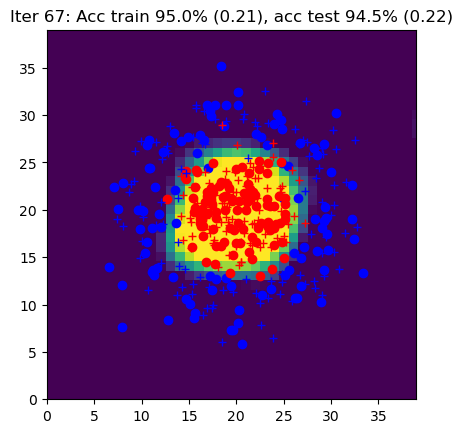

Iter 68: Acc train 95.0% (0.21), acc test 94.5% (0.22)


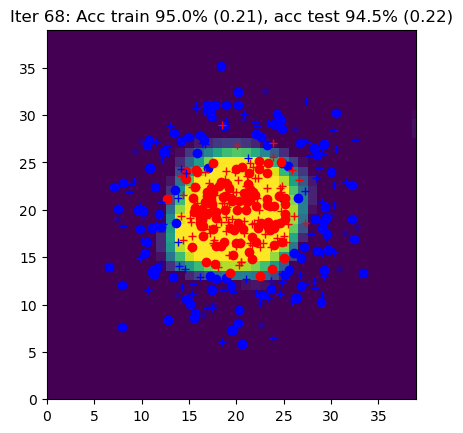

Iter 69: Acc train 95.0% (0.21), acc test 94.5% (0.22)


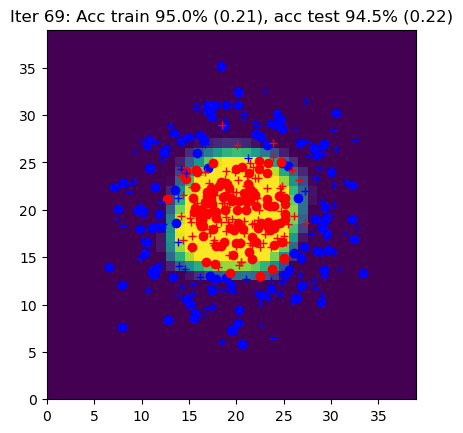

Iter 70: Acc train 96.0% (0.20), acc test 94.5% (0.22)


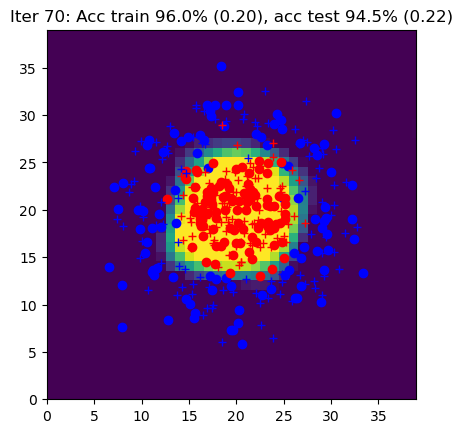

Iter 71: Acc train 96.0% (0.20), acc test 94.5% (0.22)


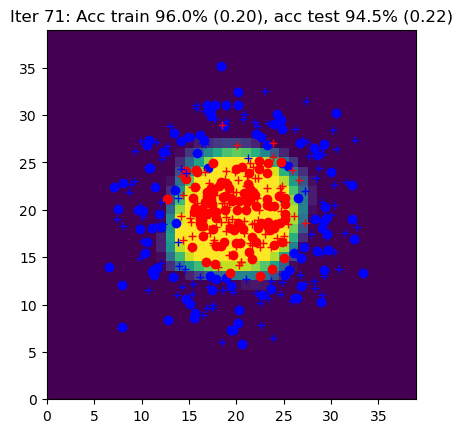

Iter 72: Acc train 95.0% (0.20), acc test 94.5% (0.22)


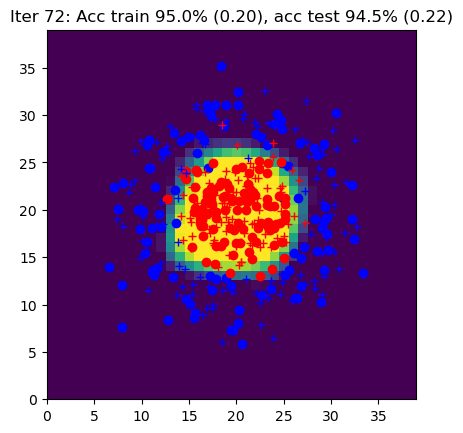

Iter 73: Acc train 95.0% (0.20), acc test 94.5% (0.22)


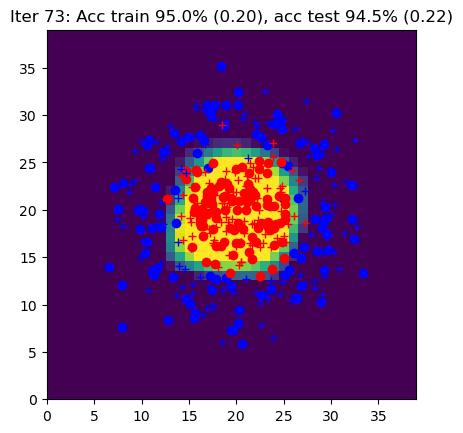

Iter 74: Acc train 94.5% (0.20), acc test 94.5% (0.21)


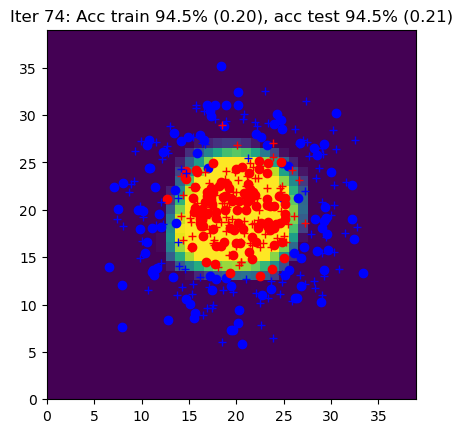

Iter 75: Acc train 96.0% (0.20), acc test 94.5% (0.21)


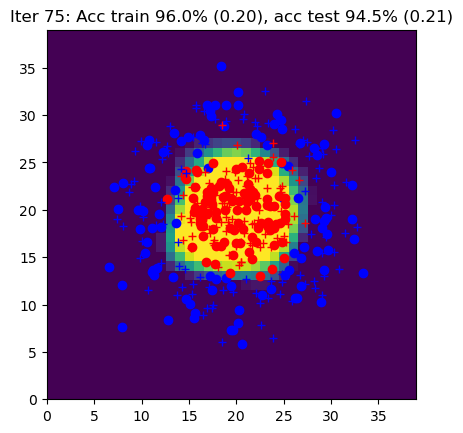

Iter 76: Acc train 95.0% (0.19), acc test 94.5% (0.21)


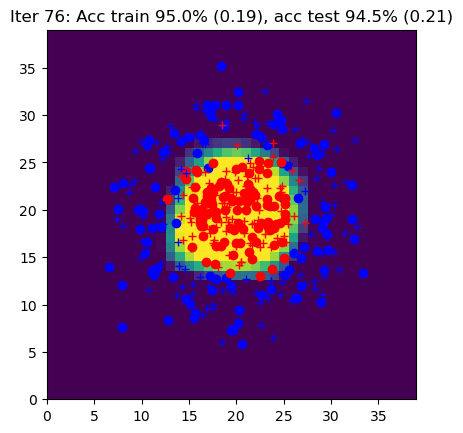

Iter 77: Acc train 95.0% (0.19), acc test 94.5% (0.21)


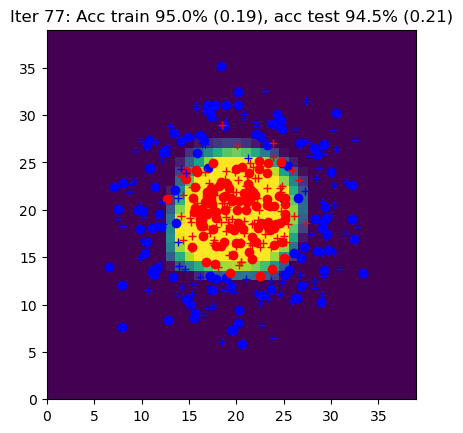

Iter 78: Acc train 96.0% (0.19), acc test 94.5% (0.21)


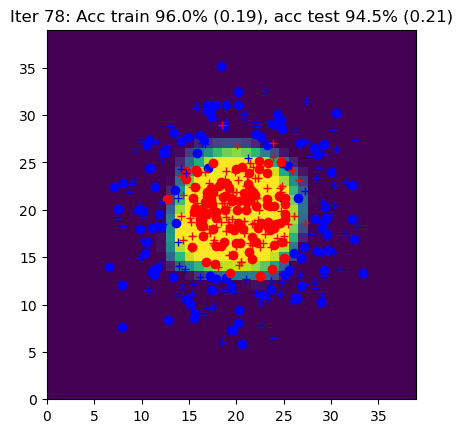

Iter 79: Acc train 95.0% (0.19), acc test 94.5% (0.21)


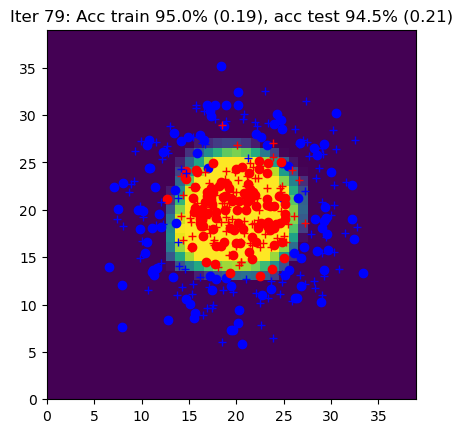

Iter 80: Acc train 95.0% (0.19), acc test 94.5% (0.21)


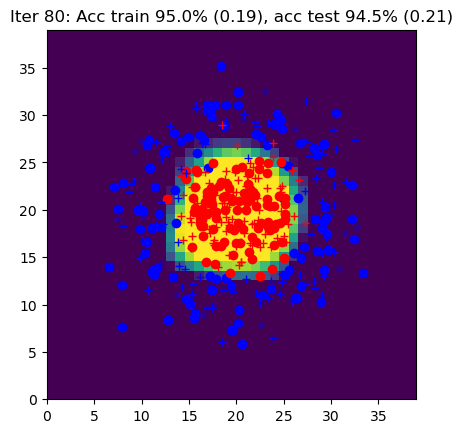

Iter 81: Acc train 96.0% (0.19), acc test 94.5% (0.21)


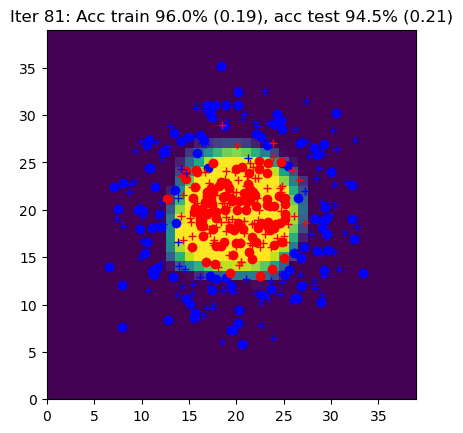

Iter 82: Acc train 96.0% (0.19), acc test 94.5% (0.20)


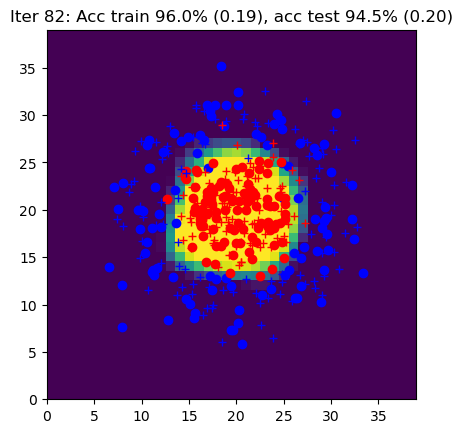

Iter 83: Acc train 96.5% (0.19), acc test 94.5% (0.20)


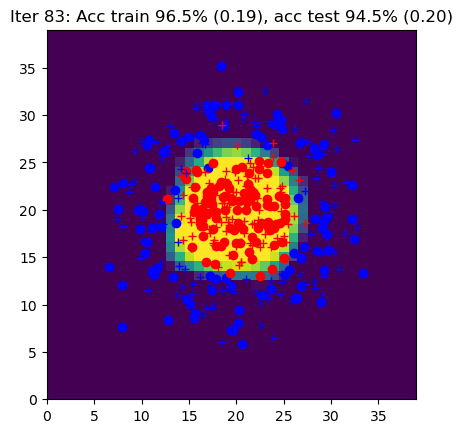

Iter 84: Acc train 96.0% (0.19), acc test 94.5% (0.20)


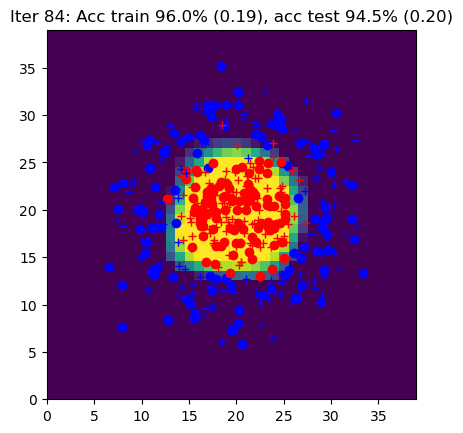

Iter 85: Acc train 96.5% (0.18), acc test 94.5% (0.20)


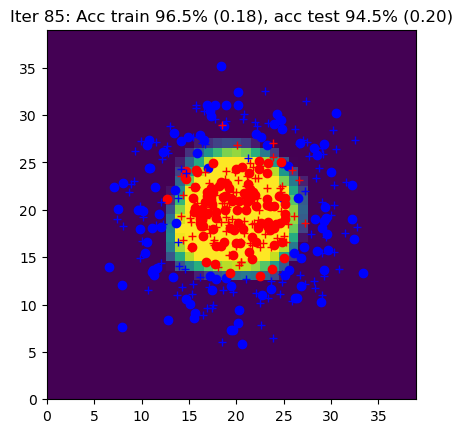

Iter 86: Acc train 96.5% (0.18), acc test 94.5% (0.20)


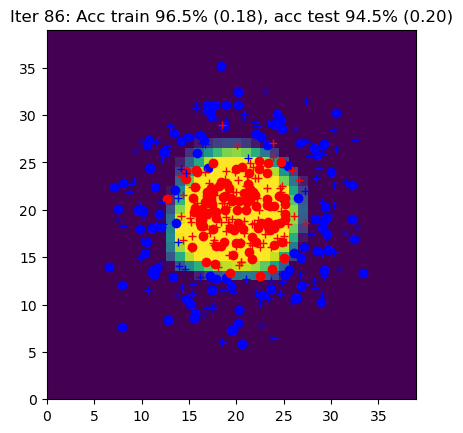

Iter 87: Acc train 96.5% (0.18), acc test 94.5% (0.20)


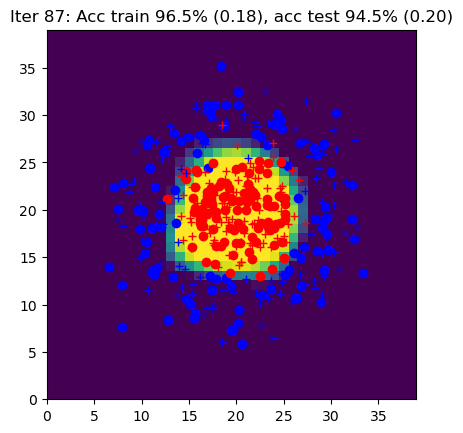

Iter 88: Acc train 96.5% (0.18), acc test 94.5% (0.20)


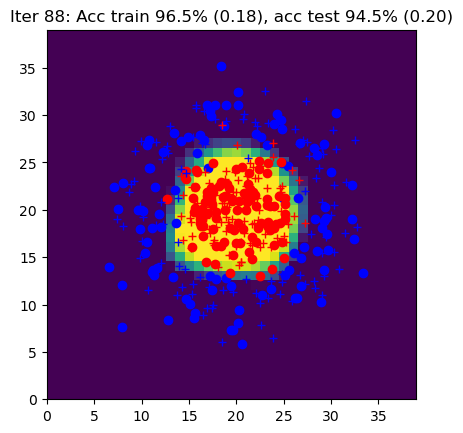

Iter 89: Acc train 96.5% (0.18), acc test 94.5% (0.20)


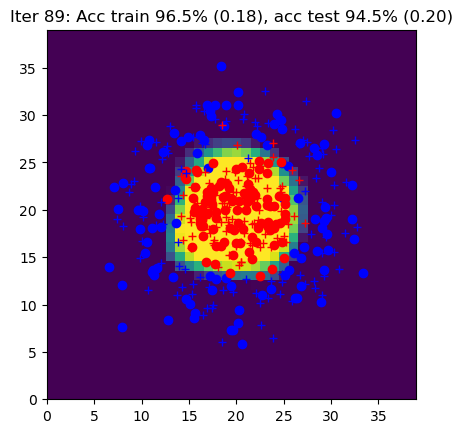

Iter 90: Acc train 96.5% (0.18), acc test 94.5% (0.20)


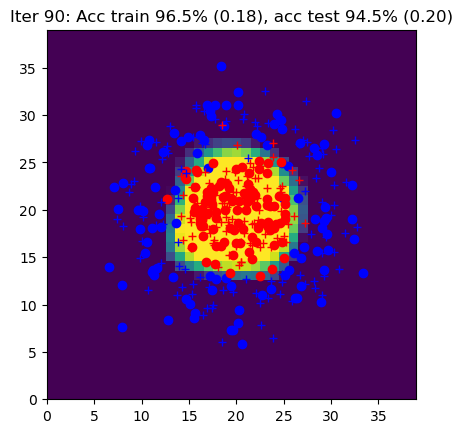

Iter 91: Acc train 96.0% (0.18), acc test 94.5% (0.20)


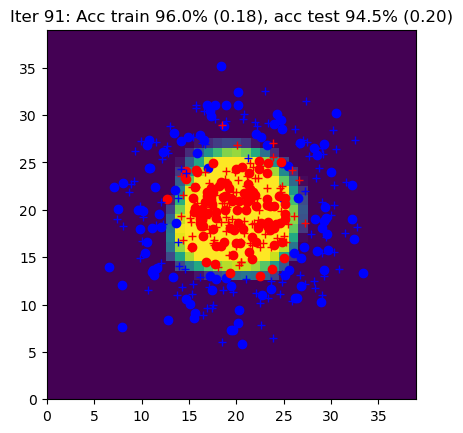

Iter 92: Acc train 95.0% (0.18), acc test 94.5% (0.20)


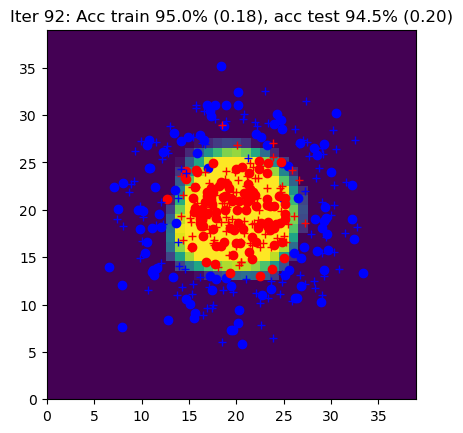

Iter 93: Acc train 95.0% (0.18), acc test 95.0% (0.20)


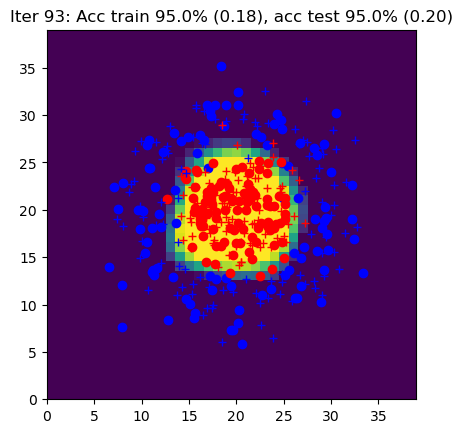

Iter 94: Acc train 96.5% (0.18), acc test 94.5% (0.19)


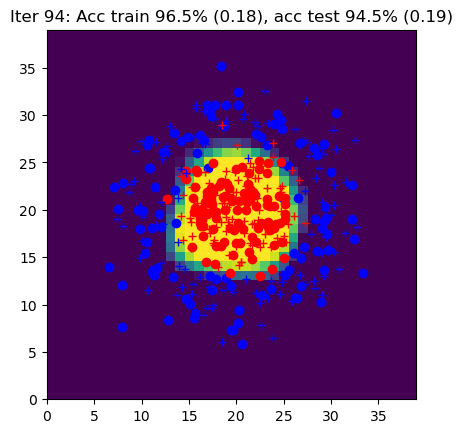

Iter 95: Acc train 96.0% (0.17), acc test 94.5% (0.19)


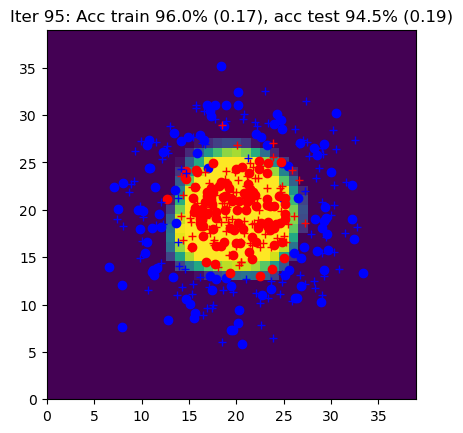

Iter 96: Acc train 95.0% (0.17), acc test 95.0% (0.19)


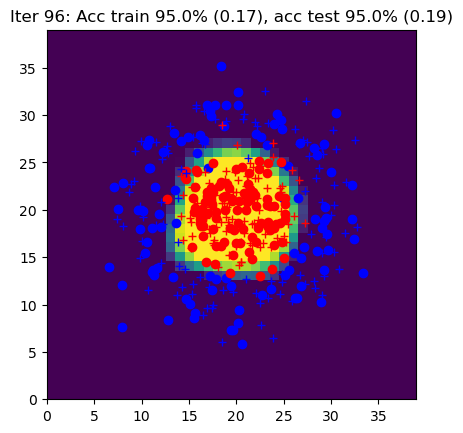

Iter 97: Acc train 96.5% (0.17), acc test 94.5% (0.19)


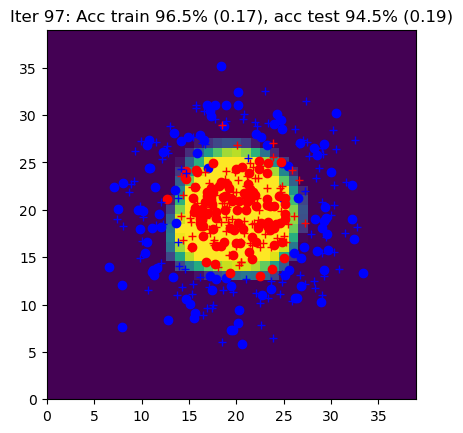

Iter 98: Acc train 95.5% (0.17), acc test 95.0% (0.19)


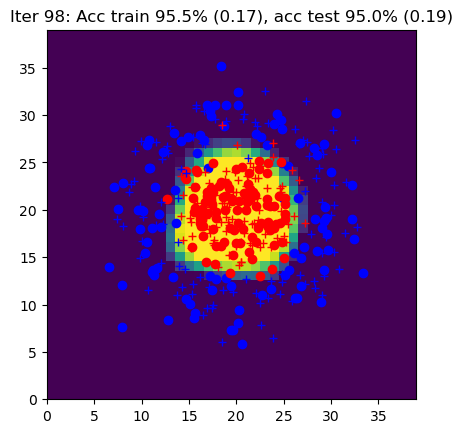

Iter 99: Acc train 95.5% (0.17), acc test 94.5% (0.19)


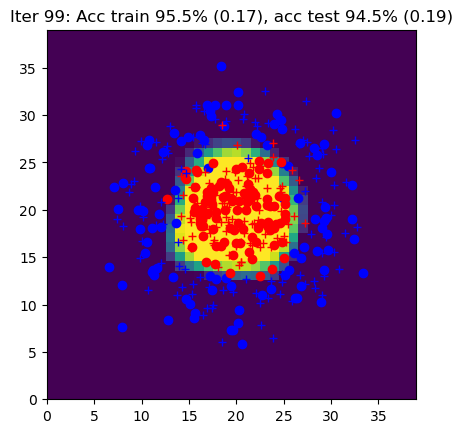

Iter 100: Acc train 96.5% (0.17), acc test 94.5% (0.19)


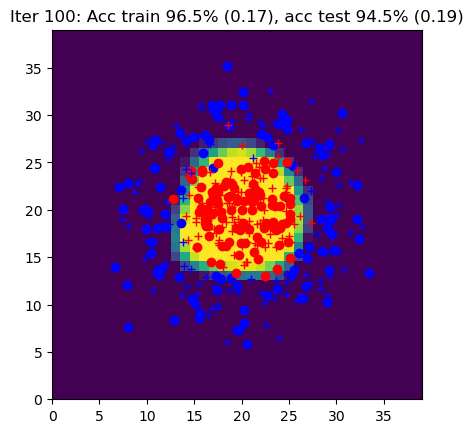

Iter 101: Acc train 96.5% (0.17), acc test 94.5% (0.19)


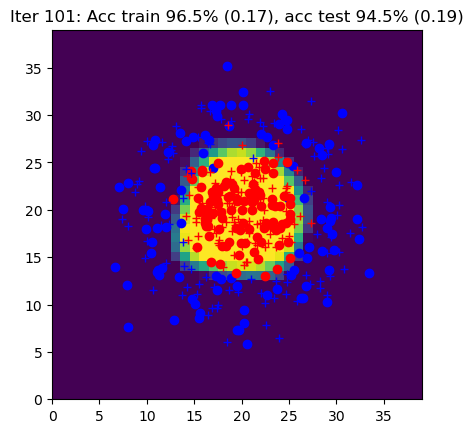

Iter 102: Acc train 96.5% (0.17), acc test 94.5% (0.19)


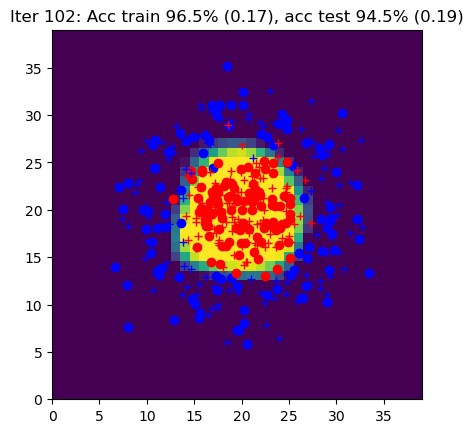

Iter 103: Acc train 96.5% (0.17), acc test 94.5% (0.19)


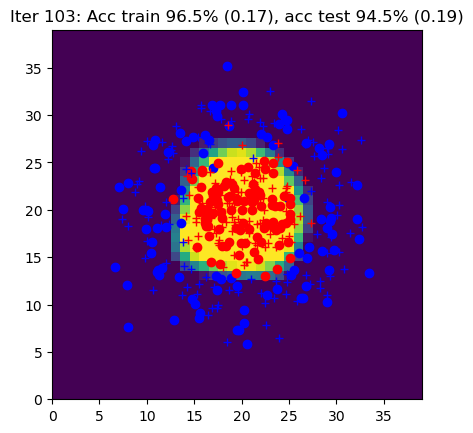

Iter 104: Acc train 96.5% (0.17), acc test 94.5% (0.19)


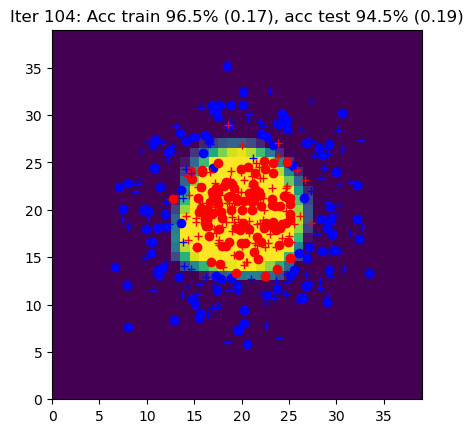

Iter 105: Acc train 96.5% (0.17), acc test 94.5% (0.19)


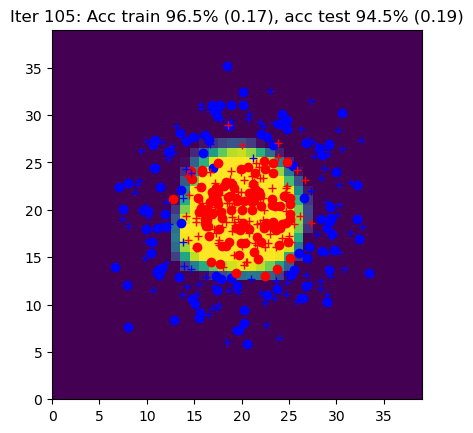

Iter 106: Acc train 96.0% (0.17), acc test 95.0% (0.19)


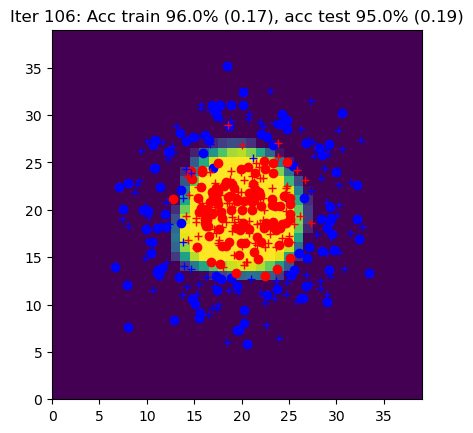

Iter 107: Acc train 96.5% (0.17), acc test 94.5% (0.18)


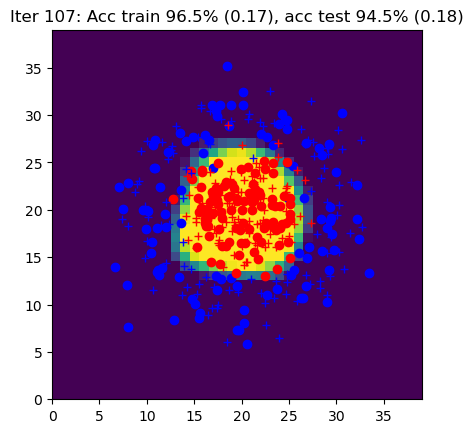

Iter 108: Acc train 96.5% (0.16), acc test 94.5% (0.18)


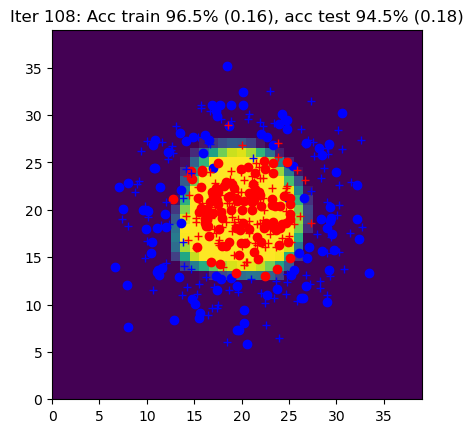

Iter 109: Acc train 96.5% (0.16), acc test 94.5% (0.18)


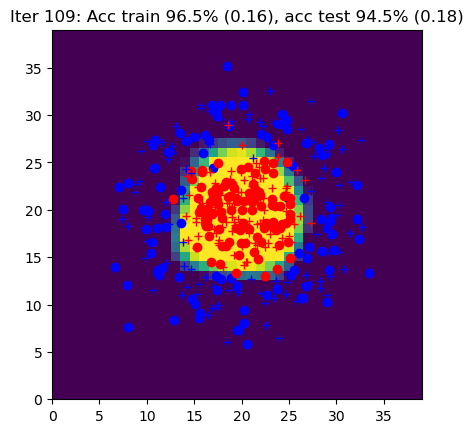

Iter 110: Acc train 96.5% (0.16), acc test 94.5% (0.18)


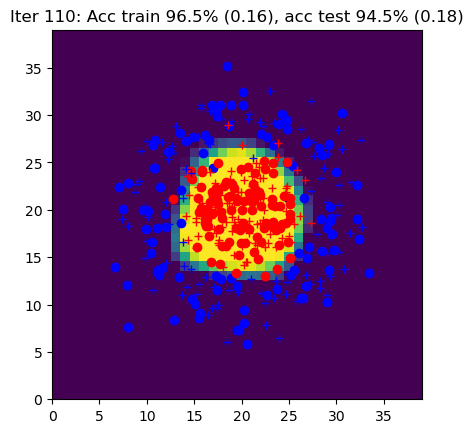

Iter 111: Acc train 96.5% (0.16), acc test 94.5% (0.18)


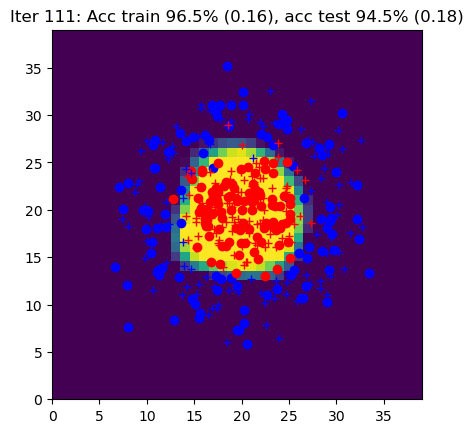

Iter 112: Acc train 96.5% (0.16), acc test 94.5% (0.18)


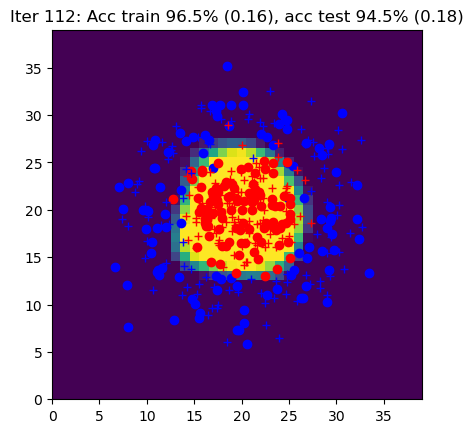

Iter 113: Acc train 96.5% (0.16), acc test 95.0% (0.18)


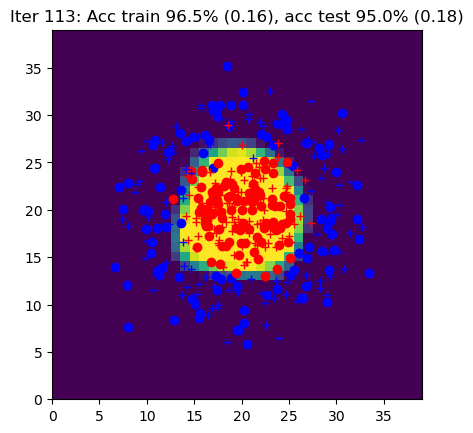

Iter 114: Acc train 96.5% (0.16), acc test 95.0% (0.18)


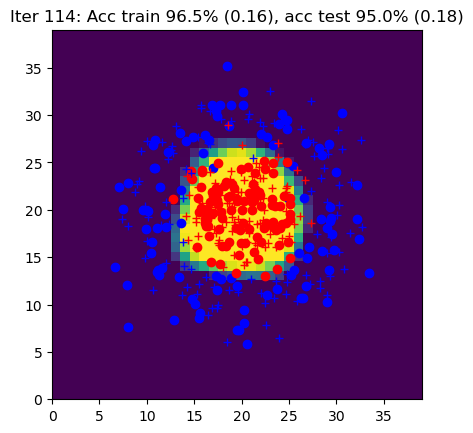

Iter 115: Acc train 96.5% (0.16), acc test 94.5% (0.18)


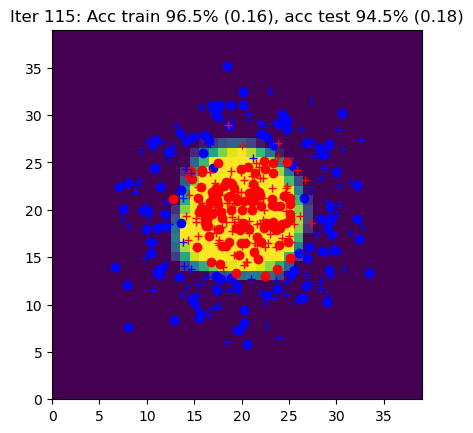

Iter 116: Acc train 96.0% (0.16), acc test 95.0% (0.18)


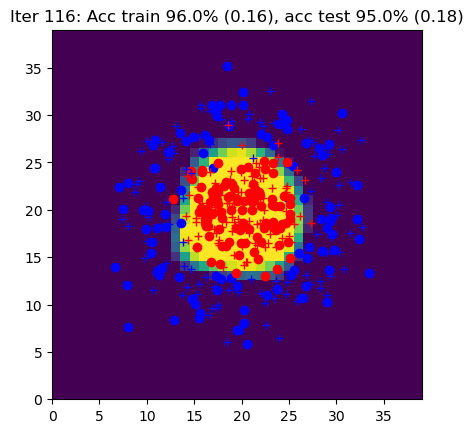

Iter 117: Acc train 96.5% (0.16), acc test 95.0% (0.18)


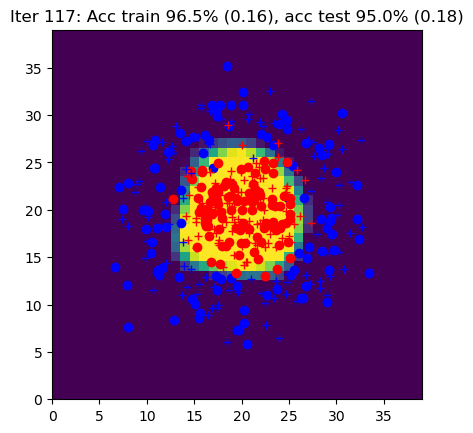

Iter 118: Acc train 96.5% (0.16), acc test 94.5% (0.18)


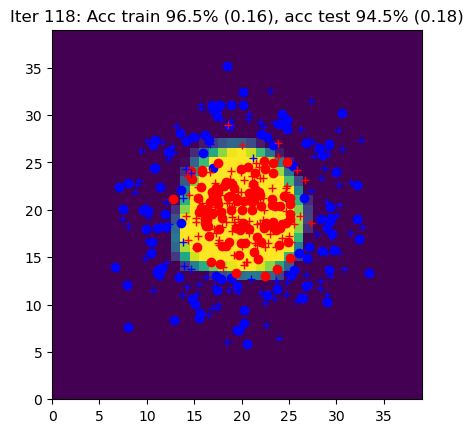

Iter 119: Acc train 96.5% (0.16), acc test 94.5% (0.18)


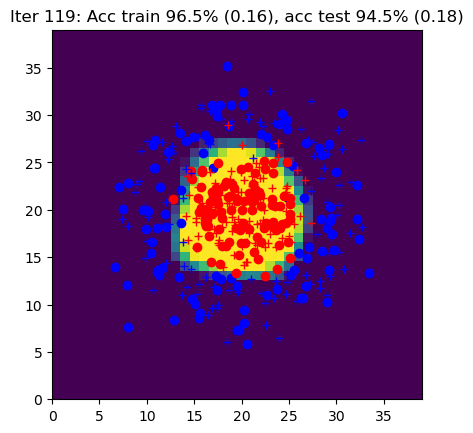

Iter 120: Acc train 96.5% (0.16), acc test 94.5% (0.18)


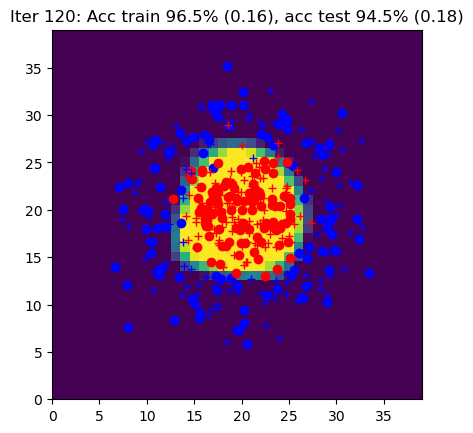

Iter 121: Acc train 96.0% (0.16), acc test 95.0% (0.18)


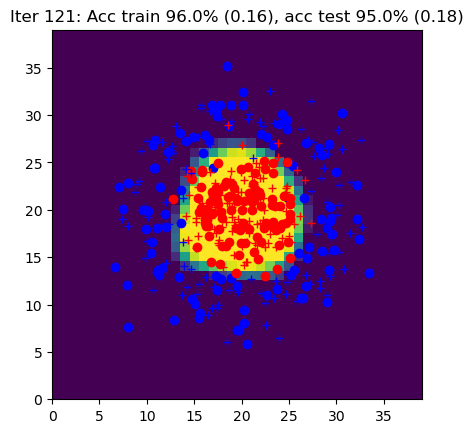

Iter 122: Acc train 96.0% (0.16), acc test 95.0% (0.18)


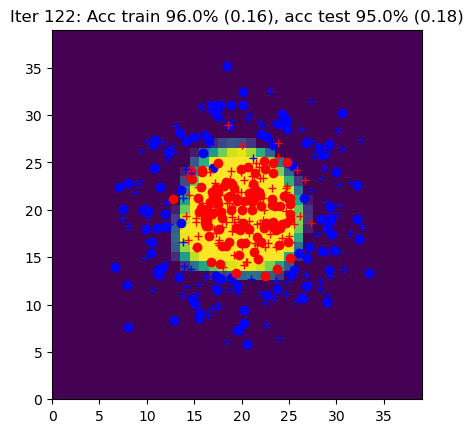

Iter 123: Acc train 96.0% (0.16), acc test 95.0% (0.18)


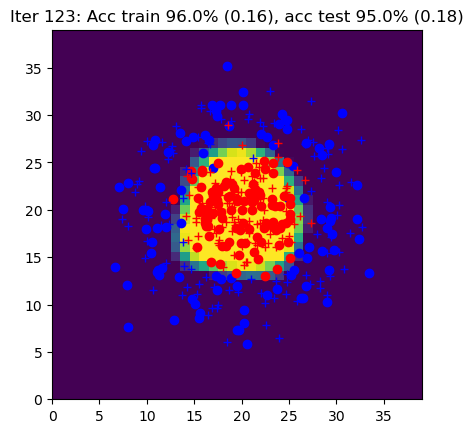

Iter 124: Acc train 96.5% (0.16), acc test 95.0% (0.18)


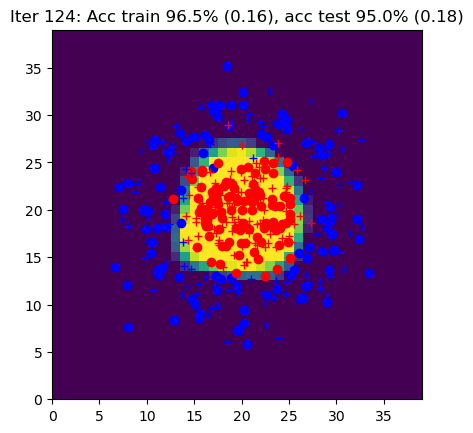

Iter 125: Acc train 96.0% (0.15), acc test 95.0% (0.18)


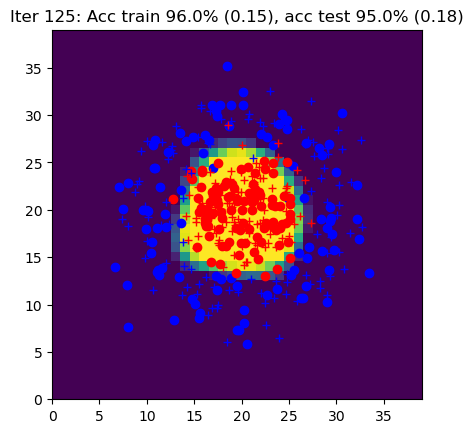

Iter 126: Acc train 96.5% (0.15), acc test 95.0% (0.18)


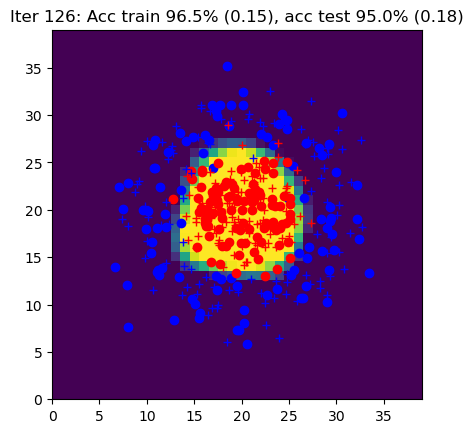

Iter 127: Acc train 96.5% (0.15), acc test 95.0% (0.17)


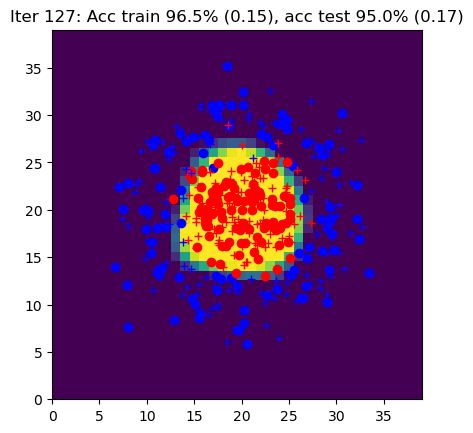

Iter 128: Acc train 96.5% (0.15), acc test 95.0% (0.17)


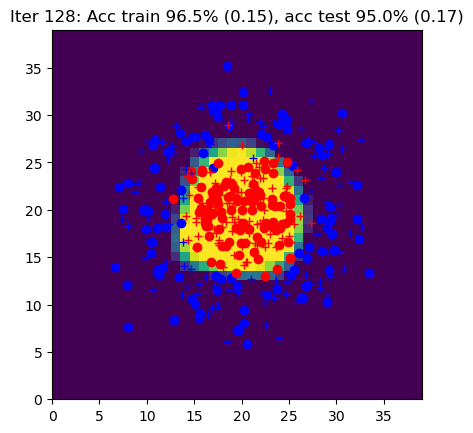

Iter 129: Acc train 96.0% (0.15), acc test 95.0% (0.18)


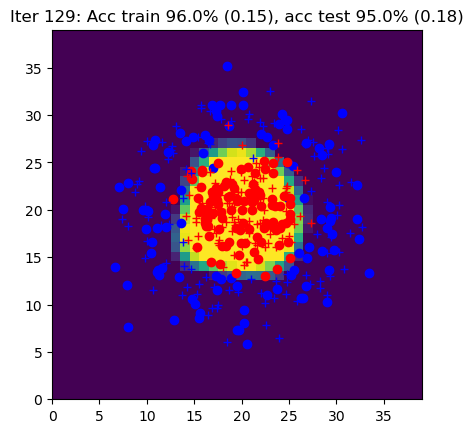

Iter 130: Acc train 96.0% (0.15), acc test 95.0% (0.17)


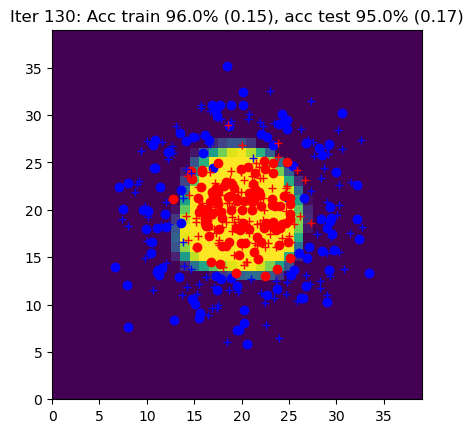

Iter 131: Acc train 96.0% (0.15), acc test 95.0% (0.17)


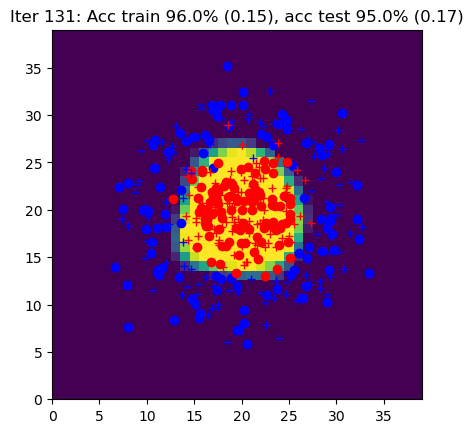

Iter 132: Acc train 96.5% (0.15), acc test 95.0% (0.17)


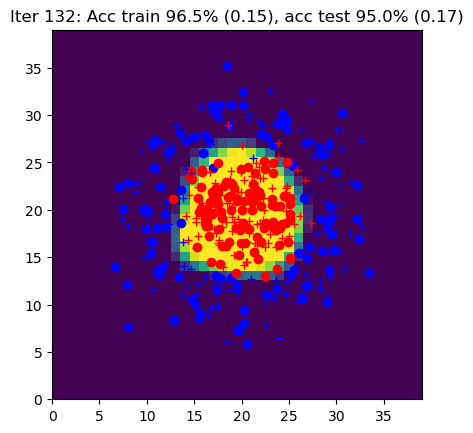

Iter 133: Acc train 96.5% (0.15), acc test 95.0% (0.17)


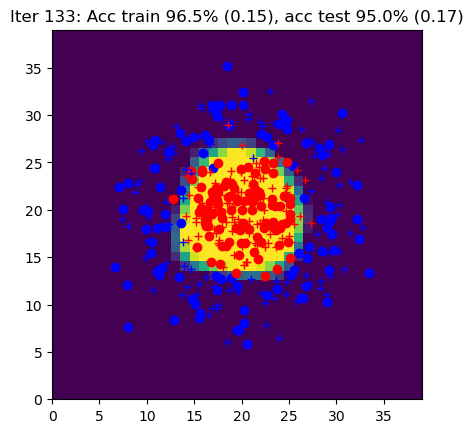

Iter 134: Acc train 96.5% (0.15), acc test 95.0% (0.17)


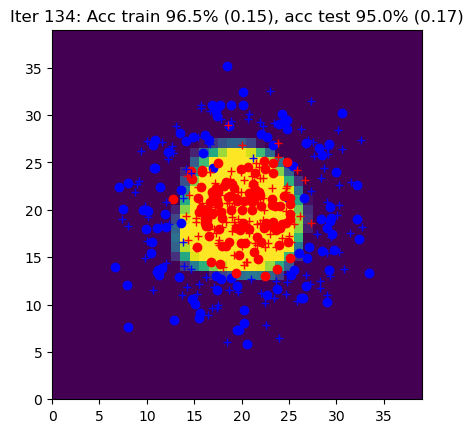

Iter 135: Acc train 96.5% (0.15), acc test 95.0% (0.17)


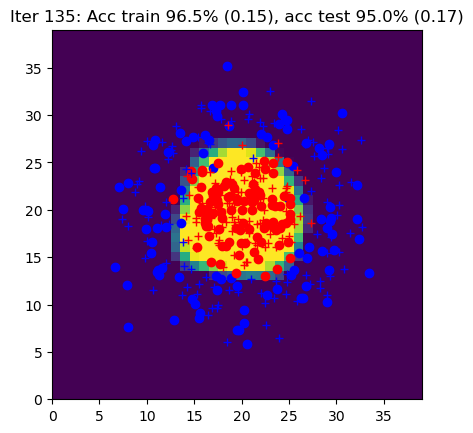

Iter 136: Acc train 96.5% (0.15), acc test 95.0% (0.17)


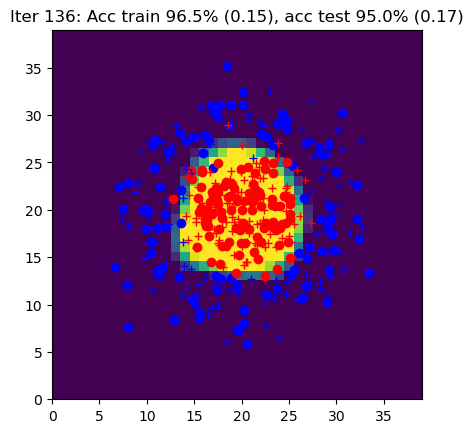

Iter 137: Acc train 96.5% (0.15), acc test 95.0% (0.17)


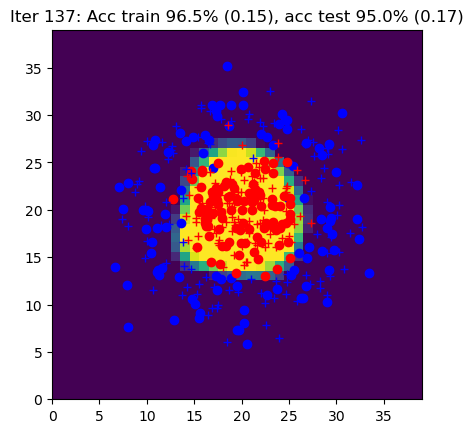

Iter 138: Acc train 96.5% (0.15), acc test 95.0% (0.17)


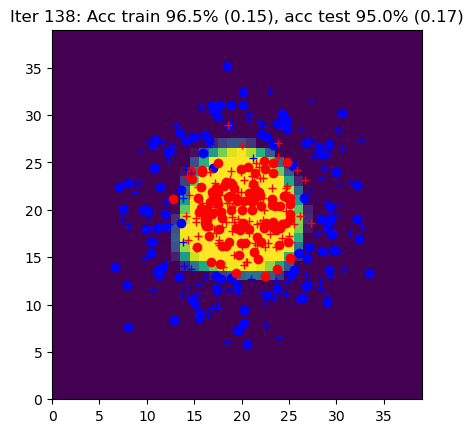

Iter 139: Acc train 95.5% (0.15), acc test 95.0% (0.17)


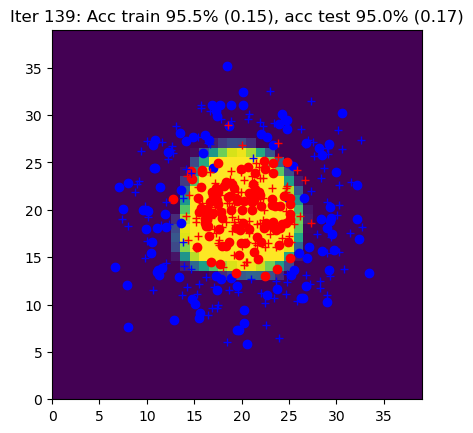

Iter 140: Acc train 96.0% (0.15), acc test 95.0% (0.17)


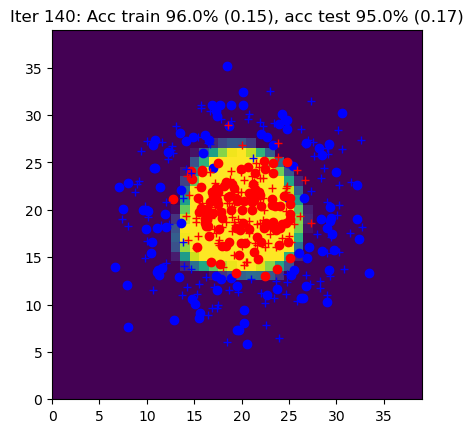

Iter 141: Acc train 96.5% (0.15), acc test 95.0% (0.17)


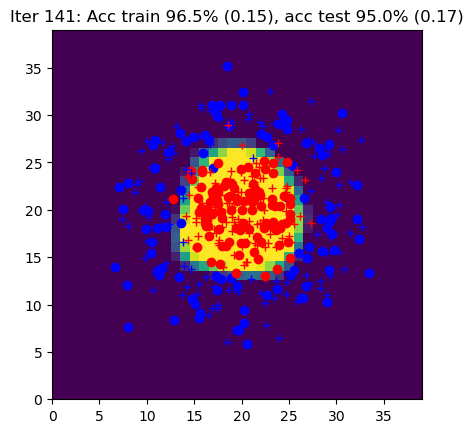

Iter 142: Acc train 96.5% (0.15), acc test 95.0% (0.17)


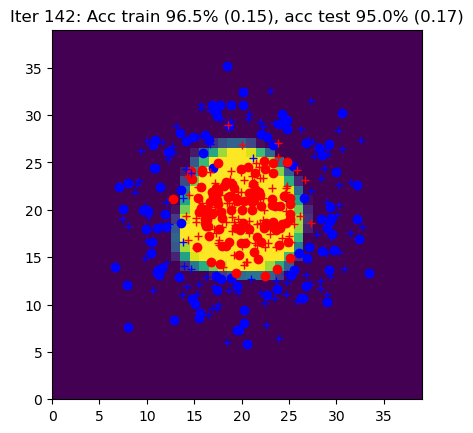

Iter 143: Acc train 96.5% (0.15), acc test 95.0% (0.17)


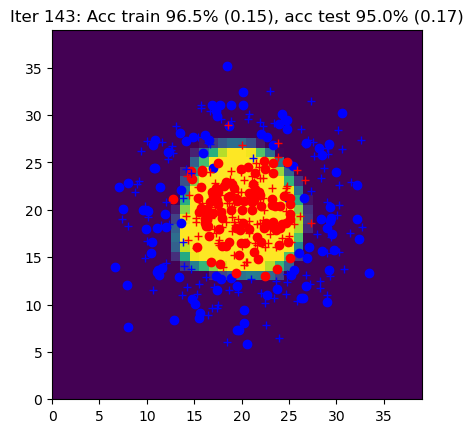

Iter 144: Acc train 96.5% (0.15), acc test 95.0% (0.17)


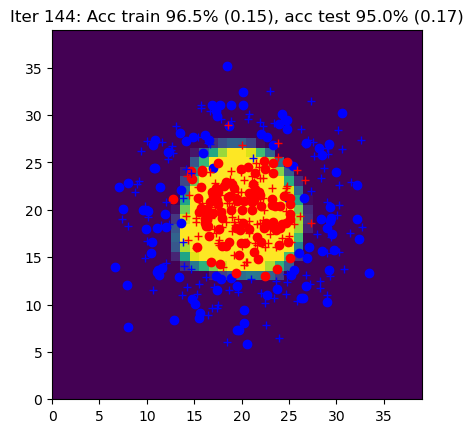

Iter 145: Acc train 96.5% (0.15), acc test 95.0% (0.17)


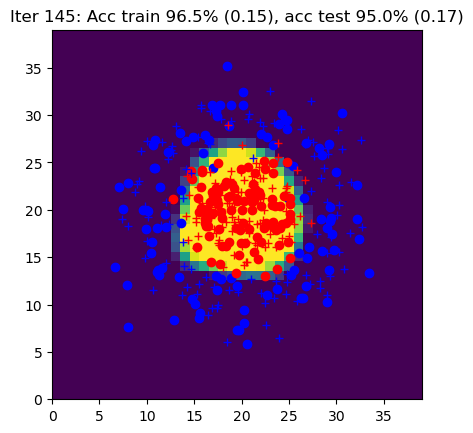

Iter 146: Acc train 96.5% (0.15), acc test 95.0% (0.17)


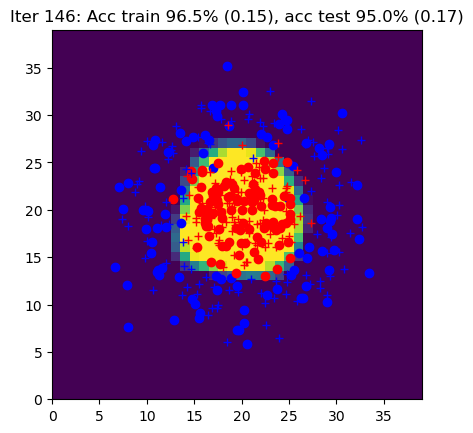

Iter 147: Acc train 96.5% (0.15), acc test 95.0% (0.17)


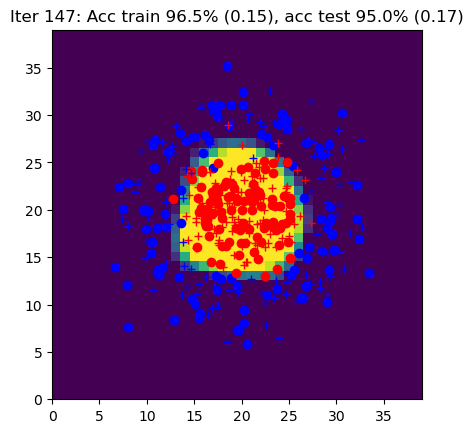

Iter 148: Acc train 96.5% (0.14), acc test 95.0% (0.17)


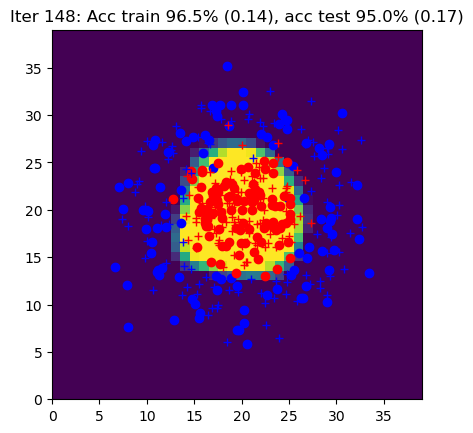

Iter 149: Acc train 96.5% (0.14), acc test 95.0% (0.17)


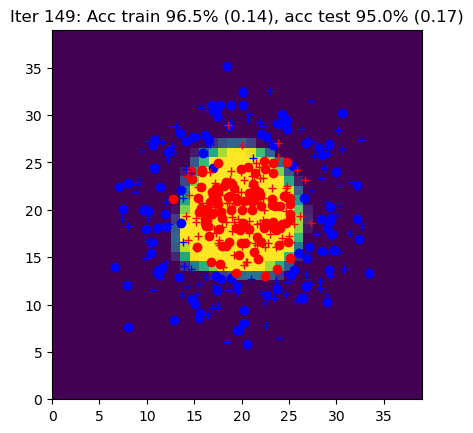

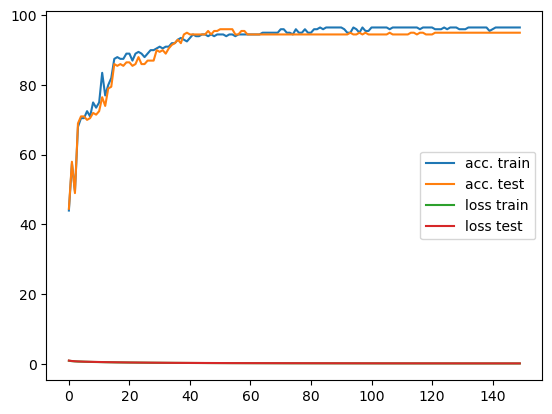

In [15]:
# init
from copy import deepcopy
data = CirclesData()
data.plot_data()
N = data.Xtrain.shape[0]
Nbatch = 10
nx = data.Xtrain.shape[1]
nh = 10
ny = data.Ytrain.shape[1]
eta = 0.03

params = init_params(nx, nh, ny)

curves = [[],[], [], []]

# epoch
for iteration in range(150):

    # permute
    perm = np.random.permutation(N)
    Xtrain = data.Xtrain[perm, :]
    Ytrain = data.Ytrain[perm, :]

    #####################
    ## Your code here  ##
    #####################
    # batches
    for j in range(N // Nbatch):

        indsBatch = range(j * Nbatch, (j+1) * Nbatch)
        X = Xtrain[indsBatch, :]
        Y = Ytrain[indsBatch, :]
        
        yhat, outputs = forward(params, X)
        L, acc = loss_accuracy(yhat, Y)
        L.backward()
        params = sgd(params, eta)
        
        
        
        # write the optimization algorithm on the batch (X,Y)
        # using the functions: forward, loss_accuracy, sgd
        # and the backward function with autograd

    ####################
    ##      END        #
    ####################


    Yhat_train, _ = forward(params, data.Xtrain)
    Yhat_test, _ = forward(params, data.Xtest)
    Ltrain, acctrain = loss_accuracy(Yhat_train, data.Ytrain)
    Ltest, acctest = loss_accuracy(Yhat_test, data.Ytest)
    Ygrid, _ = forward(params, data.Xgrid)

    title = 'Iter {}: Acc train {:.1f}% ({:.2f}), acc test {:.1f}% ({:.2f})'.format(iteration, acctrain, Ltrain, acctest, Ltest)
    print(title)
    # detach() is used to remove the predictions from the computational graph in autograd
    data.plot_data_with_grid(Ygrid.detach(), title)

    curves[0].append(torch.tensor(acctrain))
    curves[1].append(torch.tensor(acctest))
    curves[2].append(torch.tensor(Ltrain))
    curves[3].append(torch.tensor(Ltest))

fig = plt.figure()
plt.plot(curves[0], label="acc. train")
plt.plot(curves[1], label="acc. test")
plt.plot(curves[2], label="loss train")
plt.plot(curves[3], label="loss test")
plt.legend()
plt.show()

# Part 3 : Simplification of the forward pass with `torch.nn`

`init_params` and `forward` are replaced by the `init_model` function which defines the network architecture and the loss.

In [ ]:
import torch.nn as nn
def init_model(nx, nh, ny):

    #####################
    ## Your code here  ##
    #####################

    model = nn.Sequential(
        nn.Linear(nx, nh),
        nn.Tanh(),
        nn.Linear(nh, ny), 
    )
    loss = nn.CrossEntropyLoss()

    ####################
    ##      END        #
    ####################

    return model, loss

In [ ]:
def loss_accuracy(loss, Yhat, Y):

    #####################
    ## Your code here  ##
    #####################
    # call the loss function
    
    _, index_yhat = torch.max(Yhat, 1)
    _, index_y = torch.max(Y, 1)

    L = loss(Yhat, Y)
    acc = torch.count_nonzero(index_yhat == index_y) / torch.numel(index_yhat) * 100
    

    ####################
    ##      END        #
    ####################

    return L, acc

In [ ]:
def sgd(model, eta):

    #####################
    ## Your code here  ##
    #####################
    # update the network weights
    # warning: use torch.no_grad()
    # and reset to zero the gradient accumulators
    

    ####################
    ##      END        #
    ####################
    return model

## Global learning procedure with autograd and `torch.nn`

In [ ]:
# init
data = CirclesData()
data.plot_data()
N = data.Xtrain.shape[0]
Nbatch = 10
nx = data.Xtrain.shape[1]
nh = 10
ny = data.Ytrain.shape[1]
eta = 0.03

model, loss = init_model(nx, nh, ny)

curves = [[],[], [], []]

# epoch
for iteration in range(150):

    # permute
    perm = np.random.permutation(N)
    Xtrain = data.Xtrain[perm, :]
    Ytrain = data.Ytrain[perm, :]

    #####################
    ## Your code here  ##
    #####################
    # batches
    for j in range(N // Nbatch):

        indsBatch = range(j * Nbatch, (j+1) * Nbatch)
        X = Xtrain[indsBatch, :]
        Y = Ytrain[indsBatch, :]

        # write the optimization algorithm on the batch (X,Y)
        # using the functions: loss_accuracy, sgd
        # the forward with the predict method from the model
        # and the backward function with autograd

    ####################
    ##      END        #
    ####################


    Yhat_train = model(data.Xtrain)
    Yhat_test = model(data.Xtest)
    Ltrain, acctrain = loss_accuracy(loss, Yhat_train, data.Ytrain)
    Ltest, acctest = loss_accuracy(loss, Yhat_test, data.Ytest)
    Ygrid = model(data.Xgrid)

    title = 'Iter {}: Acc train {:.1f}% ({:.2f}), acc test {:.1f}% ({:.2f})'.format(iteration, acctrain, Ltrain, acctest, Ltest)
    print(title)
    data.plot_data_with_grid(torch.nn.Softmax(dim=1)(Ygrid.detach()), title)

    curves[0].append(acctrain)
    curves[1].append(acctest)
    curves[2].append(Ltrain)
    curves[3].append(Ltest)

fig = plt.figure()
plt.plot(curves[0], label="acc. train")
plt.plot(curves[1], label="acc. test")
plt.plot(curves[2], label="loss train")
plt.plot(curves[3], label="loss test")
plt.legend()
plt.show()

# Part 4 : Simplification of the SGD with `torch.optim`

In [ ]:
def init_model(nx, nh, ny, eta):

    #####################
    ## Your code here  ##
    #####################

    model = None
    loss = None
    optim = None

    ####################
    ##      END        #
    ####################

    return model, loss, optim

The `sgd` function is replaced by calling the `optim.zero_grad()` before the backward and `optim.step()` after.

## Algorithme global d'apprentissage (avec autograd, les couches `torch.nn` et `torch.optim`)

In [ ]:
# init
data = CirclesData()
data.plot_data()
N = data.Xtrain.shape[0]
Nbatch = 10
nx = data.Xtrain.shape[1]
nh = 10
ny = data.Ytrain.shape[1]
eta = 0.03

model, loss, optim = init_model(nx, nh, ny, eta)

curves = [[],[], [], []]

# epoch
for iteration in range(150):

    # permute
    perm = np.random.permutation(N)
    Xtrain = data.Xtrain[perm, :]
    Ytrain = data.Ytrain[perm, :]

    #####################
    ## Your code  here ##
    #####################
    # batches
    for j in range(N // Nbatch):

        indsBatch = range(j * Nbatch, (j+1) * Nbatch)
        X = Xtrain[indsBatch, :]
        Y = Ytrain[indsBatch, :]

        # write the optimization algorithm on the batch (X,Y)
        # using the functions: loss_accuracy
        # the forward with the predict method from the model
        # the backward function with autograd
        # and then an optimization step

    ####################
    ##      FIN        #
    ####################


    Yhat_train = model(data.Xtrain)
    Yhat_test = model(data.Xtest)
    Ltrain, acctrain = loss_accuracy(loss, Yhat_train, data.Ytrain)
    Ltest, acctest = loss_accuracy(loss, Yhat_test, data.Ytest)
    Ygrid = model(data.Xgrid)

    title = 'Iter {}: Acc train {:.1f}% ({:.2f}), acc test {:.1f}% ({:.2f})'.format(iteration, acctrain, Ltrain, acctest, Ltest)
    print(title)
    data.plot_data_with_grid(torch.nn.Softmax(dim=1)(Ygrid.detach()), title)

    curves[0].append(acctrain)
    curves[1].append(acctest)
    curves[2].append(Ltrain)
    curves[3].append(Ltest)

fig = plt.figure()
plt.plot(curves[0], label="acc. train")
plt.plot(curves[1], label="acc. test")
plt.plot(curves[2], label="loss train")
plt.plot(curves[3], label="loss test")
plt.legend()
plt.show()

# Part 5 : MNIST

Apply the code from previous part code to the MNIST dataset.

In [ ]:
# init
data = MNISTData()
N = data.Xtrain.shape[0]
Nbatch = 100
nx = data.Xtrain.shape[1]
nh = 100
ny = data.Ytrain.shape[1]
eta = 0.03

# Part 6: Bonus: SVM


Train a SVM model on the Circles dataset.

Ideas :
- First try a linear SVM (sklearn.svm.LinearSVC dans scikit-learn). Does it work well ? Why ?
- Then try more complex kernels (sklearn.svm.SVC). Which one is the best ? why ?
- Does the parameter C of regularization have an impact? Why ?

In [ ]:
# data
data = CirclesData()
Xtrain = data.Xtrain.numpy()
Ytrain = data.Ytrain[:, 0].numpy()

Xgrid = data.Xgrid.numpy()

Xtest = data.Xtest.numpy()
Ytest = data.Ytest[:, 0].numpy()

def plot_svm_predictions(data, predictions):
      plt.figure(2)
      plt.clf()
      plt.imshow(np.reshape(predictions, (40,40)))
      plt.plot(data._Xtrain[data._Ytrain[:,0] == 1,0]*10+20, data._Xtrain[data._Ytrain[:,0] == 1,1]*10+20, 'bo', label="Train")
      plt.plot(data._Xtrain[data._Ytrain[:,1] == 1,0]*10+20, data._Xtrain[data._Ytrain[:,1] == 1,1]*10+20, 'ro')
      plt.plot(data._Xtest[data._Ytest[:,0] == 1,0]*10+20, data._Xtest[data._Ytest[:,0] == 1,1]*10+20, 'b+', label="Test")
      plt.plot(data._Xtest[data._Ytest[:,1] == 1,0]*10+20, data._Xtest[data._Ytest[:,1] == 1,1]*10+20, 'r+')
      plt.xlim(0,39)
      plt.ylim(0,39)
      plt.clim(0.3,0.7)
      plt.draw()
      plt.pause(1e-3)

In [ ]:
import sklearn.svm

############################
### Your code here   #######
### Train the SVM    #######
## See https://scikit-learn.org/stable/modules/generated/sklearn.svm.LinearSVC.html
## and https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html
############################

svm = None

###########################

In [ ]:
## Print results

Ytest_pred = svm.predict(Xtest)
accuracy = np.sum(Ytest == Ytest_pred) / len(Ytest)
print(f"Accuracy : {100 * accuracy:.2f}")
Ygrid_pred = svm.predict(Xgrid)
plot_svm_predictions(data, Ygrid_pred)